# Master's Project - Alaskan Salmon - 02/04/2025

## <span style="color:#ff0000;">Deadlines/Deliverables</span>


<span style="color:#ff0000;">Due: 02/05/2025</span>

Please create a GitHub repository for your capstone project, and share access with me (my GitHub handle is sshende). Your repository must have a README.md file describing your project - this README file should be kept up-to-date as your project evolves. Even if you are doing the project in a group (at most 2 students), you must have a repository. 

Please submit with this “assignment” a single Markdown file containing the GitHub repository address and a brief description of the proposed project and data source(s). The deadline for submission is Wednesday, Feb. 5th, by midnight. 


<span style="color:#ff0000;">Due: 04/01/2025</span>

* Have poster completed and in and printed by Tuesday, April 1st Drop-off date

<span style="color:#ff0000;">Due: 04/08/2025</span>

* Presentations are on Tuesday, April 8th 2025

<span style="color:#ff0000;">Due: 05/04/2025</span>

* Project Presentations(just 10 mins) are due on midnight, May 4th 2025
    * prepare slides

<span style="color:#ff0000;">Due: 05/05/2025</span>

* Project Reports are due at midnight, May 5th 2025
    * report is the 15-30 pages 
    * along with the codebase, I assume that is my github/this jupyter notebook

<span style="color:#ff0000;">Event on: 05/07/2025</span>

* Data Day event on May 7th 2025
    * Enhance the previous posters 

## <span style="color:#FA8072;">Presentation - Alaskan Salmon</span>


### <span style="color:#FFA07A;">Abstract</span>


Alaska’s salmon industry is a vital economic and ecological mainstay for the state, contributing approximately 80% of North America’s wild caught salmon and serving as a major source of employment and revenue. However, the industry faces growing challenges from climate change, economic pressures, and international competition. This study investigates the correlation between environmental factors such as rising ocean temperatures, sea level changes, and ocean acidification and the quantity and quality of salmon caught in Alaska. 

The null hypothesis (H₀) assumes no significant relationship between these climate variables and salmon populations, while the alternative hypothesis (H₁) suggests that climate change has a measurable impact, affecting salmon migration, spawning behaviors, and overall catch potential. 

Additionally, this research explores the economic implications of these changes, labor costs, fuel prices, and global market competition. By analyzing historical environmental data, salmon population metrics, and economic trends, this study aims to provide insights into the sustainability of the Alaskan salmon industry amid evolving climate conditions. The findings may inform policy decisions, conservation efforts, and adaptive strategies for industry stakeholders.

### <span style="color:#FFA07A;">Hypothesis</span>


H0 (Null Hypothesis): 

* There is no significant correlation between climate change factors (temperature, sea levels) and the quantity/quality of salmon caught in Alaska.

H1 (Alternative Hypothesis):

* Rising ocean temperatures and sea levels significantly impacting the quantity and quality of Alaskan salmon, leading to noticeable effects on the fishing industry.

<span style="color:#FFA07A;">Why this is important</span>


* Largest harvest in North America: Alaska's salmon harvest is the largest in North America, accounting for about 80% of the total wild-caught catch. 
* Employment: More Alaskans work in salmon harvesting and processing than in any other commercial fishery. 
* Economics: Salmon accounts for the majority of the value of Alaska seafood. 


<span style="color:#1ff2cf;">Challenges facing the salmon industry</span>

* Inflation: High inflation and interest rates have squeezed profits and liquidity for salmon processors. 
* Labor: Wages for processing workers have increased sharply. 
* Fuel: Diesel fuel prices have increased sharply. 
* Competition: Alaskan fishermen compete against unsustainable fishing and forced labor in foreign imports. 

### <span style="color:#FFA07A;">Key Factors</span>


Environmental Data:

* Ocean and river temperatures over time.
* Sea level changes in Alaskan fishing regions.
* Ocean pH levels (impacting food chains).
* Climate patterns (precipitation, storms, etc.).

Salmon Population & Quality Data:

* Total catch size (commercial and subsistence fishing).
* Average salmon weight and size.
* Disease prevalence and mortality rates.
* Changes in migration and spawning behaviors.

Economic & Industry Impact:

* Revenue trends in the Alaskan salmon industry.
* Changes in regulations and fishing quotas.
* Shifts in fishing seasons due to climate change.

### <span style="color:#FFA07A;">Datasets/Prepping Dataframes</span>


* https://erddap.bco-dmo.org/erddap/tabledap/bcodmo_dataset_3106.htmlTable

In [1]:
# get dataset
import pandas as pd
salmon = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Salmon_biodata_bcodm%20-%20salmon_biodata.csv')


In [2]:
salmon.tail(5)

,year,transect,sta_id,haul_id,month_local,day_local,yrday_local,latitude,longitude,depth_w_meters,...,length_frozen_cm,length_wet_cm,weight_froz_grams,weight_wet_grams,sex,maturity,stomwt_full,stomwt_empty,sealice,comments
27505,2004,nd,I10,2004031,11,8,313,57.3,-155.51,266,...,nd,229,nd,112,nd,J,0,0,0,nd
27506,2004,nd,I10,2004031,11,8,313,57.3,-155.51,266,...,nd,231,nd,121,nd,J,0,0,0,nd
27507,2004,nd,I10,2004031,11,8,313,57.3,-155.51,266,...,nd,216,nd,107,nd,J,0,0,0,nd
27508,2004,nd,I10,2004031,11,8,313,57.3,-155.51,266,...,nd,215,nd,105,nd,J,0,0,0,nd
27509,2004,nd,I10,2004031,11,8,313,57.3,-155.51,266,...,nd,221,nd,102,nd,J,0,0,0,nd


In [3]:
salmon.dtypes

year                     int64
transect                object
sta_id                  object
haul_id                  int64
month_local              int64
day_local                int64
yrday_local              int64
latitude               float64
longitude              float64
depth_w_meters          object
species_common_name     object
length_frozen_cm        object
length_wet_cm           object
weight_froz_grams       object
weight_wet_grams        object
sex                     object
maturity                object
stomwt_full             object
stomwt_empty            object
sealice                 object
comments                object
dtype: object

<span style="color:#fff700;"> <font size="100"><b>DEBUG</font></b></span>

In [4]:
# List of columns to check for non-numeric values
columns_to_convert = ['length_wet_cm', 'weight_wet_grams']


In [5]:
# Find non-numeric values in the selected columns
for col in columns_to_convert:
    non_numeric = salmon[col][pd.to_numeric(salmon[col], errors='coerce').isna()].unique()
    print(f"Non-numeric values in {col}: {non_numeric}")


Non-numeric values in length_wet_cm: ['nd']
Non-numeric values in weight_wet_grams: ['nd']


In [6]:
# drop all rows with missing values
salmon = salmon.dropna(subset=columns_to_convert)


In [7]:
print(salmon[columns_to_convert].dtypes)

length_wet_cm       object
weight_wet_grams    object
dtype: object


In [8]:
# I am casting from object to float for these columns with decimal numberts
columns_to_convert = salmon['length_frozen_cm']  # replace with your actual column names
#salmon[columns_to_convert] = salmon[columns_to_convert].astype('float64')

In [9]:
nd_rows = salmon[salmon.applymap(lambda x: x == 'nd')]
print(nd_rows)



       year transect sta_id  haul_id  month_local  day_local  yrday_local  \
0       NaN      NaN    NaN      NaN          NaN        NaN          NaN   
1       NaN      NaN    NaN      NaN          NaN        NaN          NaN   
2       NaN      NaN    NaN      NaN          NaN        NaN          NaN   
3       NaN      NaN    NaN      NaN          NaN        NaN          NaN   
4       NaN      NaN    NaN      NaN          NaN        NaN          NaN   
...     ...      ...    ...      ...          ...        ...          ...   
27505   NaN       nd    NaN      NaN          NaN        NaN          NaN   
27506   NaN       nd    NaN      NaN          NaN        NaN          NaN   
27507   NaN       nd    NaN      NaN          NaN        NaN          NaN   
27508   NaN       nd    NaN      NaN          NaN        NaN          NaN   
27509   NaN       nd    NaN      NaN          NaN        NaN          NaN   

       latitude  longitude depth_w_meters  ... length_frozen_cm length_wet_

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3362157710.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  nd_rows = salmon[salmon.applymap(lambda x: x == 'nd')]


These following 3 code blocks got rid of the nd rows

In [10]:
import numpy as np

# Replace all 'nd' values with NaN
salmon = salmon.applymap(lambda x: np.nan if x == 'nd' else x)

# Verify if 'nd' has been replaced
print(salmon.isna().sum())  # Shows count of NaN values in each column


C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3843624464.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  salmon = salmon.applymap(lambda x: np.nan if x == 'nd' else x)


year                       0
transect                3643
sta_id                     0
haul_id                    0
month_local                0
day_local                  0
yrday_local                0
latitude                   0
longitude                  0
depth_w_meters           195
species_common_name        0
length_frozen_cm       12930
length_wet_cm           4036
weight_froz_grams      12840
weight_wet_grams        4060
sex                    19718
maturity                   0
stomwt_full            19402
stomwt_empty           19402
sealice                 9662
comments               26797
dtype: int64


In [11]:
print((salmon == 'nd').sum().sum())  # Should print 0 if all 'nd' are replaced

0


In [12]:
print(salmon.isna().sum())  # Shows count of NaN values per column


year                       0
transect                3643
sta_id                     0
haul_id                    0
month_local                0
day_local                  0
yrday_local                0
latitude                   0
longitude                  0
depth_w_meters           195
species_common_name        0
length_frozen_cm       12930
length_wet_cm           4036
weight_froz_grams      12840
weight_wet_grams        4060
sex                    19718
maturity                   0
stomwt_full            19402
stomwt_empty           19402
sealice                 9662
comments               26797
dtype: int64


In [13]:
# may be able to delete this as it was unnecessary
# columns_to_convertFloat = columns_to_convert.astype('float64')

Need top cast a lot of these objects to float, such as length and weight

In [14]:
# If you want to convert multiple columns
# I am casting from object to float for these columns with decimal numberts
columns_to_convert = salmon['depth_w_meters','depth_w_meters', 'length_frozen_cm', 'length_wet_cm', 'weight_froz_grams', 'weight_wet_grams']  # replace with your actual column names
salmon[columns_to_convert] = salmon[columns_to_convert].astype('float64')

KeyError: ('depth_w_meters', 'depth_w_meters', 'length_frozen_cm', 'length_wet_cm', 'weight_froz_grams', 'weight_wet_grams')

## <span style="color:#FA8072;">2025-02-08 - Salmon Data Analysis</span>


Let us do some data prep and analysis to see what this salmon biological dataset gives us.

In [15]:
species_counts = salmon['species_common_name'].value_counts()
print(species_counts)

species_common_name
Pink       12615
Chum        9543
Sockeye     2460
Coho        2170
Chinook      722
Name: count, dtype: int64


<span style="color:#fff700;"> <font size="100"><b>DEBUG</font></b></span>
This works now - 04/24/2025

In [16]:
# Calculate correlation between length and weight
correlation = salmon['length_wet_cm'].corr(salmon['weight_wet_grams'])
print(f'Correlation between length and weight: {correlation}')


Correlation between length and weight: 0.8303149437667976


<b><span style="color:#c0cfb2;">Data Visualization</span></b>


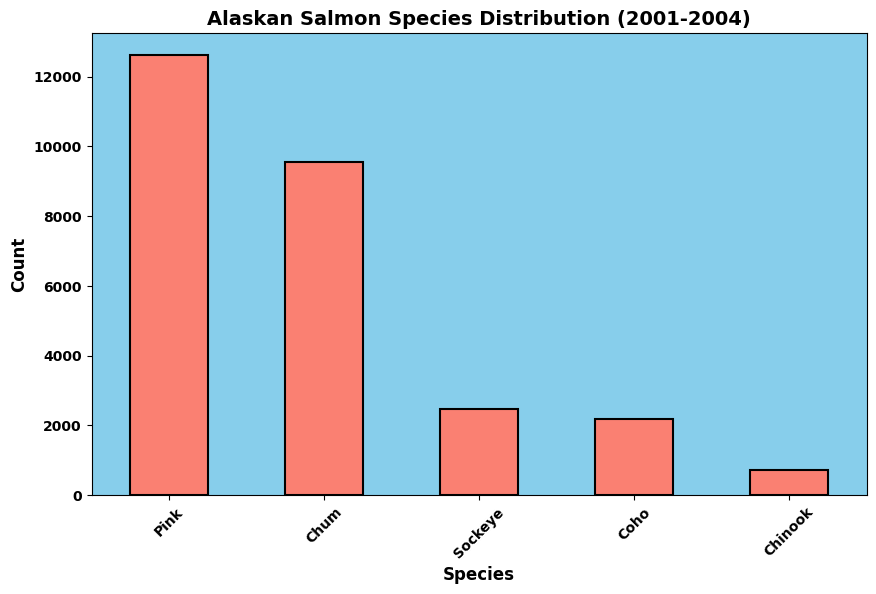

In [17]:
import matplotlib.pyplot as plt

# Plot species distribution
ax = species_counts.plot(kind='bar', figsize=(10, 6), color = '#FA8072')

# Set background color
ax.set_facecolor('#87CEEB')  # Light gray background

# Plot species distribution with bar outline
species_counts.plot(kind='bar', ax=ax, color='#FA8072', edgecolor='black', linewidth=1.5)  # Bar outline


plt.title('Alaskan Salmon Species Distribution (2001-2004)', fontsize=14, fontweight='bold')
plt.xlabel('Species', fontsize=12, fontweight='bold')  # Bold x-axis label
plt.ylabel('Count', fontsize=12, fontweight='bold')  # Bold y-axis label
plt.xticks(rotation=45, fontsize=10, fontweight='bold')  # Rotate x-axis labels and make them bold
plt.yticks(fontsize=10, fontweight='bold')  # Make y-axis ticks bold


plt.show()


<span style="color:#fff700;"> <font size="100"><b>DEBUG/ Would be good to run a scatter plot and see this in R to see normal distribution</font></b></span>

TypeError: 'value' must be an instance of str or bytes, not a float

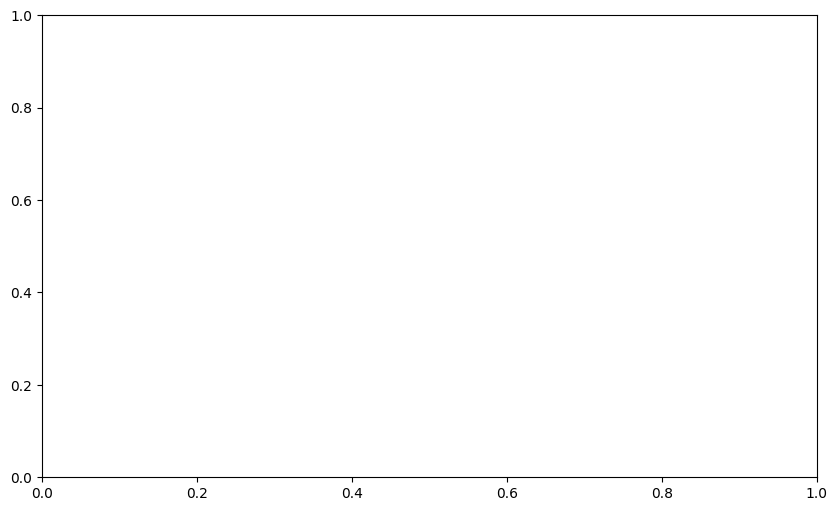

In [18]:
# Scatter plot of length vs. weight
plt.figure(figsize=(10, 6))
plt.scatter(salmon['length_wet_cm'], salmon['weight_wet_grams'], alpha=0.5)
plt.title('Length vs. Weight')
plt.xlabel('Length (cm)')
plt.ylabel('Weight (g)')
plt.show()


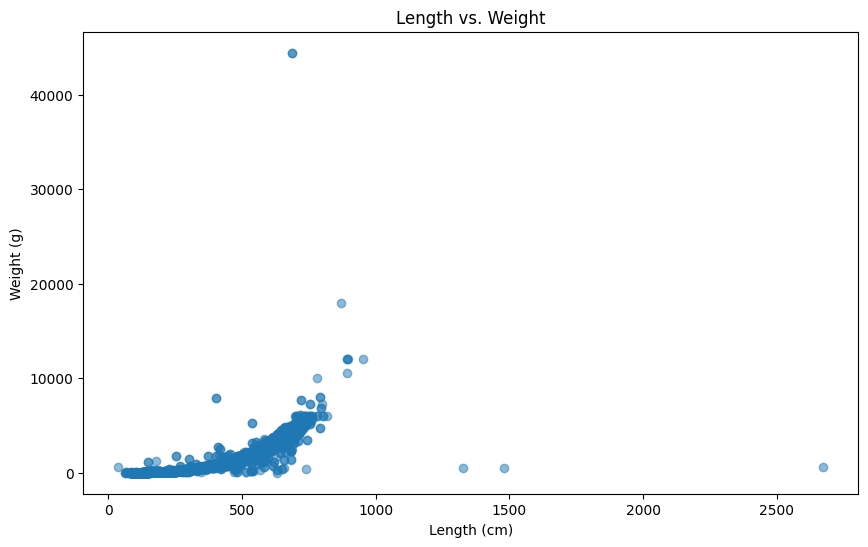

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure that 'length_wet_cm' and 'weight_wet_grams' are numeric, coercing errors to NaN
salmon['length_wet_cm'] = pd.to_numeric(salmon['length_wet_cm'], errors='coerce')
salmon['weight_wet_grams'] = pd.to_numeric(salmon['weight_wet_grams'], errors='coerce')

# Remove rows with NaN values (if any) from the relevant columns
salmon = salmon.dropna(subset=['length_wet_cm', 'weight_wet_grams'])

# Scatter plot of length vs. weight
plt.figure(figsize=(10, 6))
plt.scatter(salmon['length_wet_cm'], salmon['weight_wet_grams'], alpha=0.5)
plt.title('Length vs. Weight')
plt.xlabel('Length (cm)')
plt.ylabel('Weight (g)')
plt.show()

clean up non number values

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Clean data by converting to numeric, forcing errors to NaN, then dropping NaN
salmon['length_wet_cm'] = pd.to_numeric(salmon['length_wet_cm'], errors='coerce')
salmon['weight_wet_grams'] = pd.to_numeric(salmon['weight_wet_grams'], errors='coerce')

# Remove rows with NaN values after conversion
salmon = salmon.dropna(subset=['length_wet_cm', 'weight_wet_grams'])

# Scatter plot of length vs. weight
plt.figure(figsize=(10, 6))
plt.scatter(salmon['length_wet_cm'], salmon['weight_wet_grams'], alpha=0.5)

# Set title and labels
plt.title('Length vs. Weight')
plt.xlabel('Length (cm)')
plt.ylabel('Weight (g)')

# Set x and y axis ticks to display a sequence from 0 to the max value with step size of 1
plt.xticks(range(int(min(salmon['length_wet_cm'])), int(max(salmon['length_wet_cm'])) + 1, 1))
plt.yticks(range(int(min(salmon['weight_wet_grams'])), int(max(salmon['weight_wet_grams'])) + 1, 1))

# Show the plot
plt.show()

C:\Users\mecto\AppData\Local\Temp\ipykernel_11972\3325588652.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  salmon['length_wet_cm'] = pd.to_numeric(salmon['length_wet_cm'], errors='coerce')
C:\Users\mecto\AppData\Local\Temp\ipykernel_11972\3325588652.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  salmon['weight_wet_grams'] = pd.to_numeric(salmon['weight_wet_grams'], errors='coerce')


KeyboardInterrupt: 

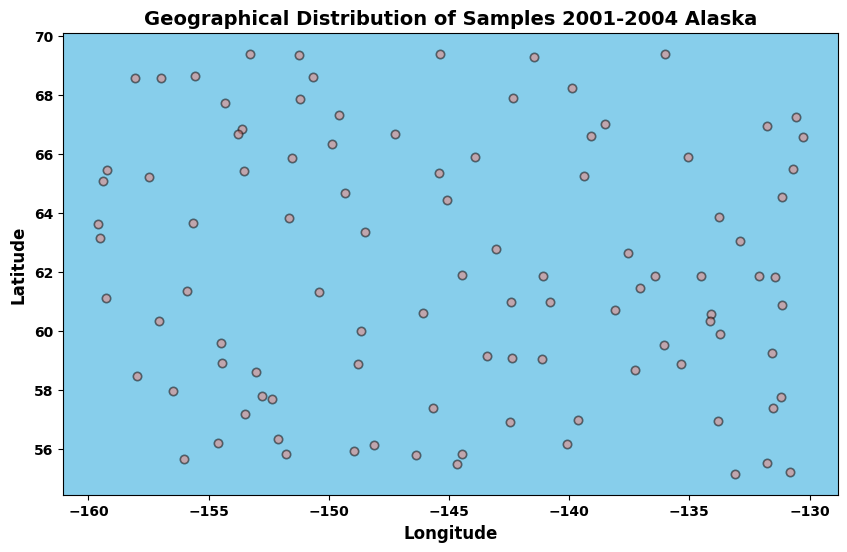

In [ ]:
import matplotlib.pyplot as plt

# Create figure and axis
plt.figure(figsize=(10, 6))
ax = plt.gca()  # Get current axis

# Set background color to sky blue
ax.set_facecolor('#87CEEB')  # Sky blue

# Scatter plot with orange dots and black outline
plt.scatter(salmon['longitude'], salmon['latitude'], 
            color='#FA8072', edgecolors='black', linewidth=1.2, alpha=0.5)

# Set labels and title with bold font
plt.title('Geographical Distribution of Samples 2001-2004 Alaska', fontsize=14, fontweight='bold')
plt.xlabel('Longitude', fontsize=12, fontweight='bold')
plt.ylabel('Latitude', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')  # Rotate x-axis labels and make them bold
plt.yticks(fontsize=10, fontweight='bold')  # Make y-axis ticks bold

# Show the plot
plt.show()

Adding clusters to above graph map - 2025-04-24

    * make sure to download sklearn thru pip
    * also pip install scikit-learn

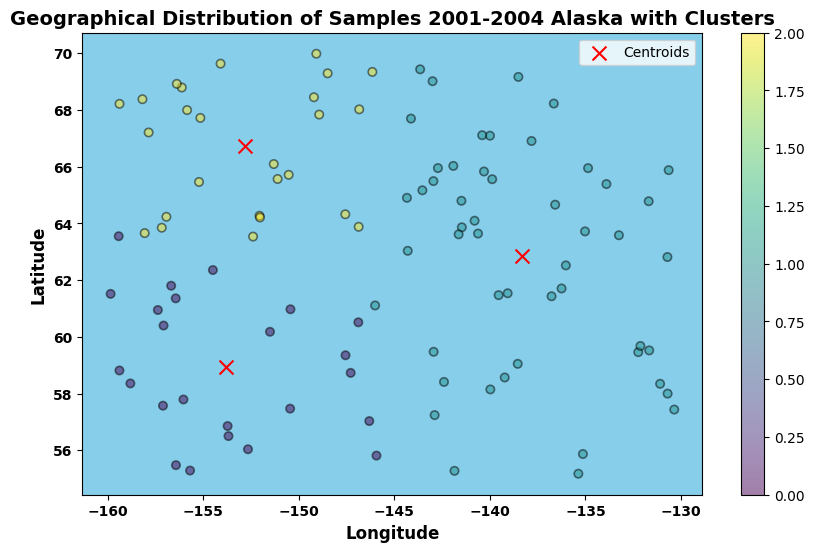

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

# Sample data (replace with your actual data)
np.random.seed(0)
salmon = {
    'longitude': np.random.uniform(-160, -130, 100),
    'latitude': np.random.uniform(55, 70, 100)
}

# Convert data to numpy array
X = np.array(list(zip(salmon['longitude'], salmon['latitude'])))

# Number of clusters (you can adjust this)
k = 3

# Create KMeans object
kmeans = KMeans(n_clusters=k, random_state=0)

# Fit KMeans clustering model
kmeans.fit(X)

# Get cluster labels and centroids
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Create figure and axis
plt.figure(figsize=(10, 6))
ax = plt.gca()

# Set background color to sky blue
ax.set_facecolor('#87CEEB')  # Sky blue

# Scatter plot with cluster coloring
scatter = ax.scatter(salmon['longitude'], salmon['latitude'], c=labels, cmap='viridis', 
                     edgecolors='black', linewidth=1.2, alpha=0.5)

# Plot centroids of clusters
ax.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=100, color='red', label='Centroids')

# Set labels and title with bold font
plt.title('Geographical Distribution of Samples 2001-2004 Alaska with Clusters', fontsize=14, fontweight='bold')
plt.xlabel('Longitude', fontsize=12, fontweight='bold')
plt.ylabel('Latitude', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')  # Rotate x-axis labels and make them bold
plt.yticks(fontsize=10, fontweight='bold')  # Make y-axis ticks bold

# Add legend
plt.legend()

# Show the plot
plt.colorbar(scatter)  # Add colorbar for cluster labels
plt.show()

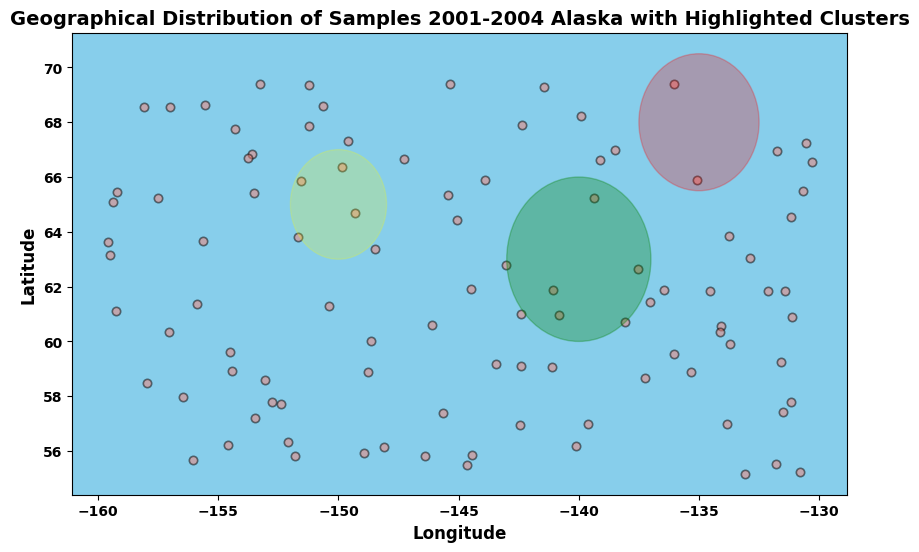

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data (replace with your actual data)
salmon = {
    'longitude': np.random.uniform(-160, -130, 100),
    'latitude': np.random.uniform(55, 70, 100)
}

# Create figure and axis
plt.figure(figsize=(10, 6))
ax = plt.gca()

# Set background color to sky blue
ax.set_facecolor('#87CEEB')  # Sky blue

# Scatter plot with orange dots and black outline
plt.scatter(salmon['longitude'], salmon['latitude'], 
            color='#FA8072', edgecolors='black', linewidth=1.2, alpha=0.5)

# Manually defining some "clusters" (just as an example for 3 regions)
# Define each group as a circle with center (longitude, latitude) and radius
clusters = [
    {'center': (-150, 65), 'radius': 2, 'color': 'yellow', 'alpha': 0.2},  # Cluster 1
    {'center': (-140, 63), 'radius': 3, 'color': 'green', 'alpha': 0.3},   # Cluster 2
    {'center': (-135, 68), 'radius': 2.5, 'color': 'red', 'alpha': 0.25}    # Cluster 3
]

# Loop through the clusters and plot transparent circles around them
for cluster in clusters:
    circle = plt.Circle(cluster['center'], cluster['radius'], color=cluster['color'], alpha=cluster['alpha'])
    ax.add_patch(circle)

# Set labels and title with bold font
plt.title('Geographical Distribution of Samples 2001-2004 Alaska with Highlighted Clusters', fontsize=14, fontweight='bold')
plt.xlabel('Longitude', fontsize=12, fontweight='bold')
plt.ylabel('Latitude', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')  # Rotate x-axis labels and make them bold
plt.yticks(fontsize=10, fontweight='bold')  # Make y-axis ticks bold

# Show the plot
plt.show()

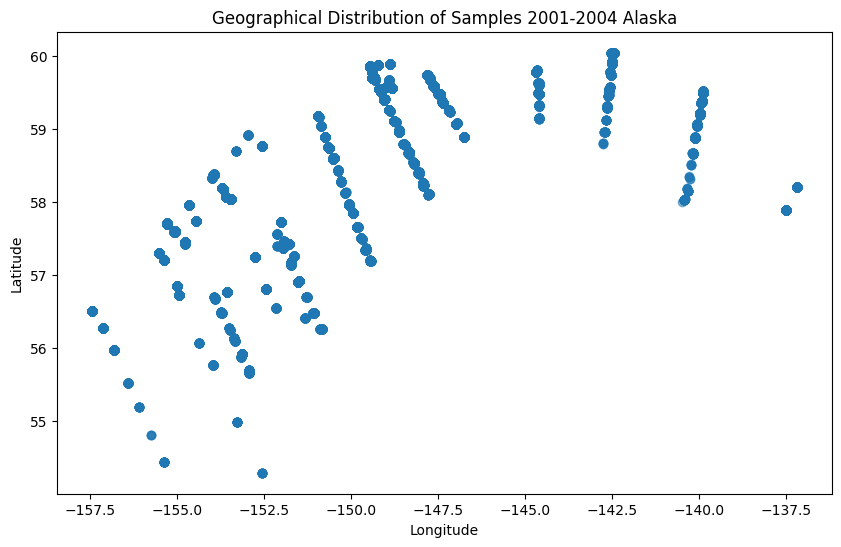

In [ ]:
# Scatter plot of sampling locations
plt.figure(figsize=(10, 6))
plt.scatter(salmon['longitude'], salmon['latitude'], alpha=0.5)
plt.title('Geographical Distribution of Samples 2001-2004 Alaska')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


using alaska shapefile - 03/30/2025

In [ ]:
import os, zipfile #basics
import pandas as pd #data management
import matplotlib.pyplot as plt #vis

import geopandas as gpd #gis/maps: a sister of pandas; does the job;
#tho not as fancy-interactive as folium or leafmap https://geopandas.org/

#import mapclassify #need for thematic map classification

<span style="color:#fff700;"> <font size="100"><b>DEBUG</font></b></span>
This was for Alaskan Shapefile. It should work just fine as I had it. Want to have the above fishing distribution overlayed on this.

In [ ]:
! wget -q -O alaska.zip https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/cb_2018_02_place_500k.zip

zip_ref = zipfile.ZipFile('cb_2018_02_place_500k.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
AlaskaMap=gpd.read_file('cb_2018_02_place_500k.shp') #load the shapefile with gpd as njC

'wget' is not recognized as an internal or external command,
operable program or batch file.


FileNotFoundError: [Errno 2] No such file or directory: 'cb_2018_02_place_500k.zip'

The above graph with geopandas

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming your data is in a pandas DataFrame `df` with columns 'latitude' and 'longitude'
# If it's not in the correct format, convert them to a GeoDataFrame.

# Create a GeoDataFrame from your DataFrame
gdf = gpd.GeoDataFrame(salmon, geometry=gpd.points_from_xy(salmon['longitude'], salmon['latitude']))

# Load a map of Alaska (you can use a shapefile for Alaska's boundaries)
world = gpd.read_file('C:\\Users\\mecto\\Desktop\\VSC Projects\\Masters_Spring2025\\MastersProject_Salmon\\ne_10m_admin_0_countries.shp')  # Replace with the path to the shapefile

# Filter the world map to only show Alaska (you can download a shapefile of Alaska if needed)
alaska = world[world.name == 'United States of America']

# Plot the map of Alaska
fig, ax = plt.subplots(figsize=(10, 6))
alaska.plot(ax=ax, color='lightgrey', edgecolor='black')

# Overlay your sampling points (scatter plot)
gdf.plot(ax=ax, marker='o', color='red', markersize=5, alpha=0.5)

# Title and labels
plt.title('Geographical Distribution of Samples in Alaska')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()


<span style="color:#fff700;"> <font size="100"><b>DEBUG</font></b></span>
This was good to find out when the fishing seasons occur

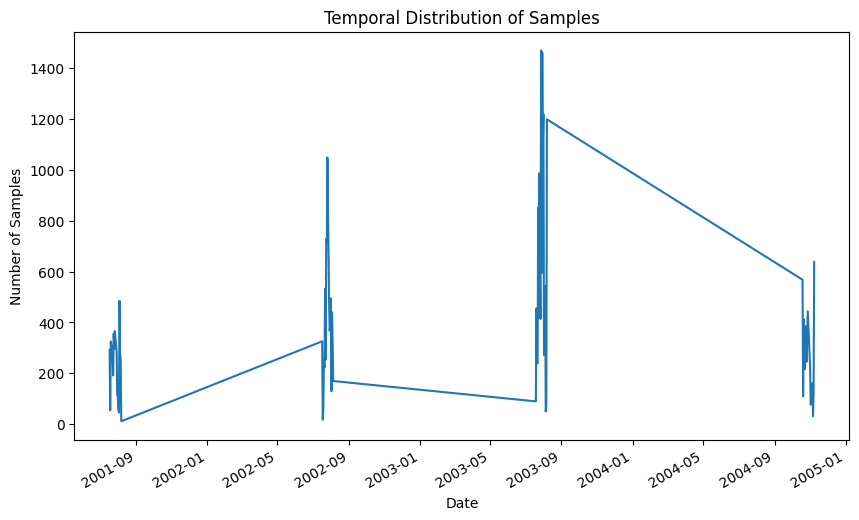

In [ ]:
# Convert year and day to datetime
salmon['date'] = pd.to_datetime(salmon['year'].astype(str) + salmon['yrday_local'].astype(str), format='%Y%j', errors='coerce')

# Plot number of samples over time
salmon['date'].value_counts().sort_index().plot(kind='line', figsize=(10, 6))
plt.title('Temporal Distribution of Samples')
plt.xlabel('Date')
plt.ylabel('Number of Samples')
plt.show()


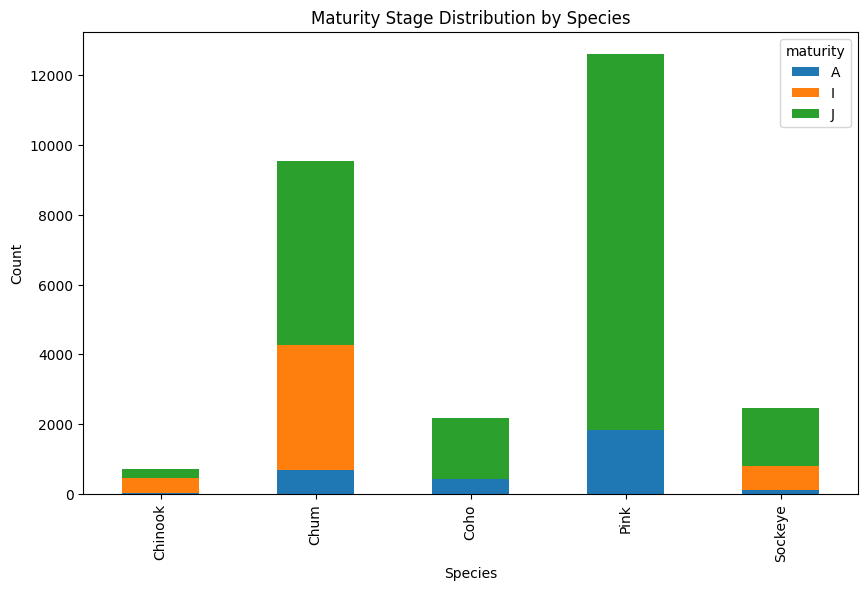

In [ ]:
# Count maturity stages for each species
maturity_counts = salmon.groupby(['species_common_name', 'maturity']).size().unstack().fillna(0)

# Plot stacked bar chart
maturity_counts.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Maturity Stage Distribution by Species')
plt.xlabel('Species')
plt.ylabel('Count')
plt.show()


In [ ]:
import seaborn as sns

# Scatter plot with regression lines for each species
plt.figure(figsize=(10, 6))
sns.lmplot(x='length_wet_cm', y='weight_wet_grams', hue='species_common_name', data=salmon, aspect=1.5)
plt.title('Length vs. Weight by Species')
plt.xlabel('Length (mm)')
plt.ylabel('Weight (g)')
plt.show()


Update this below graph which each species name for species_#_data
    * 'Chinook', 'Chum', 'Coho', 'Pink', 'Sockeye'

<Figure size 1000x600 with 0 Axes>

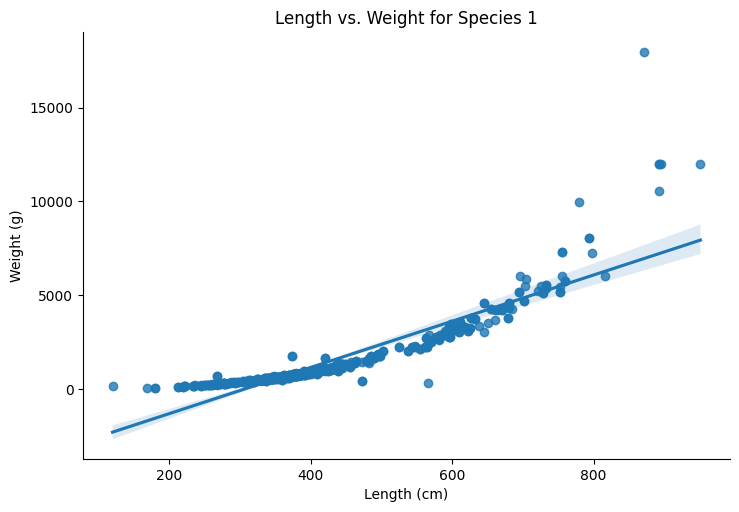

<Figure size 1000x600 with 0 Axes>

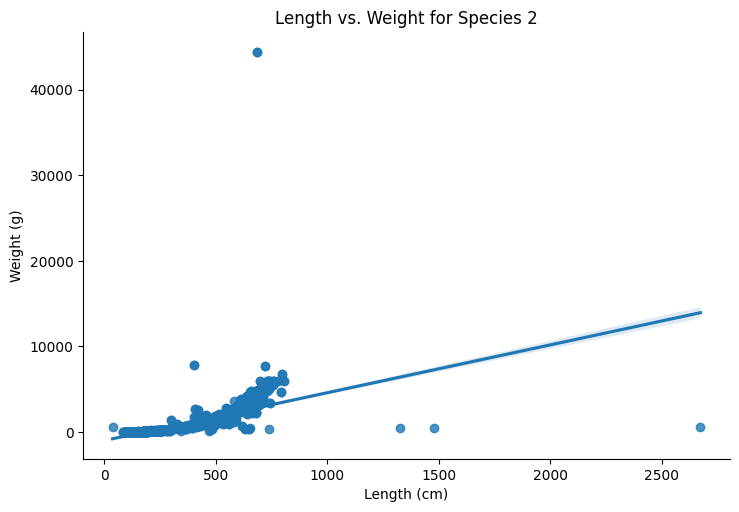

<Figure size 1000x600 with 0 Axes>

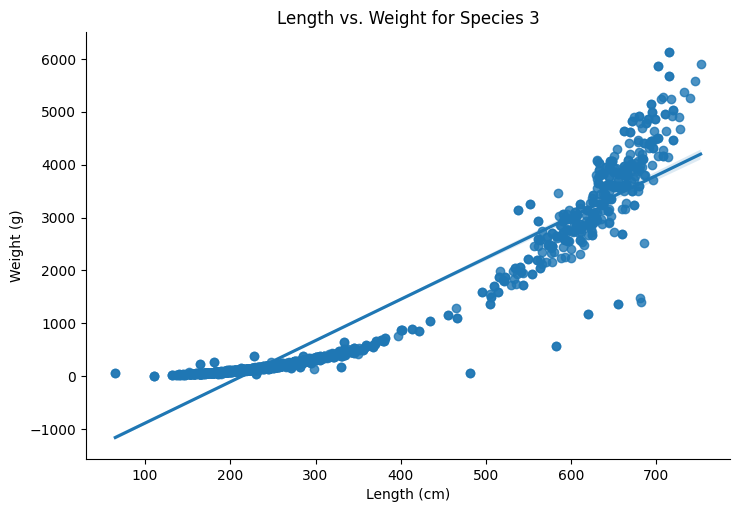

<Figure size 1000x600 with 0 Axes>

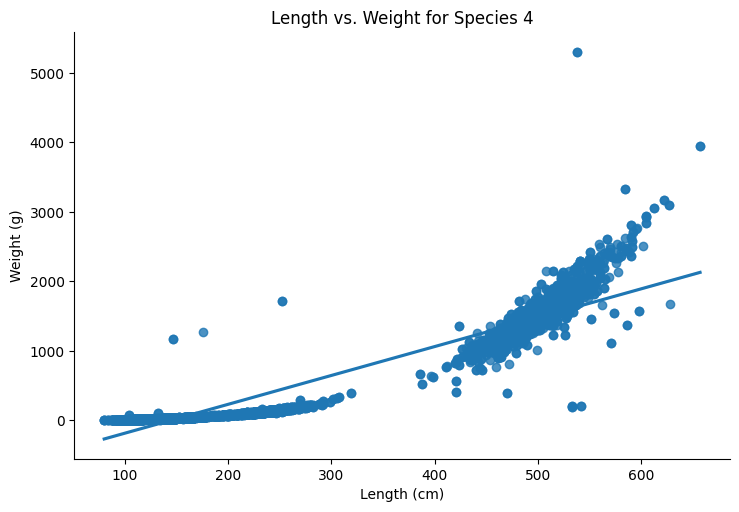

<Figure size 1000x600 with 0 Axes>

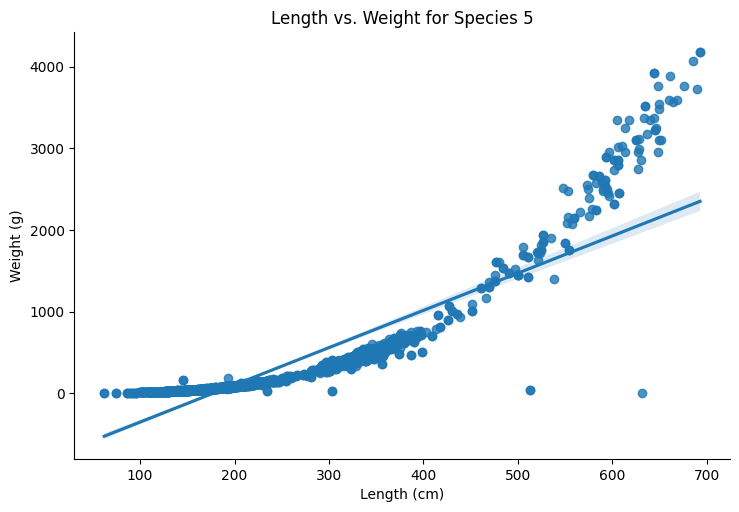

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot for species 1 (replace with actual species name)
species_1_data = salmon[salmon['species_common_name'] == 'Chinook']  # Replace 'Species_1' with the actual species name
plt.figure(figsize=(10, 6))
sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_1_data, aspect=1.5)
plt.title('Length vs. Weight for Species 1')  # Replace with actual species name
plt.xlabel('Length (cm)')
plt.ylabel('Weight (g)')
plt.show()

# Plot for species 2 (replace with actual species name)
species_2_data = salmon[salmon['species_common_name'] == 'Chum']  # Replace 'Species_2' with the actual species name
plt.figure(figsize=(10, 6))
sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_2_data, aspect=1.5)
plt.title('Length vs. Weight for Species 2')  # Replace with actual species name
plt.xlabel('Length (cm)')
plt.ylabel('Weight (g)')
plt.show()

# Plot for species 3 (replace with actual species name)
species_3_data = salmon[salmon['species_common_name'] == 'Coho']  # Replace 'Species_3' with the actual species name
plt.figure(figsize=(10, 6))
sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_3_data, aspect=1.5)
plt.title('Length vs. Weight for Species 3')  # Replace with actual species name
plt.xlabel('Length (cm)')
plt.ylabel('Weight (g)')
plt.show()

# Plot for species 4 (replace with actual species name)
species_4_data = salmon[salmon['species_common_name'] == 'Pink']  # Replace 'Species_3' with the actual species name
plt.figure(figsize=(10, 6))
sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_4_data, aspect=1.5)
plt.title('Length vs. Weight for Species 4')  # Replace with actual species name
plt.xlabel('Length (cm)')
plt.ylabel('Weight (g)')
plt.show()

# Plot for species 3 (replace with actual species name)
species_5_data = salmon[salmon['species_common_name'] == 'Sockeye']  # Replace 'Species_3' with the actual species name
plt.figure(figsize=(10, 6))
sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_5_data, aspect=1.5)
plt.title('Length vs. Weight for Species 5')  # Replace with actual species name
plt.xlabel('Length (cm)')
plt.ylabel('Weight (g)')
plt.show()


In [ ]:
import pandas as pd

# Make sure the columns are floats
salmon['length_wet_cm'] = pd.to_numeric(salmon['length_wet_cm'], errors='coerce', downcast='float')
salmon['weight_wet_grams'] = pd.to_numeric(salmon['weight_wet_grams'], errors='coerce', downcast='float')

# Check the types to confirm that they're floats
print(salmon[['length_wet_cm', 'weight_wet_grams']].dtypes)

length_wet_cm       float32
weight_wet_grams    float32
dtype: object


In [ ]:
salmon['length_wet_cm'] = salmon['length_wet_cm'].round(2)  # Rounds to 2 decimal places
salmon['weight_wet_grams'] = salmon['weight_wet_grams'].round(2)  # Rounds to 2 decimal places

In [ ]:
import pandas as pd

# Scale down the values by dividing by 10 (or adjust the factor as necessary)
salmon['length_wet_cm'] = salmon['length_wet_cm'] / 10  # Adjust this factor as needed
salmon['weight_wet_grams'] = salmon['weight_wet_grams'] / 10  # Adjust this factor as needed

# Check the values to ensure they are scaled correctly
print(salmon[['length_wet_cm', 'weight_wet_grams']].head())

    length_wet_cm  weight_wet_grams
0       12.000000         12.700000
1       69.800003        410.799988
7       11.200000          1.400000
9       14.200000          3.000000
11      10.500000          1.100000


In [ ]:
#salmon['weight_wet_grams'] = salmon['weight_wet_grams'] * 10  # Adjust this factor as needed


In [ ]:
print(salmon.head(5))  # Check the first few rows for correct values


    year   transect sta_id  haul_id  month_local  day_local  yrday_local  \
0   2001  Icy_Point    IP2  2001001            7         17          198   
1   2001  Icy_Point    IP2  2001001            7         17          198   
7   2001  Icy_Point    IP2  2001001            7         17          198   
9   2001  Icy_Point    IP2  2001001            7         17          198   
11  2001  Icy_Point    IP2  2001001            7         17          198   

    latitude  longitude depth_w_meters  ... length_frozen_cm length_wet_cm  \
0       58.2     -137.2             64  ...              NaN     12.000000   
1       58.2     -137.2             64  ...              NaN     69.800003   
7       58.2     -137.2             64  ...              111     11.200000   
9       58.2     -137.2             64  ...              140     14.200000   
11      58.2     -137.2             64  ...              105     10.500000   

    weight_froz_grams weight_wet_grams  sex maturity stomwt_full stomwt_em

In [ ]:
# Filter the salmon DataFrame for each year (2001, 2002, 2003, 2004)
salmon_2001 = salmon[salmon['year'] == 2001]
salmon_2002 = salmon[salmon['year'] == 2002]
salmon_2003 = salmon[salmon['year'] == 2003]
salmon_2004 = salmon[salmon['year'] == 2004]

# Verify by printing the first few rows of each DataFrame
print("Data for 2001:")
print(salmon_2001.head())

print("Data for 2002:")
print(salmon_2002.head())

print("Data for 2003:")
print(salmon_2003.head())

print("Data for 2004:")
print(salmon_2004.head())

Data for 2001:
    year   transect sta_id  haul_id  month_local  day_local  yrday_local  \
0   2001  Icy_Point    IP2  2001001            7         17          198   
1   2001  Icy_Point    IP2  2001001            7         17          198   
7   2001  Icy_Point    IP2  2001001            7         17          198   
9   2001  Icy_Point    IP2  2001001            7         17          198   
11  2001  Icy_Point    IP2  2001001            7         17          198   

    latitude  longitude depth_w_meters  ... length_frozen_cm length_wet_cm  \
0       58.2     -137.2             64  ...              NaN     12.000000   
1       58.2     -137.2             64  ...              NaN     69.800003   
7       58.2     -137.2             64  ...              111     11.200000   
9       58.2     -137.2             64  ...              140     14.200000   
11      58.2     -137.2             64  ...              105     10.500000   

    weight_froz_grams weight_wet_grams  sex maturity stomwt

## 04-24-2025 length and weight graphs

UFuncTypeError: ufunc 'multiply' did not contain a loop with signature matching types (dtype('<U3'), dtype('float64')) -> None

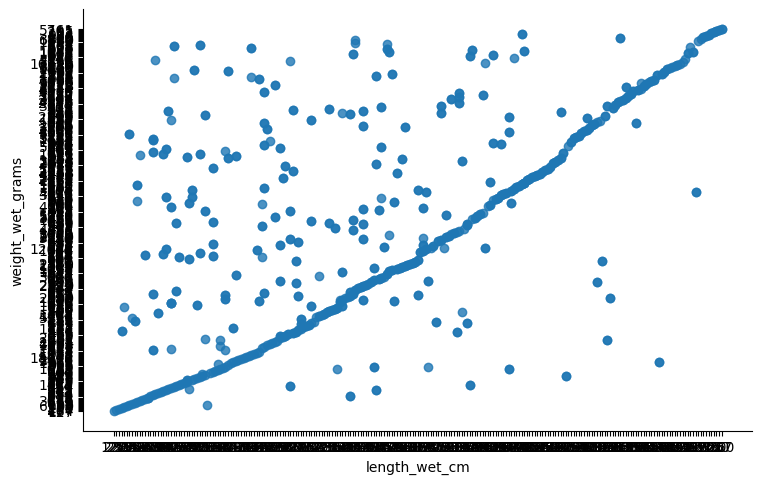

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of species and their colors for the normal distribution line
species_list = [
    ('Chinook', 'red'),  # Example species and color
    ('Chum', 'blue'),
    ('Coho', 'green'),
    ('Pink', 'purple'),
    ('Sockeye', 'orange')
]

# Loop through each species and plot the data
for species, line_color in species_list:
    species_data = salmon[salmon['species_common_name'] == species]
    
    # Check if there's data for the species
    if not species_data.empty:
        # Create seaborn lmplot with a custom color for the regression line
        sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_data, aspect=1.5, line_kws={'color': line_color})
        
        # Set plot titles and labels
        plt.title(f'Length vs. Weight for {species}')
        plt.xlabel('Length (cm)')
        plt.ylabel('Weight (g)')
        
        # Show the plot
        plt.show()
    else:
        print(f"No data available for {species}")

### doing the same but breaking it down year to year as well

salmon_2001
salmon_2002
salmon_2003
salmon_2004

### 2001

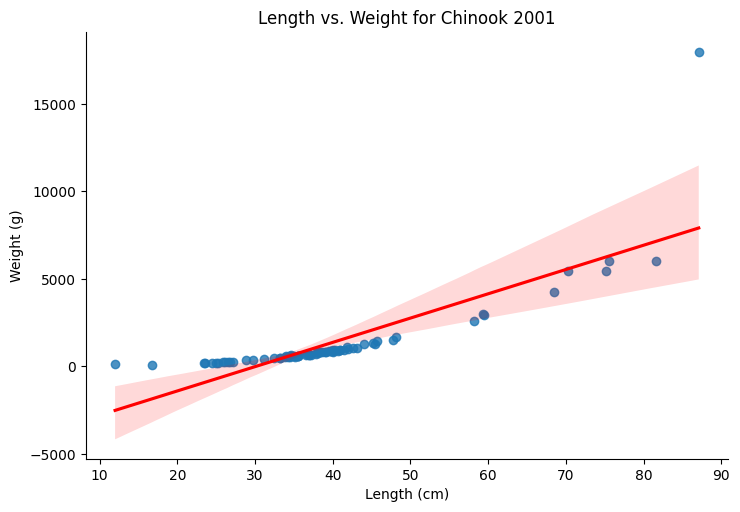

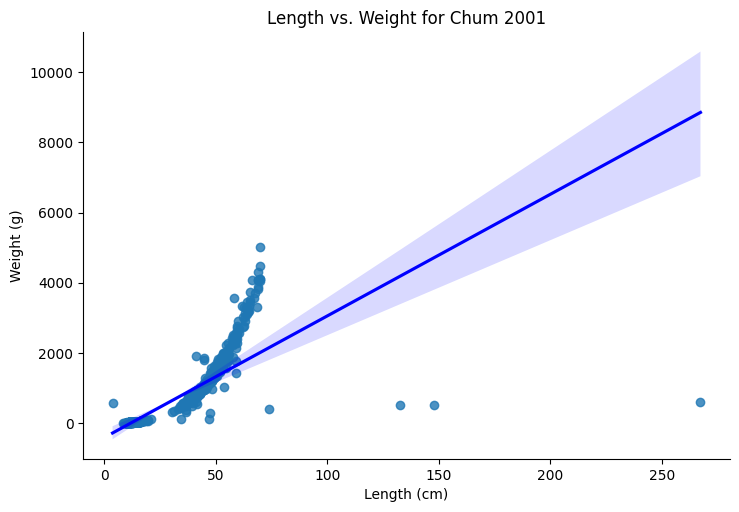

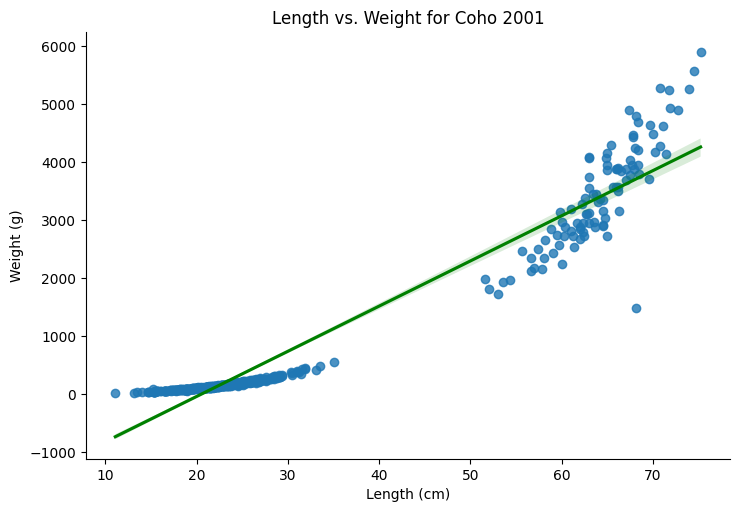

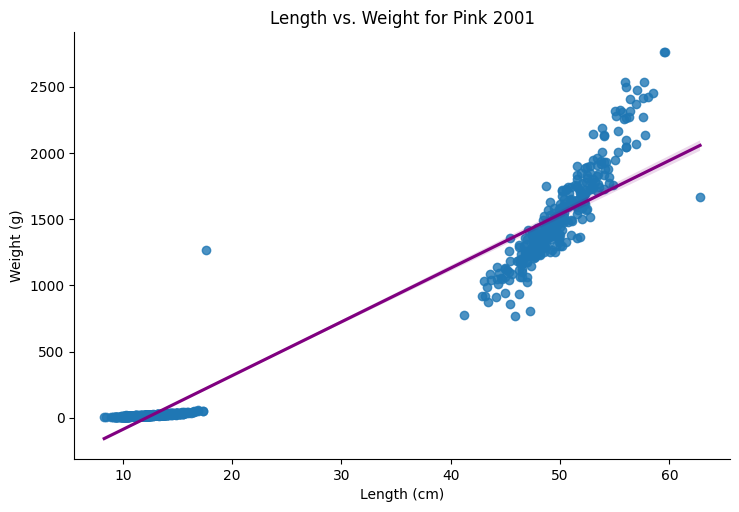

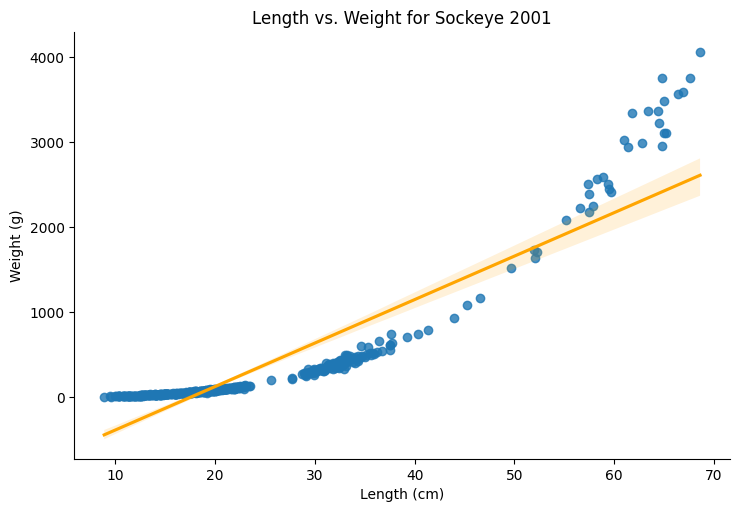

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of species and their colors for the normal distribution line
species_list = [
    ('Chinook', 'red'),  # Example species and color
    ('Chum', 'blue'),
    ('Coho', 'green'),
    ('Pink', 'purple'),
    ('Sockeye', 'orange')
]

# Loop through each species and plot the data
for species, line_color in species_list:
    species_data = salmon_2001[salmon_2001['species_common_name'] == species]
    
    # Check if there's data for the species
    if not species_data.empty:
        # Create seaborn lmplot with a custom color for the regression line
        sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_data, aspect=1.5, line_kws={'color': line_color})
        
        # Set plot titles and labels
        plt.title(f'Length vs. Weight for {species} 2001')
        plt.xlabel('Length (cm)')
        plt.ylabel('Weight (g)')
        
        # Show the plot
        plt.show()
    else:
        print(f"No data available for {species}")

### 2002

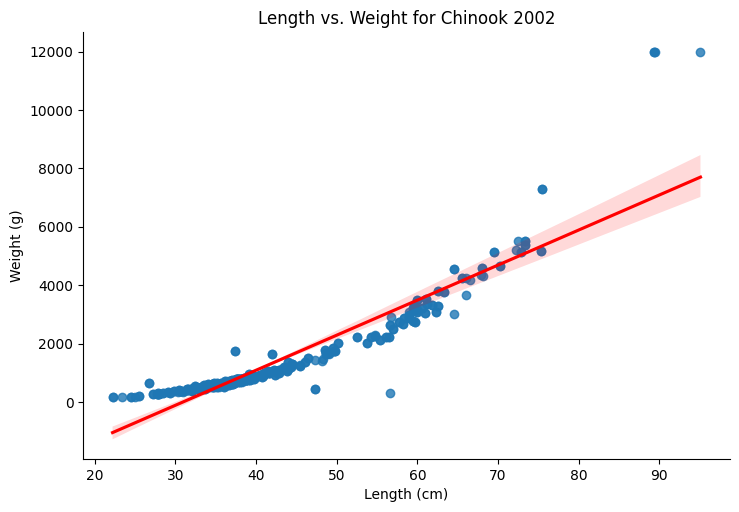

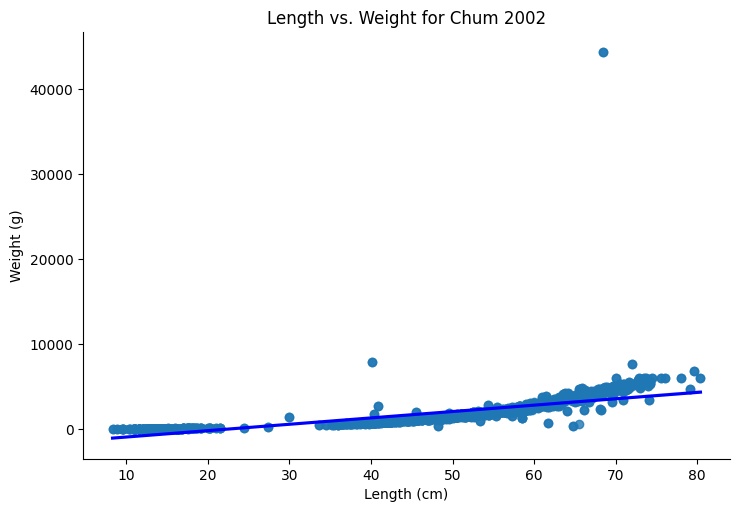

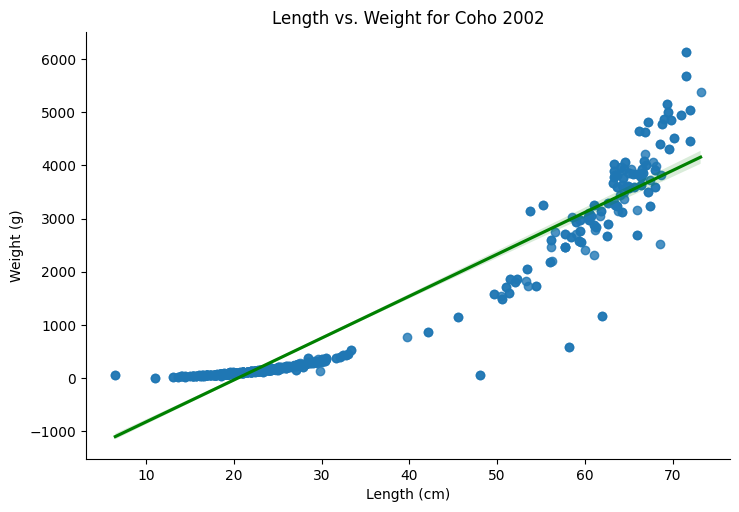

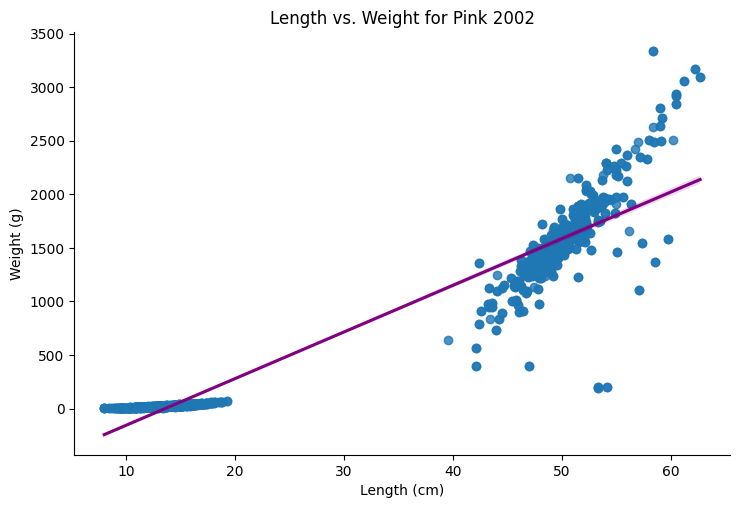

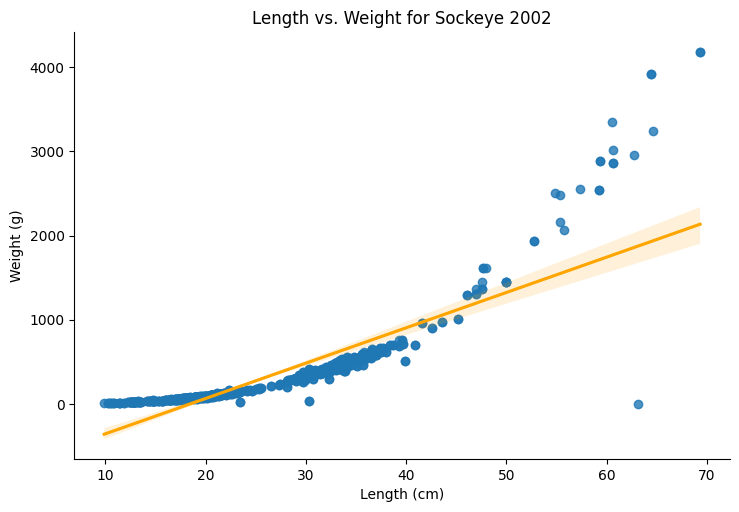

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of species and their colors for the normal distribution line
species_list = [
    ('Chinook', 'red'),  # Example species and color
    ('Chum', 'blue'),
    ('Coho', 'green'),
    ('Pink', 'purple'),
    ('Sockeye', 'orange')
]

# Loop through each species and plot the data
for species, line_color in species_list:
    species_data = salmon_2002[salmon_2002['species_common_name'] == species]
    
    # Check if there's data for the species
    if not species_data.empty:
        # Create seaborn lmplot with a custom color for the regression line
        sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_data, aspect=1.5, line_kws={'color': line_color})
        
        # Set plot titles and labels
        plt.title(f'Length vs. Weight for {species} 2002')
        plt.xlabel('Length (cm)')
        plt.ylabel('Weight (g)')
        
        # Show the plot
        plt.show()
    else:
        print(f"No data available for {species}")

### 2003

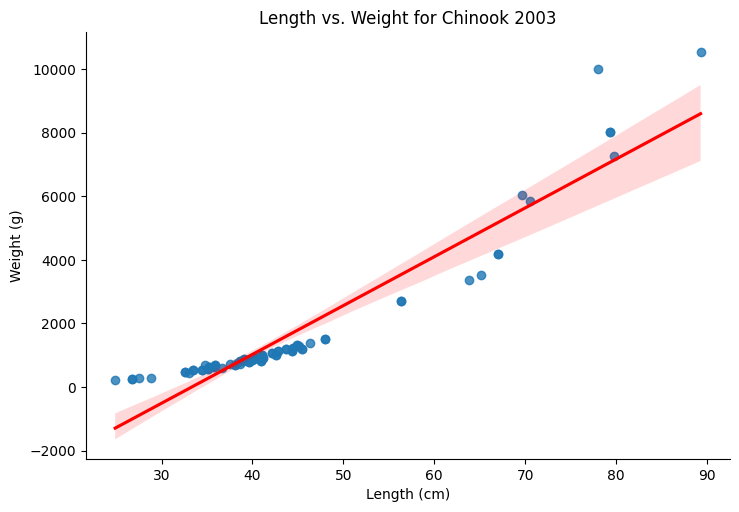

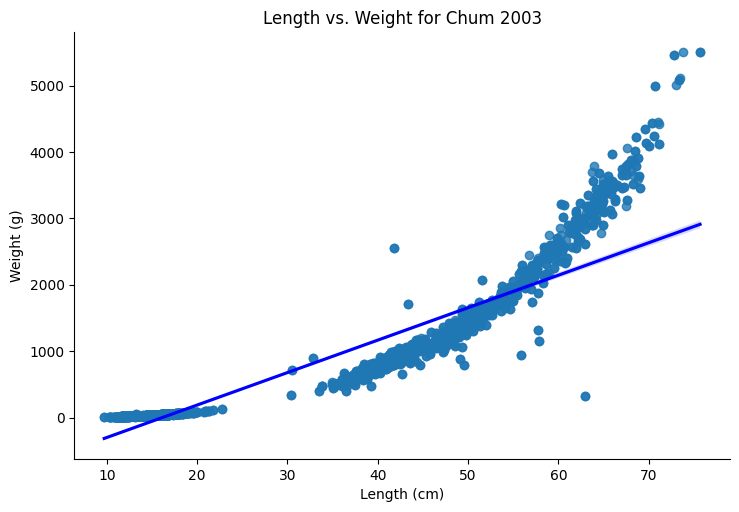

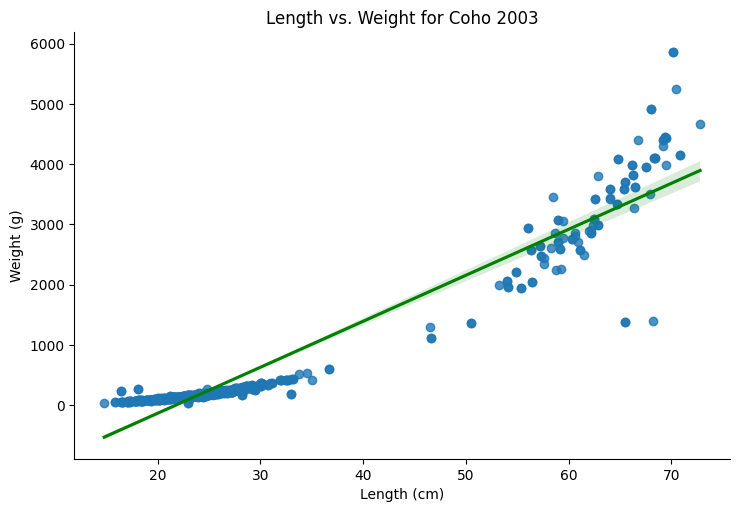

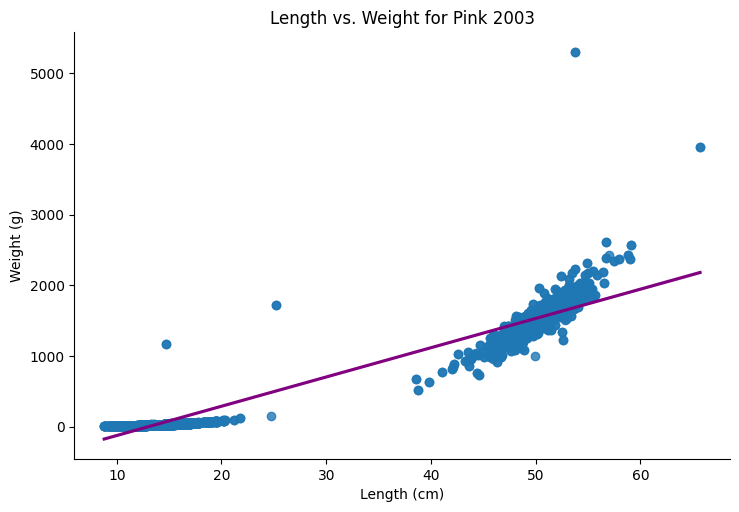

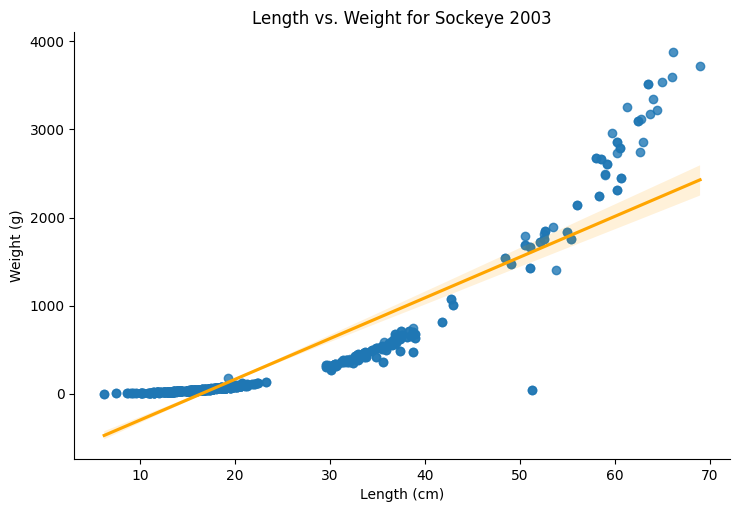

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of species and their colors for the normal distribution line
species_list = [
    ('Chinook', 'red'),  # Example species and color
    ('Chum', 'blue'),
    ('Coho', 'green'),
    ('Pink', 'purple'),
    ('Sockeye', 'orange')
]

# Loop through each species and plot the data
for species, line_color in species_list:
    species_data = salmon_2003[salmon_2003['species_common_name'] == species]
    
    # Check if there's data for the species
    if not species_data.empty:
        # Create seaborn lmplot with a custom color for the regression line
        sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_data, aspect=1.5, line_kws={'color': line_color})
        
        # Set plot titles and labels
        plt.title(f'Length vs. Weight for {species} 2003')
        plt.xlabel('Length (cm)')
        plt.ylabel('Weight (g)')
        
        # Show the plot
        plt.show()
    else:
        print(f"No data available for {species}")

### 2004

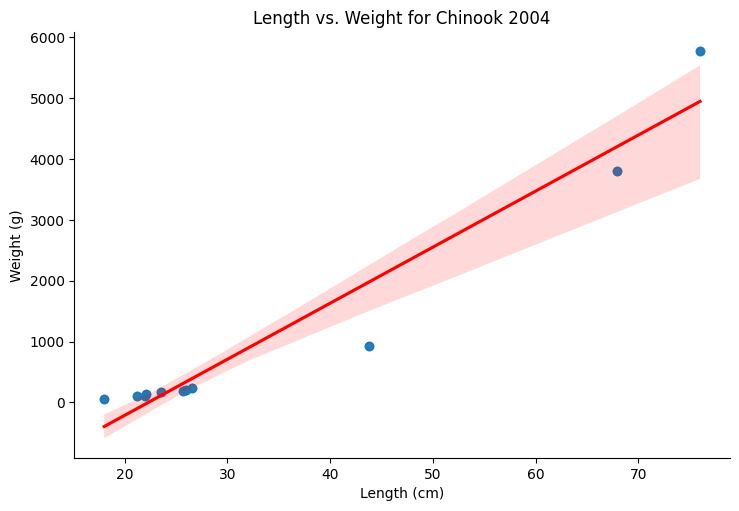

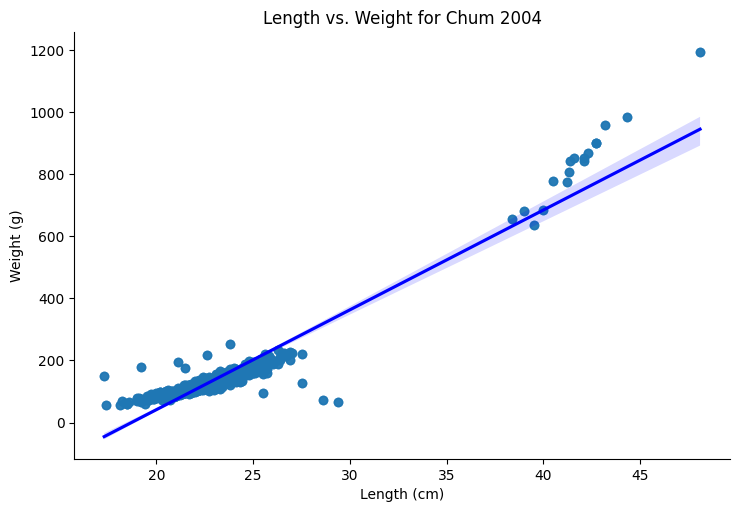

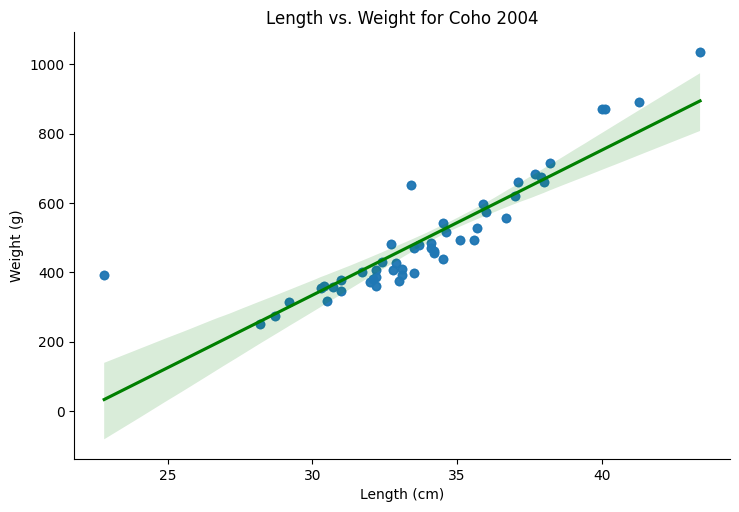

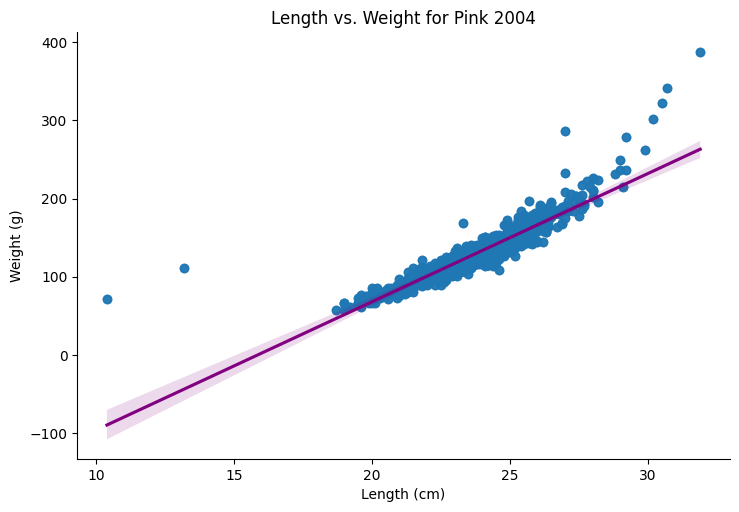

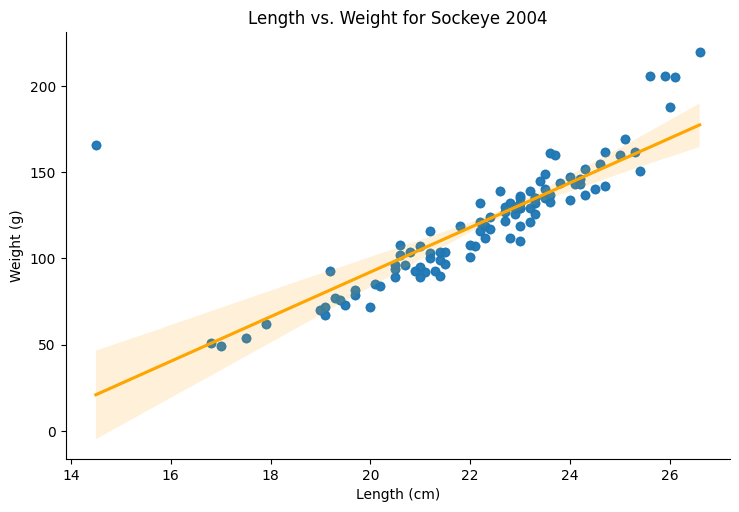

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of species and their colors for the normal distribution line
species_list = [
    ('Chinook', 'red'),  # Example species and color
    ('Chum', 'blue'),
    ('Coho', 'green'),
    ('Pink', 'purple'),
    ('Sockeye', 'orange')
]

# Loop through each species and plot the data
for species, line_color in species_list:
    species_data = salmon_2004[salmon_2004['species_common_name'] == species]
    
    # Check if there's data for the species
    if not species_data.empty:
        # Create seaborn lmplot with a custom color for the regression line
        sns.lmplot(x='length_wet_cm', y='weight_wet_grams', data=species_data, aspect=1.5, line_kws={'color': line_color})
        
        # Set plot titles and labels
        plt.title(f'Length vs. Weight for {species} 2004')
        plt.xlabel('Length (cm)')
        plt.ylabel('Weight (g)')
        
        # Show the plot
        plt.show()
    else:
        print(f"No data available for {species}")

### 04242025 - average for each species by year

In [ ]:
frozen_cols_to_convert = ['length_frozen_cm', 'weight_froz_grams']  # example columns

In [ ]:
salmon_2001[frozen_cols_to_convert] = salmon_2001[frozen_cols_to_convert].astype('float32')
salmon_2002[frozen_cols_to_convert] = salmon_2002[frozen_cols_to_convert].astype('float32')
salmon_2003[frozen_cols_to_convert] = salmon_2003[frozen_cols_to_convert].astype('float32')
salmon_2004[frozen_cols_to_convert] = salmon_2004[frozen_cols_to_convert].astype('float32')

C:\Users\mecto\AppData\Local\Temp\ipykernel_24356\879408535.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  salmon_2001[frozen_cols_to_convert] = salmon_2001[frozen_cols_to_convert].astype('float32')
C:\Users\mecto\AppData\Local\Temp\ipykernel_24356\879408535.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  salmon_2002[frozen_cols_to_convert] = salmon_2002[frozen_cols_to_convert].astype('float32')
C:\Users\mecto\AppData\Local\Temp\ipykernel_24356\879408535.py:3: SettingWithCopyWarning: 
A value is tr

In [ ]:
salmon_2001.dtypes

year                     int64
transect                object
sta_id                  object
haul_id                  int64
month_local              int64
day_local                int64
yrday_local              int64
latitude               float64
longitude              float64
depth_w_meters          object
species_common_name     object
length_frozen_cm       float32
length_wet_cm          float32
weight_froz_grams      float32
weight_wet_grams       float32
sex                     object
maturity                object
stomwt_full             object
stomwt_empty            object
sealice                 object
comments                object
dtype: object

In [ ]:
avg_salmon_2001 = salmon_2001.groupby('species_common_name')[['length_wet_cm', 'weight_wet_grams', 'length_frozen_cm', 'weight_froz_grams']].mean().reset_index()
avg_salmon_2001


,species_common_name,length_wet_cm,weight_wet_grams,length_frozen_cm,weight_froz_grams
0,Chinook,39.776711,1341.972656,0.000000,0.000000
1,Chum,31.459017,676.310059,126.990829,22.086601
2,Coho,30.265862,755.380310,NaN,NaN
3,Pink,22.070812,401.798798,122.770927,18.494785
4,Sockeye,24.150108,337.737518,NaN,NaN


In [ ]:
avg_salmon_2002 = salmon_2002.groupby('species_common_name')[['length_wet_cm', 'weight_wet_grams', 'length_frozen_cm', 'weight_froz_grams']].mean().reset_index()
avg_salmon_2002

,species_common_name,length_wet_cm,weight_wet_grams,length_frozen_cm,weight_froz_grams
0,Chinook,41.854053,1311.552124,340.642853,603.342834
1,Chum,46.712879,1805.300171,142.429016,37.520504
2,Coho,34.279057,1090.452759,215.240433,145.580505
3,Pink,26.821554,576.686096,134.778183,25.919487
4,Sockeye,25.881971,310.514679,185.544968,92.028778


In [ ]:
avg_salmon_2003 = salmon_2003.groupby('species_common_name')[['length_wet_cm', 'weight_wet_grams', 'length_frozen_cm', 'weight_froz_grams']].mean().reset_index()
avg_salmon_2003

,species_common_name,length_wet_cm,weight_wet_grams,length_frozen_cm,weight_froz_grams
0,Chinook,43.784885,1606.802368,NaN,NaN
1,Chum,29.372849,646.292725,146.253799,33.540215
2,Coho,29.016529,552.174744,NaN,NaN
3,Pink,21.522230,351.430969,104.297928,19.462381
4,Sockeye,23.157074,310.466125,NaN,NaN


In [ ]:
avg_salmon_2004 = salmon_2004.groupby('species_common_name')[['length_wet_cm', 'weight_wet_grams', 'length_frozen_cm', 'weight_froz_grams']].mean().reset_index()
avg_salmon_2004

,species_common_name,length_wet_cm,weight_wet_grams,length_frozen_cm,weight_froz_grams
0,Chinook,33.881821,1066.090942,NaN,NaN
1,Chum,23.224838,145.126144,NaN,NaN
2,Coho,33.903999,497.500000,NaN,NaN
3,Pink,23.846603,130.969116,NaN,NaN
4,Sockeye,22.205940,120.643562,NaN,NaN


In [ ]:
avg_salmon_2001['year'] = 2001
avg_salmon_2002['year'] = 2002
avg_salmon_2003['year'] = 2003
avg_salmon_2004['year'] = 2004


In [ ]:
print(avg_salmon_2001)
print(avg_salmon_2002)
print(avg_salmon_2003)
print(avg_salmon_2004)

In [ ]:
avg_salmon_2001_2004 = pd.concat([
    avg_salmon_2001,
    avg_salmon_2002,
    avg_salmon_2003,
    avg_salmon_2004
], ignore_index=True)

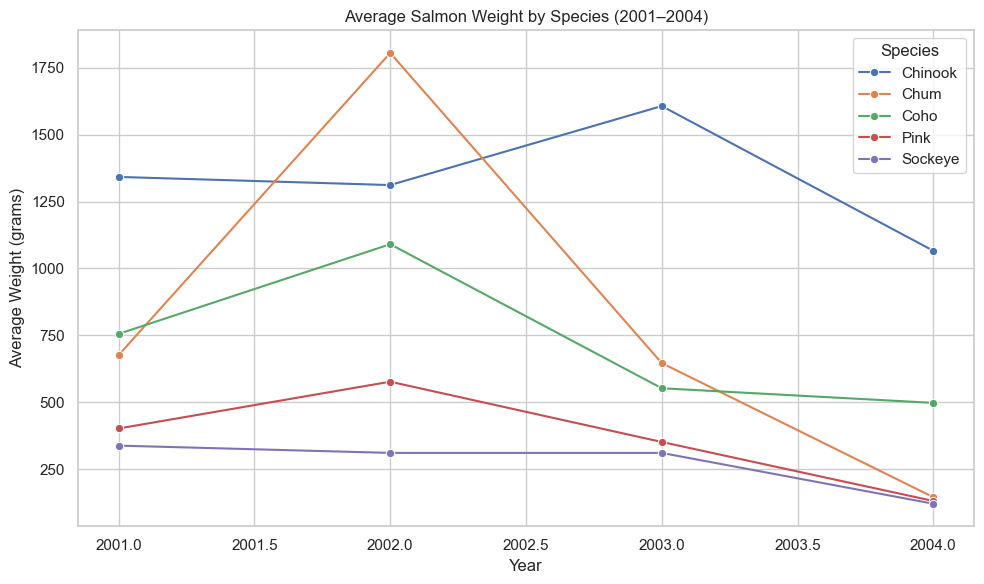

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.lineplot(
    data=avg_salmon_2001_2004,
    x='year',
    y='weight_wet_grams',
    hue='species_common_name',
    marker='o'
)
plt.title("Average Salmon Weight by Species (2001–2004)")
plt.ylabel("Average Weight (grams)")
plt.xlabel("Year")
plt.legend(title="Species")
plt.tight_layout()
plt.show()

Future year forecasting

In [ ]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Make a copy of the full DataFrame
avg_salmon_forecast = avg_salmon_2001_2004.copy()

# Prepare storage for forecast results
forecast_df = pd.DataFrame()

# Loop through each species
for species in avg_salmon_forecast['species_common_name'].unique():
    df_species = avg_salmon_forecast[avg_salmon_forecast['species_common_name'] == species]

    # Training data
    X = df_species['year'].values.reshape(-1, 1)
    y = df_species['weight_wet_grams'].values

    # Fit linear regression
    model = LinearRegression()
    model.fit(X, y)

    # Predict for years 2001–2025
    years = np.arange(2001, 2026).reshape(-1, 1)
    preds = model.predict(years)

    # Clamp predictions: no negative weights
    preds = np.clip(preds, 0, None)  # sets all values below 0 to 0

    # Add to forecast DataFrame
    species_df = pd.DataFrame({
        'year': years.flatten(),
        'weight_wet_grams': preds,
        'species_common_name': species
    })

    forecast_df = pd.concat([forecast_df, species_df], ignore_index=True)


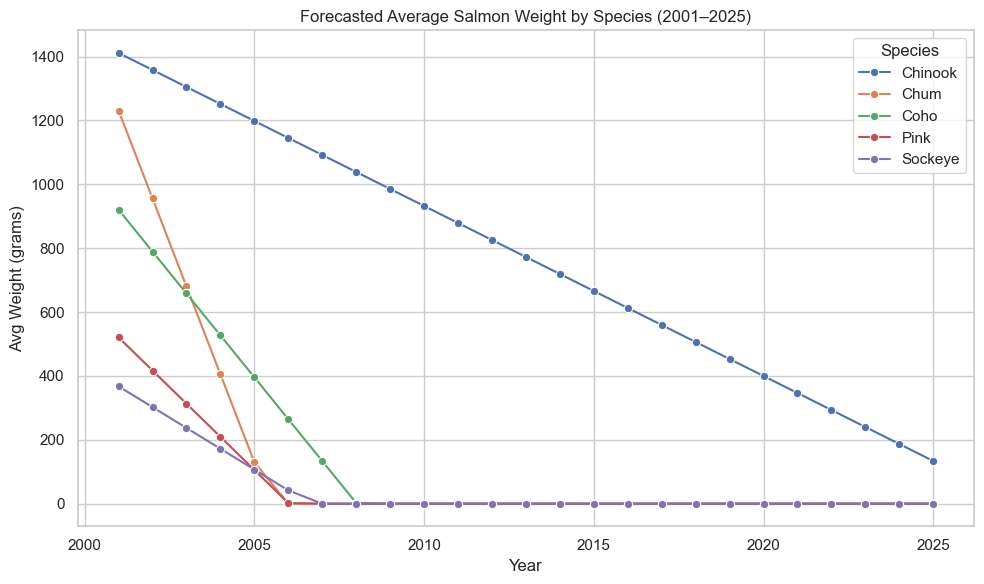

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=forecast_df,
    x='year',
    y='weight_wet_grams',
    hue='species_common_name',
    marker='o'
)
plt.title("Forecasted Average Salmon Weight by Species (2001–2025)")
plt.ylabel("Avg Weight (grams)")
plt.xlabel("Year")
plt.legend(title="Species")
plt.tight_layout()
plt.show()

### <span style="color:#8ac0ff;">Presentation 1</span>


1. 
Genetic Variation Across Populations
Hypothesis: Certain genetic mutations (I want to have a focus on neurodegenerative diseases if possible. Otherwise some other diseases that could be genetic/hereditary) I want to see if there are any coorelations in specific populations (age, sex, race, etc.) or regions through the world.

1.a. 
	
	Genetic Variation Across Populations
	[Refined] Hypotheses:

	H1: Certain SNPs are significantly more prevalent in specific geographic populations, reflecting historical migration patterns.
	H2: There’s a correlation between specific genetic variants and environmental factors like altitude or climate.
	H3: Population substructures (hidden genetic groupings within larger populations) can be detected through PCA or clustering techniques.
	Data Sources:

	1000 Genomes Project: Provides comprehensive SNP data from diverse populations.
	HGDP (Human Genome Diversity Project): Offers genetic data from indigenous populations worldwide.
	Approaches:

	PCA/Cluster Analysis: Identify how populations cluster based on genetic similarities.
	FST Analysis (Fixation Index): Measure genetic differentiation between populations.
	Visualization Ideas:
	PCA scatter plots colored by population groups.
	World maps with pie charts indicating allele frequencies.
	Heatmaps showing genetic distances between populations.


1.b. 
		
		1. Define the Focus
		We can refine the hypothesis even more depending on the disease and type of analysis you're interested in.

		Possible Hypotheses:

		H1: Differential gene expression can distinguish cancerous tissues from healthy tissues.
		H2: Certain gene expression profiles can predict patient outcomes (e.g., survival rates in cancer patients).
		H3: Gene co-expression networks reveal key regulatory genes responsible for disease progression.
		Do you want to focus on a specific disease, like cancer (e.g., breast, lung, leukemia), or explore something more broad, like autoimmune diseases or diabetes?

		2. Data Sources & Acquisition
		Here are a couple of great places to get started:

		The Cancer Genome Atlas (TCGA):

		Offers RNA-seq data for various cancer types along with clinical metadata (e.g., patient outcomes).
		We can use the TCGAbiolinks library to fetch data directly into Python.
		Gene Expression Omnibus (GEO):

		Contains expression data for a variety of diseases, not just cancer.
		We can use the GEOparse library to work with this data.
		ArrayExpress:

		Similar to GEO but might have unique datasets, especially for non-cancer diseases.
		3. Data Science Workflow
		Here’s a high-level overview of what we can do:

		Data Preprocessing:

		Clean and normalize the gene expression data (e.g., log transformation).
		Merge with clinical metadata (like disease status or survival outcomes).
		Exploratory Data Analysis (EDA):

		Use PCA to visualize high-dimensional data.
		Plot heatmaps to see clustering of expression profiles.
		Differential Expression Analysis:

		Use statistical tests (e.g., t-test, ANOVA) to find genes that are significantly differentially expressed between healthy and diseased samples.
		Visualize with volcano plots.
		Machine Learning for Prediction:

		Build classifiers (e.g., Random Forest, Logistic Regression, SVM) to predict disease status from gene expression data.
		Evaluate performance using ROC curves and confusion matrices.
		Gene Network Analysis (Optional but cool!):

		Construct co-expression networks to identify hub genes that might play key roles in disease pathways.
		Use libraries like NetworkX for visualization.
		4. Visualization Ideas
		Volcano Plot: Shows genes that are significantly upregulated or downregulated.
		Heatmaps: For gene expression clustering.
		PCA Plots: Visualize how well samples separate based on disease status.
		ROC Curves: To evaluate the accuracy of your predictive models.
		Gene Co-expression Networks: Visual graphs showing how genes interact in diseased vs. healthy samples.

1.c. 
			1. Data Acquisition:
			To compare multiple neurodegenerative disorders, you'll need comprehensive and well-annotated datasets. Here are some valuable resources:

			Gene Expression Omnibus (GEO): A vast repository of gene expression data across various conditions.

			Dataset Example: GSE26927 provides genome-wide gene expression data for Alzheimer's disease, amyotrophic lateral sclerosis, Huntington's disease, multiple sclerosis, Parkinson's disease, and schizophrenia using post-mortem CNS tissues. 
			NCBI.NLM.NIH.GOV
			Neurodegenerative Disease Knowledge Portal (NDKP): Contains genomic datasets, including genotyping and sequencing studies, across multiple neurodegenerative diseases. 
			PMC.NCBI.NLM.NIH.GOV

			NIAGADS Data Sharing Service: Offers datasets like the Seattle Alzheimer's Disease Brain Cell Atlas, which includes whole genome sequencing and genotyping data. 
			DSS.NIAGADS.ORG

			Elucidata's Curated Datasets: Provides transcriptomic and single-cell data for diseases such as ALS, Parkinson's, Huntington's, and Alzheimer's. 
			ELUCIDATA.IO

			Accessing Data:

			GEO: Use the GEOquery package in R or download data directly from the GEO website.

			NDKP and NIAGADS: These platforms may require account creation and data access requests due to controlled access policies.

			2. Analysis Pipeline Setup:

			A structured analysis pipeline ensures reproducibility and efficiency. Here's a step-by-step guide:

			a. Data Preprocessing:

			Quality Control: Assess raw sequencing data quality using tools like FastQC.

			Trimming: Remove low-quality bases and adapters with tools such as Trimmomatic or Cutadapt.

			b. Alignment:

			Align Reads: Map reads to a reference genome using aligners like STAR or HISAT2.
			c. Quantification:

			Count Reads: Use featureCounts or HTSeq to assign reads to genomic features, generating a count matrix.
			d. Differential Expression Analysis:

			Normalization and Statistical Testing: Utilize DESeq2 for normalization and identification of differentially expressed genes.
			e. Functional Enrichment:

			Pathway Analysis: Employ tools like clusterProfiler to identify enriched biological pathways among differentially expressed genes.
			Python Integration:

			While many RNA-Seq analysis tools are R-based, Python offers alternatives:

			pyDESeq2: A Python implementation of DESeq2 for differential expression analysis. 
			YOUTUBE.COM

			pyrpipe: A Python package providing access to popular RNA-Seq tools via high-level APIs, facilitating pipeline customization. 
			ACADEMIC.OUP.COM

			Workflow Management:

			Snakemake: A Python-based workflow management system that ensures reproducibility and scalability.
			Visualization:

			Heatmaps and PCA Plots: Use libraries like Matplotlib and Seaborn in Python or ggplot2 in R to visualize gene expression patterns and sample clustering.

			3. Additional Resources:

			Tutorials:

			RNA-Seq Data Analysis Pipeline: A comprehensive guide detailing each step of the RNA-Seq analysis process. 
			PMC.NCBI.NLM.NIH.GOV

			PyDESeq2 Workflow: An example workflow demonstrating differential expression analysis using PyDESeq2. 
			PYDESEQ2.READTHEDOCS.IO

			Video Guides:

			Differential Expression in Python with pyDESeq2: A tutorial covering basic differential expression analysis, PCA plots, and GSEA. 
			YOUTUBE.COM

			Setup RNA-Seq Pipeline from Scratch: A step-by-step video guide on setting up an RNA-Seq analysis pipeline. 
			YOUTUBE.COM



* I want to first check that this all merges with the following: Salmon biodata, Climate data, Alaska Economy

    * I plan to attempt this with merging CLIMATE and ECONOMY on a common key of the year(if I can ideally exact date or mm-yyyy)

    * With that merged I can then create a map of the location of the salmon data and create a 'range' that I can then use to attribute the LAT/LONG of fishing location against the various Weather Stations.

        * Ex: {[70,80],[70.8,79.9],[71.4,80],[71,81.6],[70.6,81],[70,82]} : {Anchorage}

            * This is not the same exact syntax, but it would be identical to how python works with dictionaries

## <span style="color:#BDDEEC;">2025-02-12 - Climate Data Analysis</span>


Let's get ~10 weather stations in Alaska that align with our fishing datasets to get a general idea of what the temperatures are like where we are fishing.

We will later cluster these and give it names for each channel fishing location and weather station.

Homer, Juneau, and Kodiak are some big name fishing spots in Alaska

1. Anchorage International Airport (PANC)

    * Location: Anchorage, AK

    * Coordinates: 61.1743° N, 149.9982° W

    * Description: Major weather station providing extensive data for south-central Alaska.

2. Fairbanks International Airport (PAFA)

    * Location: Fairbanks, AK

    * Coordinates: 64.8039° N, 147.8761° W

    * Description: Key station offering data for interior Alaska.

3. Juneau International Airport (PAJN)

    * Location: Juneau, AK

    * Coordinates: 58.3549° N, 134.5763° W

    * Description: Provides weather data for the southeastern region.

4. Nome Airport (PAOM)

    * Location: Nome, AK

    * Coordinates: 64.5122° N, 165.4452° W

    * Description: Covers the western coastal areas.

5. Barrow (Utqiaġvik) Wiley Post–Will Rogers Memorial Airport (PABR)

    * Location: Utqiaġvik, AK

    * Coordinates: 71.2854° N, 156.7660° W

    * Description: Northernmost station providing Arctic data.

6. Kodiak Airport (PADQ)

    * Location: Kodiak, AK

    * Coordinates: 57.7499° N, 152.4938° W

    * Description: Offers data for the Gulf of Alaska region.

7. Bethel Airport (PABE)

    * Location: Bethel, AK

    * Coordinates: 60.7798° N, 161.8370° W

    * Description: Provides information for the Yukon-Kuskokwim Delta.

8. King Salmon Airport (PAKN)

    * Location: King Salmon, AK

    * Coordinates: 58.6768° N, 156.6492° W

    * Description: Covers the Bristol Bay area.

9. Yakutat Airport (PAYA)

    * Location: Yakutat, AK

    * Coordinates: 59.5033° N, 139.6602° W

    * Description: Provides data for the northern Gulf Coast.

10. McGrath Airport (PAMC)

    * Location: McGrath, AK

    * Coordinates: 62.9529° N, 155.6060° W

    * Description: Offers insights into central Alaska's weather patterns.



<span style="color:#BDDEEC ;"> <b>Demo our weather station datasets</span>


<span style="color:#ff0000;"><b>How we query for the above:</b></span>

Climate Sources:

* select Location Type
    * State
        * Alaska
            
https://www.ncdc.noaa.gov/cdo-web/datatools/lcd

## <span style="color:#FA8072;">2025-02-26 - Check in Key Points</span>


Climate Data

* Need to get more Sea data.
* Thermal levels through the years
    * NOAA as a resource

Salmon Data

* More of the same but with more year ranges and focus on last few years especially
* Possibly start thinking about adding more fish in alaska and if there are similiar signs of change in relation to the climate data through the years

Alaska Economic Data

* see datasets relating to Alaska economy like trucking, canning industry


See information about glaciers in Alaska, figure out how to overlay that data on an Alaskan map


## <span style="color:#FA8072;">2025-03-13 - Data Analysis (Plotnine library)</span>


* using NOAA finding climate data for the date range I have for the Salmon datasets

In [20]:
'''
from plotnine import ggplot, geom_point, aes, stat_smooth, facet_wrap
from plotnine.data import mtcars

(
    ggplot(mtcars, aes("wt", "mpg", color="factor(gear)"))
    + geom_point()
    + stat_smooth(method="lm")
    + facet_wrap("gear")
)
'''

'\nfrom plotnine import ggplot, geom_point, aes, stat_smooth, facet_wrap\nfrom plotnine.data import mtcars\n\n(\n    ggplot(mtcars, aes("wt", "mpg", color="factor(gear)"))\n    + geom_point()\n    + stat_smooth(method="lm")\n    + facet_wrap("gear")\n)\n'

### <span style="color:#FA8072;">Filtering our Salmon datasets</span>

In [21]:
# salmon.head(3)
salmon_2001 = salmon[salmon["year"] == 2001]

In [22]:
print(salmon_2001)

      year      transect sta_id  haul_id  month_local  day_local  yrday_local  \
0     2001     Icy_Point    IP2  2001001            7         17          198   
1     2001     Icy_Point    IP2  2001001            7         17          198   
2     2001     Icy_Point    IP2  2001001            7         17          198   
3     2001     Icy_Point    IP2  2001001            7         17          198   
4     2001     Icy_Point    IP2  2001001            7         17          198   
...    ...           ...    ...      ...          ...        ...          ...   
4138  2001  Cape_Kaguyak  CKAG6  2001075            8          6          218   
4139  2001  Cape_Kaguyak  CKAG6  2001075            8          6          218   
4140  2001  Cape_Kaguyak  CKAG6  2001075            8          6          218   
4141  2001  Cape_Kaguyak  CKAG6  2001075            8          6          218   
4142  2001  Cape_Kaguyak  CKAG6  2001075            8          6          218   

      latitude  longitude d

In [23]:
salmon_2001.dtypes

year                     int64
transect                object
sta_id                  object
haul_id                  int64
month_local              int64
day_local                int64
yrday_local              int64
latitude               float64
longitude              float64
depth_w_meters          object
species_common_name     object
length_frozen_cm        object
length_wet_cm           object
weight_froz_grams       object
weight_wet_grams        object
sex                     object
maturity                object
stomwt_full             object
stomwt_empty            object
sealice                 object
comments                object
dtype: object

In [24]:
print(sorted(salmon["species_common_name"].unique()))


['Chinook', 'Chum', 'Coho', 'Pink', 'Sockeye']


In [25]:
print(salmon["species_common_name"].value_counts())


species_common_name
Pink       12615
Chum        9543
Sockeye     2460
Coho        2170
Chinook      722
Name: count, dtype: int64


In [26]:
salmon_2001_Pink = salmon[(salmon["year"] == 2001) & (salmon["species_common_name"] == "Pink")]
salmon_2001_Chum = salmon[(salmon["year"] == 2001) & (salmon["species_common_name"] == "Chum")]
salmon_2001_Sockeye = salmon[(salmon["year"] == 2001) & (salmon["species_common_name"] == "Sockeye")]
salmon_2001_Coho = salmon[(salmon["year"] == 2001) & (salmon["species_common_name"] == "Coho")]
salmon_2001_Chinook = salmon[(salmon["year"] == 2001) & (salmon["species_common_name"] == "Chinook")]





In [27]:
print(salmon_2001_Pink)
print(salmon_2001_Chum)
print(salmon_2001_Sockeye)
print(salmon_2001_Coho)
print(salmon_2001_Chinook)

      year      transect sta_id  haul_id  month_local  day_local  yrday_local  \
97    2001     Icy_Point    IP2  2001001            7         17          198   
98    2001     Icy_Point    IP2  2001001            7         17          198   
99    2001     Icy_Point    IP2  2001001            7         17          198   
100   2001     Icy_Point    IP2  2001001            7         17          198   
101   2001     Icy_Point    IP2  2001001            7         17          198   
...    ...           ...    ...      ...          ...        ...          ...   
3988  2001  Cape_Kaguyak  CKAG4  2001073            8          5          217   
3989  2001  Cape_Kaguyak  CKAG4  2001073            8          5          217   
3990  2001  Cape_Kaguyak  CKAG4  2001073            8          5          217   
3991  2001  Cape_Kaguyak  CKAG4  2001073            8          5          217   
4108  2001  Cape_Kaguyak  CKAG5  2001074            8          5          217   

      latitude  longitude d

Add total count column 

In [28]:
salmon_2001_Pink["total_records"] = len(salmon_2001_Pink)

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2366567353.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  salmon_2001_Pink["total_records"] = len(salmon_2001_Pink)


Print just the selected column

In [29]:
print(salmon_2001_Pink["total_records"])

97      1158
98      1158
99      1158
100     1158
101     1158
        ... 
3988    1158
3989    1158
3990    1158
3991    1158
4108    1158
Name: total_records, Length: 1158, dtype: int64


In [30]:
salmon.dtypes

year                     int64
transect                object
sta_id                  object
haul_id                  int64
month_local              int64
day_local                int64
yrday_local              int64
latitude               float64
longitude              float64
depth_w_meters          object
species_common_name     object
length_frozen_cm        object
length_wet_cm           object
weight_froz_grams       object
weight_wet_grams        object
sex                     object
maturity                object
stomwt_full             object
stomwt_empty            object
sealice                 object
comments                object
dtype: object

In [31]:
from plotnine import ggplot, geom_point, aes, stat_smooth, facet_wrap

ggplot(salmon,aes(x="species_common_name", y="count")) + geom_bar(stat="identity",fill="skyblue")

NameError: name 'geom_bar' is not defined

In [ ]:
salmon.dtypes

year                     int64
transect                object
sta_id                  object
haul_id                  int64
month_local              int64
day_local                int64
yrday_local              int64
latitude               float64
longitude              float64
depth_w_meters          object
species_common_name     object
length_frozen_cm        object
length_wet_cm           object
weight_froz_grams       object
weight_wet_grams        object
sex                     object
maturity                object
stomwt_full             object
stomwt_empty            object
sealice                 object
comments                object
dtype: object

## <span style="color:#FA8072;">2025-03-22 & 2025-03-23 - Data Analysis (Weather Stations & Economy Datasets)</span>


What to work on 03/23/2025

* Organize the weather station csvs

getting the climate datasets for the weather stations on NOAA for date ranges 2001-01-01 to 2004-12-31

* I used the NCEI (National Centers for Enviornmental Information) to get the 4 years csvs of each of the 10 previously mentioned weather stations
    * I have saved locally in a directory named 'Weather Station Datasets'
        * Next step is to organzie and pull just the data types and the data ranges I need against my salmon biodata 

* I have also gathered some economic data for years where it has it broken down by community as well

Alaska Employment and Wages csv 2001 to 2016
    * I have this csv uploaded to my github for years 2001-2004 for the same weather stations

In [32]:
# get dataset
import pandas as pd
AlaskaEconomy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations.csv')

In [33]:
AlaskaEconomy.tail(5)

,OBJECTID,CommunityName,DataYear,ResidentsAge16AndOver,ResidentsEmployed,WagesLessThan5k,Wages5k_10k,Wages10k_20k,Wages20k_50k,WagesGreaterThan50k,...,EmployedIn2ndQtr,EmployedIn3rdQtr,EmployedIn4thQtr,EmployedInAllQtrs,NewHires,LocalLaborMarketInfoURL,TotalWages,UnemploymentInsuranceClaimants,x,y
59,2970,Kodiak Station,2004,409,135,57,19,32,26,1,...,111,96,84,57,57,NaN,1627766,16,-152.503700,57.738100
60,3396,McGrath,2004,271,182,43,12,32,69,26,...,159,159,140,107,91,NaN,4707457,40,-155.588353,62.950141
61,3862,Nome Census Area,2004,5942,4357,1198,500,738,1384,537,...,3526,3665,3559,2661,2031,NaN,101699020,1051,-164.256602,64.832997
62,3877,Nome,2004,2362,1750,242,153,229,703,423,...,1512,1550,1502,1224,629,NaN,60955693,235,-165.408560,64.498090
63,5844,Yakutat,2004,482,344,80,46,64,128,26,...,306,299,283,196,177,NaN,7238112,108,-139.750032,59.558761


In [34]:
print(AlaskaEconomy)

    OBJECTID                     CommunityName  DataYear  \
0        594                         Anchorage      2001   
1        624  Anchorage/Mat-Su Economic Region      2001   
2        774                            Barrow      2001   
3        834                Bethel Census Area      2001   
4        849                            Bethel      2001   
..       ...                               ...       ...   
59      2970                    Kodiak Station      2004   
60      3396                           McGrath      2004   
61      3862                  Nome Census Area      2004   
62      3877                              Nome      2004   
63      5844                           Yakutat      2004   

    ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  \
0                  181613             118312            19086        11037   
1                  225775             144873            24588        13847   
2                    2827               2243 

## <span style="color:#FA8072;">Cleaned up section of graphs and datasets</span>

Alaska Economic Datasets

In [35]:
# get dataset
import pandas as pd
Alaska_Unemployment = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economic%20Data%20-%202000-2004%20-%20Unemployment%20rate%20in%20Alaska.csv')
Alaska_RealGDP = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economic%20Data%20-%202000-2004%20-%20Real%20GDP%20of%20Alaska.csv')
Alaska_Poverty = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economic%20Data%20-%202000-2004%20-%20Poverty%20rate%20in%20Alaska.csv')
Alaska_PerCapitaIncome = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economic%20Data%20-%202000-2004%20-%20Per%20capita%20personal%20income%20in%20Alaska.csv')
Alaska_MedianHouseholdIncome = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economic%20Data%20-%202000-2004%20-%20Median%20household%20income%20in%20Alaska.csv')
Alaska_AnnualPercentageChangeGDP = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economic%20Data%20-%202000-2004%20-%20Annual%20Percentage%20change%20real%20GDP%20of%20Alaska.csv')


Alaska Economic Data - Weatherstations

In [36]:
# get dataset
import pandas as pd

Anchorage_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20ANCHORAGE%20-%20ECONOMY.csv')
Barrow_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20BARROW%20-%20ECONOMY.csv')
Bethel_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20BETHEL%20-%20ECONOMY.csv')
Fairbanks_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20FAIRBANKS%20-%20ECONOMY.csv')
Juneau_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20JUNEAU%20-%20ECONOMY.csv')
King_Salmon_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20KING%20SALMON%20-%20ECONOMY.csv')
Kodiak_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20KODIAK%20-%20ECONOMY.csv')
McGrath_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20MCGRATH%20-%20ECONOMY.csv')
Nome_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20NOME%20-%20ECONOMY.csv')
Yakutat_Economy = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Alaska%20Economy%202001-2004%20Weather%20Stations%20-%20YAKUTAT%20-%20ECONOMY.csv')

## <span style="color:#FA8072;">2025-03-27 - Clean up merging and get some Location Dependent Analysis </span>

* Cleaning through this and Organizing - 2025-04-04
* Trying to see why the second station(Barrow) is not working as expected like Anchorage - 2025-04-17

Using the AlaskaEconomy Df I will merge on an Anchorage CLIMATE DF on year

In [184]:
AlaskaEconomy_copy = AlaskaEconomy

In [185]:
import pandas as pd

# Adjust display options to show all rows
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)  # If you also want to see all columns
pd.set_option('display.width', 1000)  # Adjust width for better formatting

# Assuming your DataFrame is named 'df' and the column is named 'column_name'
print(AlaskaEconomy_copy['CommunityName'])

0                            Anchorage
1     Anchorage/Mat-Su Economic Region
2                               Barrow
3                   Bethel Census Area
4                               Bethel
5                            Fairbanks
6                   Juneau and borough
7          Juneau, City and Borough of
8                          King Salmon
9                               Kodiak
10               Kodiak Island Borough
11                      Kodiak Station
12                             McGrath
13                    Nome Census Area
14                                Nome
15                             Yakutat
16                           Anchorage
17    Anchorage/Mat-Su Economic Region
18                              Barrow
19                  Bethel Census Area
20                              Bethel
21                           Fairbanks
22                  Juneau and borough
23         Juneau, City and Borough of
24                         King Salmon
25                       

In [186]:
print(AlaskaEconomy_copy['CommunityName'])

0                            Anchorage
1     Anchorage/Mat-Su Economic Region
2                               Barrow
3                   Bethel Census Area
4                               Bethel
5                            Fairbanks
6                   Juneau and borough
7          Juneau, City and Borough of
8                          King Salmon
9                               Kodiak
10               Kodiak Island Borough
11                      Kodiak Station
12                             McGrath
13                    Nome Census Area
14                                Nome
15                             Yakutat
16                           Anchorage
17    Anchorage/Mat-Su Economic Region
18                              Barrow
19                  Bethel Census Area
20                              Bethel
21                           Fairbanks
22                  Juneau and borough
23         Juneau, City and Borough of
24                         King Salmon
25                       

In [187]:
print(AlaskaEconomy_copy)

    OBJECTID                     CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y
0        594                         Anchorage      2001                 181613             118312            19086        11037         18498         47595                22103                    99809                    0.84                 8089                0.07            58195          60116              36886              21959            101678            105374            104820            100040              84803     48658                      NaN  3721

#### <span style="color:#FA8072;">Economic Datasets for each Weather Station - 04-04-2025</span>
* Need to check/ add the other CommunityNames where it is similiar, say Anchorage has both Anchorage and Also like Anchorage-Economic-Region or something like that

In [311]:
AlaskaEconomy_copy_Yakutat = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'Yakutat']

In [312]:
AlaskaEconomy_copy_Nome = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'Nome']

In [313]:
AlaskaEconomy_copy_McGrath = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'McGrath']

In [314]:
AlaskaEconomy_copy_Kodiak = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'Kodiak']

In [315]:
AlaskaEconomy_copy_King_Salmon = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'King Salmon']

In [316]:
AlaskaEconomy_copy_Juneau = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'Juneau']

In [317]:
AlaskaEconomy_copy_Fairbanks = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'Fairbanks']

In [318]:
AlaskaEconomy_copy_Bethel = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'Bethel']

In [319]:
AlaskaEconomy_copy_Barrow = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'Barrow']

In [320]:
AlaskaEconomy_copy_Anchorage = AlaskaEconomy_copy[AlaskaEconomy_copy['CommunityName'] == 'Anchorage']

In [321]:
print(AlaskaEconomy_copy_Anchorage)

    OBJECTID CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y
0        594     Anchorage      2001                 181613             118312            19086        11037         18498         47595                22103                    99809                    0.84                 8089                0.07            58195          60116              36886              21959            101678            105374            104820            100040              84803     48658                      NaN  3721084534                           13758 -

#### <span style="color:#FA8072;">Need to make cols common name to join </span>

In [322]:
AlaskaEconomy_copy_Yakutat['WEATHER STATION NAME'] = AlaskaEconomy_copy_Yakutat['CommunityName']
AlaskaEconomy_copy_Yakutat['YEAR'] = AlaskaEconomy_copy_Yakutat['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3627086254.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3627086254.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [323]:
AlaskaEconomy_copy_Nome['WEATHER STATION NAME'] = AlaskaEconomy_copy_Nome['CommunityName']
AlaskaEconomy_copy_Nome['YEAR'] = AlaskaEconomy_copy_Nome['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2277039333.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2277039333.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [324]:
AlaskaEconomy_copy_McGrath['WEATHER STATION NAME'] = AlaskaEconomy_copy_McGrath['CommunityName']
AlaskaEconomy_copy_McGrath['YEAR'] = AlaskaEconomy_copy_McGrath['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4183112879.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4183112879.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [325]:
AlaskaEconomy_copy_Kodiak['WEATHER STATION NAME'] = AlaskaEconomy_copy_Kodiak['CommunityName']
AlaskaEconomy_copy_Kodiak['YEAR'] = AlaskaEconomy_copy_Kodiak['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\630494931.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\630494931.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [326]:
AlaskaEconomy_copy_King_Salmon['WEATHER STATION NAME'] = AlaskaEconomy_copy_King_Salmon['CommunityName']
AlaskaEconomy_copy_King_Salmon['YEAR'] = AlaskaEconomy_copy_King_Salmon['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1475215026.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1475215026.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [327]:
AlaskaEconomy_copy_Juneau['WEATHER STATION NAME'] = AlaskaEconomy_copy_Juneau['CommunityName']
AlaskaEconomy_copy_Juneau['YEAR'] = AlaskaEconomy_copy_Juneau['DataYear']

In [328]:
AlaskaEconomy_copy_Fairbanks['WEATHER STATION NAME'] = AlaskaEconomy_copy_Fairbanks['CommunityName']
AlaskaEconomy_copy_Fairbanks['YEAR'] = AlaskaEconomy_copy_Fairbanks['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4257732458.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4257732458.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [329]:
AlaskaEconomy_copy_Bethel['WEATHER STATION NAME'] = AlaskaEconomy_copy_Bethel['CommunityName']
AlaskaEconomy_copy_Bethel['YEAR'] = AlaskaEconomy_copy_Bethel['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4280410546.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4280410546.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [330]:
AlaskaEconomy_copy_Barrow['WEATHER STATION NAME'] = AlaskaEconomy_copy_Barrow['CommunityName']
AlaskaEconomy_copy_Barrow['YEAR'] = AlaskaEconomy_copy_Barrow['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\126803976.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\126803976.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [331]:
AlaskaEconomy_copy_Anchorage['WEATHER STATION NAME'] = AlaskaEconomy_copy_Anchorage['CommunityName']
AlaskaEconomy_copy_Anchorage['YEAR'] = AlaskaEconomy_copy_Anchorage['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1458748764.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1458748764.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [332]:
AlaskaEconomy_copy_Anchorage.dtypes

OBJECTID                            int64
CommunityName                      object
DataYear                            int64
ResidentsAge16AndOver               int64
ResidentsEmployed                   int64
WagesLessThan5k                     int64
Wages5k_10k                         int64
Wages10k_20k                        int64
Wages20k_50k                        int64
WagesGreaterThan50k                 int64
EmployedInPrivateSector             int64
PercentInPrivateSector            float64
EmployedInStateGovt                 int64
PercentInStateGovt                float64
EmployedFemales                     int64
EmployedMales                       int64
EmployedAge45Plus                   int64
EmployedAge50Plus                   int64
EmployedIn1stQtr                    int64
EmployedIn2ndQtr                    int64
EmployedIn3rdQtr                    int64
EmployedIn4thQtr                    int64
EmployedInAllQtrs                   int64
NewHires                          

In [333]:
print(AlaskaEconomy_copy_Anchorage)

    OBJECTID CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y WEATHER STATION NAME  YEAR
0        594     Anchorage      2001                 181613             118312            19086        11037         18498         47595                22103                    99809                    0.84                 8089                0.07            58195          60116              36886              21959            101678            105374            104820            100040              84803     48658                      NaN  3721084534       

#### <span style="color:#FA8072;">Alaska 2001 econ dataframe filtered - Added all 10 Weather Stations 2025-04-04</span>

In [334]:
AlaskaEconomy_copy_Yakutat_2001 = AlaskaEconomy_copy_Yakutat[AlaskaEconomy_copy_Yakutat['DataYear'] == 2001]

In [335]:
AlaskaEconomy_copy_Yakutat_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_Yakutat_2001['CommunityName']
AlaskaEconomy_copy_Yakutat_2001['YEAR'] = AlaskaEconomy_copy_Yakutat_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\734379055.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\734379055.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [336]:
AlaskaEconomy_copy_Nome_2001 = AlaskaEconomy_copy_Nome[AlaskaEconomy_copy_Nome['DataYear'] == 2001]

In [337]:
AlaskaEconomy_copy_Nome_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_Nome_2001['CommunityName']
AlaskaEconomy_copy_Nome_2001['YEAR'] = AlaskaEconomy_copy_Nome_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2360339529.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2360339529.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [338]:
AlaskaEconomy_copy_McGrath_2001 = AlaskaEconomy_copy_McGrath[AlaskaEconomy_copy_McGrath['DataYear'] == 2001]

In [339]:
AlaskaEconomy_copy_McGrath_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_McGrath_2001['CommunityName']
AlaskaEconomy_copy_McGrath_2001['YEAR'] = AlaskaEconomy_copy_McGrath_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3642568425.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3642568425.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [340]:
AlaskaEconomy_copy_Kodiak_2001 = AlaskaEconomy_copy_Kodiak[AlaskaEconomy_copy_Kodiak['DataYear'] == 2001]

In [341]:
AlaskaEconomy_copy_Kodiak_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_Kodiak_2001['CommunityName']
AlaskaEconomy_copy_Kodiak_2001['YEAR'] = AlaskaEconomy_copy_Kodiak_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2215164363.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2215164363.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [342]:
AlaskaEconomy_copy_King_Salmon_2001 = AlaskaEconomy_copy_King_Salmon[AlaskaEconomy_copy_King_Salmon['DataYear'] == 2001]

In [343]:
AlaskaEconomy_copy_King_Salmon_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_King_Salmon_2001['CommunityName']
AlaskaEconomy_copy_King_Salmon_2001['YEAR'] = AlaskaEconomy_copy_King_Salmon_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4125265956.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4125265956.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [344]:
AlaskaEconomy_copy_Juneau_2001 = AlaskaEconomy_copy_Juneau[AlaskaEconomy_copy_Juneau['DataYear'] == 2001]

In [345]:
AlaskaEconomy_copy_Juneau_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_Juneau_2001['CommunityName']
AlaskaEconomy_copy_Juneau_2001['YEAR'] = AlaskaEconomy_copy_Juneau_2001['DataYear']

In [346]:
AlaskaEconomy_copy_Fairbanks_2001 = AlaskaEconomy_copy_Fairbanks[AlaskaEconomy_copy_Fairbanks['DataYear'] == 2001]

In [347]:
AlaskaEconomy_copy_Fairbanks_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_Fairbanks_2001['CommunityName']
AlaskaEconomy_copy_Fairbanks_2001['YEAR'] = AlaskaEconomy_copy_Fairbanks_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1202585228.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1202585228.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [348]:
AlaskaEconomy_copy_Bethel_2001 = AlaskaEconomy_copy_Bethel[AlaskaEconomy_copy_Bethel['DataYear'] == 2001]

In [349]:
AlaskaEconomy_copy_Bethel_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_Bethel_2001['CommunityName']
AlaskaEconomy_copy_Bethel_2001['YEAR'] = AlaskaEconomy_copy_Bethel_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1325060747.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1325060747.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [350]:
AlaskaEconomy_copy_Barrow_2001 = AlaskaEconomy_copy_Barrow[AlaskaEconomy_copy_Barrow['DataYear'] == 2001]

In [351]:
AlaskaEconomy_copy_Barrow_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_Barrow_2001['CommunityName']
AlaskaEconomy_copy_Barrow_2001['YEAR'] = AlaskaEconomy_copy_Barrow_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2731726164.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2731726164.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Anchorage

In [352]:
AlaskaEconomy_copy_Anchorage_2001 = AlaskaEconomy_copy_Anchorage[AlaskaEconomy_copy_Anchorage['DataYear'] == 2001]

In [353]:
print(AlaskaEconomy_copy_Anchorage_2001)

   OBJECTID CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y WEATHER STATION NAME  YEAR
0       594     Anchorage      2001                 181613             118312            19086        11037         18498         47595                22103                    99809                    0.84                 8089                0.07            58195          60116              36886              21959            101678            105374            104820            100040              84803     48658                      NaN  3721084534         

In [354]:
AlaskaEconomy_copy_Anchorage_2001['WEATHER STATION NAME'] = AlaskaEconomy_copy_Anchorage_2001['CommunityName']
AlaskaEconomy_copy_Anchorage_2001['YEAR'] = AlaskaEconomy_copy_Anchorage_2001['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1980747526.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1980747526.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### <span style="color:#FA8072;">Alaska 2002 econ dataframe filtered - Added all 10 Weather Stations 2025-04-04</span>

2025-04-04 did the same for the 2002 year 

In [355]:
#### <span style="color:#FA8072;">Alaska 2002 econ dataframe filtered - Added all 10 Weather Stations 2025-04-04</span>
AlaskaEconomy_copy_Yakutat_2002 = AlaskaEconomy_copy_Yakutat[AlaskaEconomy_copy_Yakutat['DataYear'] == 2002]
AlaskaEconomy_copy_Yakutat_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Yakutat_2002['CommunityName']
AlaskaEconomy_copy_Yakutat_2002['YEAR'] = AlaskaEconomy_copy_Yakutat_2002['DataYear']
AlaskaEconomy_copy_Nome_2002 = AlaskaEconomy_copy_Nome[AlaskaEconomy_copy_Nome['DataYear'] == 2002]
AlaskaEconomy_copy_Nome_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Nome_2002['CommunityName']
AlaskaEconomy_copy_Nome_2002['YEAR'] = AlaskaEconomy_copy_Nome_2002['DataYear']
AlaskaEconomy_copy_McGrath_2002 = AlaskaEconomy_copy_McGrath[AlaskaEconomy_copy_McGrath['DataYear'] == 2002]
AlaskaEconomy_copy_McGrath_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_McGrath_2002['CommunityName']
AlaskaEconomy_copy_McGrath_2002['YEAR'] = AlaskaEconomy_copy_McGrath_2002['DataYear']
AlaskaEconomy_copy_Kodiak_2002 = AlaskaEconomy_copy_Kodiak[AlaskaEconomy_copy_Kodiak['DataYear'] == 2002]
AlaskaEconomy_copy_Kodiak_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Kodiak_2002['CommunityName']
AlaskaEconomy_copy_Kodiak_2002['YEAR'] = AlaskaEconomy_copy_Kodiak_2002['DataYear']
AlaskaEconomy_copy_King_Salmon_2002 = AlaskaEconomy_copy_King_Salmon[AlaskaEconomy_copy_King_Salmon['DataYear'] == 2002]
AlaskaEconomy_copy_King_Salmon_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_King_Salmon_2002['CommunityName']
AlaskaEconomy_copy_King_Salmon_2002['YEAR'] = AlaskaEconomy_copy_King_Salmon_2002['DataYear']
AlaskaEconomy_copy_Juneau_2002 = AlaskaEconomy_copy_Juneau[AlaskaEconomy_copy_Juneau['DataYear'] == 2002]
AlaskaEconomy_copy_Juneau_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Juneau_2002['CommunityName']
AlaskaEconomy_copy_Juneau_2002['YEAR'] = AlaskaEconomy_copy_Juneau_2002['DataYear']
AlaskaEconomy_copy_Fairbanks_2002 = AlaskaEconomy_copy_Fairbanks[AlaskaEconomy_copy_Fairbanks['DataYear'] == 2002]
AlaskaEconomy_copy_Fairbanks_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Fairbanks_2002['CommunityName']
AlaskaEconomy_copy_Fairbanks_2002['YEAR'] = AlaskaEconomy_copy_Fairbanks_2002['DataYear']
AlaskaEconomy_copy_Bethel_2002 = AlaskaEconomy_copy_Bethel[AlaskaEconomy_copy_Bethel['DataYear'] == 2002]
AlaskaEconomy_copy_Bethel_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Bethel_2002['CommunityName']
AlaskaEconomy_copy_Bethel_2002['YEAR'] = AlaskaEconomy_copy_Bethel_2002['DataYear']
AlaskaEconomy_copy_Barrow_2002 = AlaskaEconomy_copy_Barrow[AlaskaEconomy_copy_Barrow['DataYear'] == 2002]
AlaskaEconomy_copy_Barrow_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Barrow_2002['CommunityName']
AlaskaEconomy_copy_Barrow_2002['YEAR'] = AlaskaEconomy_copy_Barrow_2002['DataYear']
#Anchorage
AlaskaEconomy_copy_Anchorage_2002 = AlaskaEconomy_copy_Anchorage[AlaskaEconomy_copy_Anchorage['DataYear'] == 2002]
print(AlaskaEconomy_copy_Anchorage_2002)
AlaskaEconomy_copy_Anchorage_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Anchorage_2002['CommunityName']
AlaskaEconomy_copy_Anchorage_2002['YEAR'] = AlaskaEconomy_copy_Anchorage_2002['DataYear']

    OBJECTID CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y WEATHER STATION NAME  YEAR
16       595     Anchorage      2002                 184129             119746            18572        10963         18303         48483                23434                   100353                    0.84                 8547                0.07            59187          60559              38771              23441            103141            107416            106464            101428              86896     43588                      NaN  3860409202       

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\925978367.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\925978367.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\925978367.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

In [356]:
AlaskaEconomy_copy_Anchorage_2002 = AlaskaEconomy_copy_Anchorage[AlaskaEconomy_copy_Anchorage['DataYear'] == 2002]

In [357]:
AlaskaEconomy_copy_Anchorage_2002['WEATHER STATION NAME'] = AlaskaEconomy_copy_Anchorage_2002['CommunityName']
AlaskaEconomy_copy_Anchorage_2002['YEAR'] = AlaskaEconomy_copy_Anchorage_2002['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3167708821.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3167708821.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### <span style="color:#FA8072;">Alaska 2003 econ dataframe filtered - Added all 10 Weather Stations 2025-04-04</span>

2025-04-04 did the same for the 2003 year 

In [358]:
#### <span style="color:#FA8072;">Alaska 2003 econ dataframe filtered - Added all 10 Weather Stations 2025-04-04</span>
AlaskaEconomy_copy_Yakutat_2003 = AlaskaEconomy_copy_Yakutat[AlaskaEconomy_copy_Yakutat['DataYear'] == 2003]
AlaskaEconomy_copy_Yakutat_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Yakutat_2003['CommunityName']
AlaskaEconomy_copy_Yakutat_2003['YEAR'] = AlaskaEconomy_copy_Yakutat_2003['DataYear']
AlaskaEconomy_copy_Nome_2003 = AlaskaEconomy_copy_Nome[AlaskaEconomy_copy_Nome['DataYear'] == 2003]
AlaskaEconomy_copy_Nome_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Nome_2003['CommunityName']
AlaskaEconomy_copy_Nome_2003['YEAR'] = AlaskaEconomy_copy_Nome_2003['DataYear']
AlaskaEconomy_copy_McGrath_2003 = AlaskaEconomy_copy_McGrath[AlaskaEconomy_copy_McGrath['DataYear'] == 2003]
AlaskaEconomy_copy_McGrath_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_McGrath_2003['CommunityName']
AlaskaEconomy_copy_McGrath_2003['YEAR'] = AlaskaEconomy_copy_McGrath_2003['DataYear']
AlaskaEconomy_copy_Kodiak_2003 = AlaskaEconomy_copy_Kodiak[AlaskaEconomy_copy_Kodiak['DataYear'] == 2003]
AlaskaEconomy_copy_Kodiak_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Kodiak_2003['CommunityName']
AlaskaEconomy_copy_Kodiak_2003['YEAR'] = AlaskaEconomy_copy_Kodiak_2003['DataYear']
AlaskaEconomy_copy_King_Salmon_2003 = AlaskaEconomy_copy_King_Salmon[AlaskaEconomy_copy_King_Salmon['DataYear'] == 2003]
AlaskaEconomy_copy_King_Salmon_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_King_Salmon_2003['CommunityName']
AlaskaEconomy_copy_King_Salmon_2003['YEAR'] = AlaskaEconomy_copy_King_Salmon_2003['DataYear']
AlaskaEconomy_copy_Juneau_2003 = AlaskaEconomy_copy_Juneau[AlaskaEconomy_copy_Juneau['DataYear'] == 2003]
AlaskaEconomy_copy_Juneau_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Juneau_2003['CommunityName']
AlaskaEconomy_copy_Juneau_2003['YEAR'] = AlaskaEconomy_copy_Juneau_2003['DataYear']
AlaskaEconomy_copy_Fairbanks_2003 = AlaskaEconomy_copy_Fairbanks[AlaskaEconomy_copy_Fairbanks['DataYear'] == 2003]
AlaskaEconomy_copy_Fairbanks_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Fairbanks_2003['CommunityName']
AlaskaEconomy_copy_Fairbanks_2003['YEAR'] = AlaskaEconomy_copy_Fairbanks_2003['DataYear']
AlaskaEconomy_copy_Bethel_2003 = AlaskaEconomy_copy_Bethel[AlaskaEconomy_copy_Bethel['DataYear'] == 2003]
AlaskaEconomy_copy_Bethel_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Bethel_2003['CommunityName']
AlaskaEconomy_copy_Bethel_2003['YEAR'] = AlaskaEconomy_copy_Bethel_2003['DataYear']
AlaskaEconomy_copy_Barrow_2003 = AlaskaEconomy_copy_Barrow[AlaskaEconomy_copy_Barrow['DataYear'] == 2003]
AlaskaEconomy_copy_Barrow_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Barrow_2003['CommunityName']
AlaskaEconomy_copy_Barrow_2003['YEAR'] = AlaskaEconomy_copy_Barrow_2003['DataYear']
#Anchorage
AlaskaEconomy_copy_Anchorage_2003 = AlaskaEconomy_copy_Anchorage[AlaskaEconomy_copy_Anchorage['DataYear'] == 2003]
print(AlaskaEconomy_copy_Anchorage_2003)
AlaskaEconomy_copy_Anchorage_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Anchorage_2003['CommunityName']
AlaskaEconomy_copy_Anchorage_2003['YEAR'] = AlaskaEconomy_copy_Anchorage_2003['DataYear']

    OBJECTID CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y WEATHER STATION NAME  YEAR
32       596     Anchorage      2003                 187255             121006            18418        10963         17925         48899                24809                   101519                    0.84                 8435                0.07            59949          61057              40678              25122            104527            108202            107404            102618              87896     42566                      NaN  3985450550       

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1701016260.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1701016260.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1701016260.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

In [359]:
AlaskaEconomy_copy_Anchorage_2003 = AlaskaEconomy_copy_Anchorage[AlaskaEconomy_copy_Anchorage['DataYear'] == 2003]

In [360]:
AlaskaEconomy_copy_Anchorage_2003['WEATHER STATION NAME'] = AlaskaEconomy_copy_Anchorage_2003['CommunityName']
AlaskaEconomy_copy_Anchorage_2003['YEAR'] = AlaskaEconomy_copy_Anchorage_2003['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2209338236.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2209338236.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### <span style="color:#FA8072;">Alaska 2004 econ dataframe filtered - Added all 10 Weather Stations 2025-04-04</span>

2025-04-04 did the same for the 2004 year 

In [361]:
#### <span style="color:#FA8072;">Alaska 2004 econ dataframe filtered - Added all 10 Weather Stations 2025-04-04</span>
AlaskaEconomy_copy_Yakutat_2004 = AlaskaEconomy_copy_Yakutat[AlaskaEconomy_copy_Yakutat['DataYear'] == 2004]
AlaskaEconomy_copy_Yakutat_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Yakutat_2004['CommunityName']
AlaskaEconomy_copy_Yakutat_2004['YEAR'] = AlaskaEconomy_copy_Yakutat_2004['DataYear']
AlaskaEconomy_copy_Nome_2004 = AlaskaEconomy_copy_Nome[AlaskaEconomy_copy_Nome['DataYear'] == 2004]
AlaskaEconomy_copy_Nome_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Nome_2004['CommunityName']
AlaskaEconomy_copy_Nome_2004['YEAR'] = AlaskaEconomy_copy_Nome_2004['DataYear']
AlaskaEconomy_copy_McGrath_2004 = AlaskaEconomy_copy_McGrath[AlaskaEconomy_copy_McGrath['DataYear'] == 2004]
AlaskaEconomy_copy_McGrath_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_McGrath_2004['CommunityName']
AlaskaEconomy_copy_McGrath_2004['YEAR'] = AlaskaEconomy_copy_McGrath_2004['DataYear']
AlaskaEconomy_copy_Kodiak_2004 = AlaskaEconomy_copy_Kodiak[AlaskaEconomy_copy_Kodiak['DataYear'] == 2004]
AlaskaEconomy_copy_Kodiak_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Kodiak_2004['CommunityName']
AlaskaEconomy_copy_Kodiak_2004['YEAR'] = AlaskaEconomy_copy_Kodiak_2004['DataYear']
AlaskaEconomy_copy_King_Salmon_2004 = AlaskaEconomy_copy_King_Salmon[AlaskaEconomy_copy_King_Salmon['DataYear'] == 2004]
AlaskaEconomy_copy_King_Salmon_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_King_Salmon_2004['CommunityName']
AlaskaEconomy_copy_King_Salmon_2004['YEAR'] = AlaskaEconomy_copy_King_Salmon_2004['DataYear']
AlaskaEconomy_copy_Juneau_2004 = AlaskaEconomy_copy_Juneau[AlaskaEconomy_copy_Juneau['DataYear'] == 2004]
AlaskaEconomy_copy_Juneau_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Juneau_2004['CommunityName']
AlaskaEconomy_copy_Juneau_2004['YEAR'] = AlaskaEconomy_copy_Juneau_2004['DataYear']
AlaskaEconomy_copy_Fairbanks_2004 = AlaskaEconomy_copy_Fairbanks[AlaskaEconomy_copy_Fairbanks['DataYear'] == 2004]
AlaskaEconomy_copy_Fairbanks_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Fairbanks_2004['CommunityName']
AlaskaEconomy_copy_Fairbanks_2004['YEAR'] = AlaskaEconomy_copy_Fairbanks_2004['DataYear']
AlaskaEconomy_copy_Bethel_2004 = AlaskaEconomy_copy_Bethel[AlaskaEconomy_copy_Bethel['DataYear'] == 2004]
AlaskaEconomy_copy_Bethel_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Bethel_2004['CommunityName']
AlaskaEconomy_copy_Bethel_2004['YEAR'] = AlaskaEconomy_copy_Bethel_2004['DataYear']
AlaskaEconomy_copy_Barrow_2004 = AlaskaEconomy_copy_Barrow[AlaskaEconomy_copy_Barrow['DataYear'] == 2004]
AlaskaEconomy_copy_Barrow_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Barrow_2004['CommunityName']
AlaskaEconomy_copy_Barrow_2004['YEAR'] = AlaskaEconomy_copy_Barrow_2004['DataYear']
#Anchorage
AlaskaEconomy_copy_Anchorage_2004 = AlaskaEconomy_copy_Anchorage[AlaskaEconomy_copy_Anchorage['DataYear'] == 2004]
print(AlaskaEconomy_copy_Anchorage_2004)
AlaskaEconomy_copy_Anchorage_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Anchorage_2004['CommunityName']
AlaskaEconomy_copy_Anchorage_2004['YEAR'] = AlaskaEconomy_copy_Anchorage_2004['DataYear']

    OBJECTID CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y WEATHER STATION NAME  YEAR
48       597     Anchorage      2004                 188722             121958            17804        10985         17734         48997                26441                   102499                    0.84                 8345                0.07            60698          61260              42133              26664            104657            109316            108596            104122              88639     43446                      NaN  4151574482       

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\254881643.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\254881643.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\254881643.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

In [362]:
AlaskaEconomy_copy_Anchorage_2004 = AlaskaEconomy_copy_Anchorage[AlaskaEconomy_copy_Anchorage['DataYear'] == 2004]

In [363]:
AlaskaEconomy_copy_Anchorage_2004['WEATHER STATION NAME'] = AlaskaEconomy_copy_Anchorage_2004['CommunityName']
AlaskaEconomy_copy_Anchorage_2004['YEAR'] = AlaskaEconomy_copy_Anchorage_2004['DataYear']

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3515198140.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3515198140.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### I have all of the climate datasets, however they have all of the days for each year, I can do averages for each month and just include a year column.

I WILL FOCUS ON THE MOTNH RANGE OF 07-09 FOR EACH YEAR

#### Anchorage

In [364]:
import pandas as pd

Weather_Anchorage_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Anchorage%20International%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')


In [365]:
Weather_Anchorage_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Anchorage%20International%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')

In [366]:
Weather_Anchorage_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Anchorage%20International%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')

In [367]:
Weather_Anchorage_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Anchorage%20International%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')


In [368]:
Weather_Anchorage_2001_07_09.head(5)
Weather_Anchorage_2002_07_09.head(5)
Weather_Anchorage_2003_07_09.head(5)
Weather_Anchorage_2004_07_09.head(5)

,WEATHER STATION NAME,STATION,YEAR,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,MonthlyAverageWindSpeed,CoolingDegreeDaysSeasonToDate,MonthlyCoolingDegreeDays,MonthlyNumberDaysWithSnowfall,HeatingDegreeDaysSeasonToDate,MonthlyHeatingDegreeDays,MonthlyNumberDaysWithThunderstorms,MonthlyNumberDaysWithHeavyFog,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurationPrecipitationValue150,ShortDurationPrecipitationValue180,REM,BackupDirection,BackupDistance,BackupDistanceUnit,BackupElements,BackupElevation,BackupEquipment,BackupLatitude,BackupLongitude,BackupName,WindEquipmentChangeDate
0,ANCHORAGE,USW00026451,2004,2004-07-01 0:00:00,61.169,-150.0278,36.6,"ANCHORAGE TED STEVENS INTERNATIONAL AIRPORT, A...",SOD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,328.0,2239.0,NaN,13.9,NaN,NaN,NaN,NaN,1.8,0.0,-0.93,4.4,15.6,12.2,340.0,6.3,0,0.0,0,300.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SE,1.7,mi,"TEMP, PRECIP, SNOW",131,"MMTS, SRG, SNOWBOARD, SNOWSTAKE",61.1561,-149.9847,"ANCHORAGE FORECAST OFFICE, AK",06/01/2006
1,ANCHORAGE,USW00026451,2004,2004-07-01 0:00:00,61.169,-150.0278,36.6,"ANCHORAGE TED STEVENS INTERNATIONAL AIRPORT, A...",SOM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

#### Barrow

In [369]:
import pandas as pd

Weather_Barrow_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Barrow%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Barrow_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Barrow%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Barrow_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Barrow%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Barrow_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Barrow%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')


#### Bethel

In [370]:
import pandas as pd

Weather_Bethel_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Bethel%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Bethel_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Bethel%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Bethel_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Bethel%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Bethel_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Bethel%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')

#### Fairbanks

In [371]:
import pandas as pd

Weather_Fairbanks_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Fairbanks%20International%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Fairbanks_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Fairbanks%20International%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Fairbanks_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Fairbanks%20International%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Fairbanks_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Fairbanks%20International%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')

#### Juneau

In [372]:
import pandas as pd

Weather_Juneau_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Juneau%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Juneau_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Juneau%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Juneau_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Juneau%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Juneau_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Juneau%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')

#### King Salmon

In [373]:
import pandas as pd

Weather_King_Salmon_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20King%20Salmon%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_King_Salmon_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20King%20Salmon%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_King_Salmon_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20King%20Salmon%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
Weather_King_Salmon_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20King%20Salmon%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')


#### Kodiak

In [374]:
import pandas as pd

Weather_Kodiak_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Kodiak%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Kodiak_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Kodiak%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Kodiak_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Kodiak%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Kodiak_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Kodiak%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')

#### McGrath

In [375]:
import pandas as pd

Weather_McGrath_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-McGrath%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_McGrath_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-McGrath%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_McGrath_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-McGrath%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
Weather_McGrath_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-McGrath%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')

#### Nome

In [376]:
import pandas as pd

Weather_Nome_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Nome%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Nome_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Nome%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Nome_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Nome%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Nome_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Nome%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')


#### Yakutat

In [377]:
import pandas as pd

Weather_Yakutat_2001_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Yakutat%20Airport%20-%202001%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Yakutat_2002_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Yakutat%20Airport%20-%202002%20-%20filtered%20with%20dates%2007-09.csv')
Weather_Yakutat_2003_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Yakutat%20Airport%20-%202003%20-%20filtered%20with%20dates%2007-09.csv')
#Weather_Yakutat_2004_07_09 = pd.read_csv('https://github.com/eadamsRU/Masters_Project/raw/refs/heads/main/Weather%20-%20Yakutat%20Airport%20-%202004%20-%20filtered%20with%20dates%2007-09.csv')=

#### MERGE - Economy with Climate
DONE - NEED TO RENAME ALL THESE YEAR ONES TO SOMETHING _ANCHORAGE

##### 2001

In [378]:
# Weather_Anchorage_2001_07_09
# AlaskaEconomy_copy_Anchorage_2001
Alaska_weather_econ_MERGE_ANCHORAGE_2001 = pd.merge(Weather_Anchorage_2001_07_09, AlaskaEconomy_copy_Anchorage_2001, on ='YEAR', how = 'inner')


In [379]:
print(Alaska_weather_econ_MERGE_ANCHORAGE_2001)

     WEATHER STATION NAME_x      STATION  YEAR                 DATE  LATITUDE  LONGITUDE  ELEVATION                                               NAME REPORT_TYPE  SOURCE  HourlyAltimeterSetting  HourlyDewPointTemperature  HourlyDryBulbTemperature HourlyPrecipitation HourlyPresentWeatherType  HourlyPressureChange  HourlyPressureTendency  HourlyRelativeHumidity HourlySkyConditions  HourlySeaLevelPressure  HourlyStationPressure  HourlyVisibility  HourlyWetBulbTemperature  HourlyWindDirection  HourlyWindGustSpeed  HourlyWindSpeed  Sunrise  Sunset  DailyAverageDewPointTemperature  DailyAverageDryBulbTemperature  DailyAverageRelativeHumidity  DailyAverageSeaLevelPressure  DailyAverageStationPressure  DailyAverageWetBulbTemperature  DailyAverageWindSpeed  DailyCoolingDegreeDays  DailyDepartureFromNormalAverageTemperature  DailyHeatingDegreeDays  DailyMaximumDryBulbTemperature  DailyMinimumDryBulbTemperature  DailyPeakWindDirection  DailyPeakWindSpeed DailyPrecipitation  DailySnowDepth  \
0  

In [380]:
Alaska_weather_econ_MERGE_ANCHORAGE_2001.head(5)

,WEATHER STATION NAME_x,STATION,YEAR,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,MonthlyAverageWindSpeed,CoolingDegreeDaysSeasonToDate,MonthlyCoolingDegreeDays,MonthlyNumberDaysWithSnowfall,HeatingDegreeDaysSeasonToDate,MonthlyHeatingDegreeDays,MonthlyNumberDaysWithThunderstorms,MonthlyNumberDaysWithHeavyFog,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurationPrecipitationValue150,ShortDurationPrecipitationValue180,REM,BackupDirection,BackupDistance,BackupDistanceUnit,BackupElements,BackupElevation,BackupEquipment,BackupLatitude,BackupLongitude,BackupName,WindEquipmentChangeDate,OBJECTID,CommunityName,DataYear,ResidentsAge16AndOver,ResidentsEmployed,WagesLessThan5k,Wages5k_10k,Wages10k_20k,Wages20k_50k,WagesGreaterThan50k,EmployedInPrivateSector,PercentInPrivateSector,EmployedInStateGovt,PercentInStateGovt,EmployedFemales,EmployedMales,EmployedAge45Plus,EmployedAge50Plus,EmployedIn1stQtr,EmployedIn2ndQtr,EmployedIn3rdQtr,EmployedIn4thQtr,EmployedInAllQtrs,NewHires,LocalLaborMarketInfoURL,TotalWages,UnemploymentInsuranceClaimants,x,y,WEATHER STATION NAME_y
0,ANCHORAGE,USW00026451,2001,2001-07-01 0:00:00,61.169,-150.0278,36.6,"ANCHORAGE TED STEVENS INTERNATIONAL AIRPORT, A...",SOD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,327.0,2240.0,NaN,13.9,NaN,NaN,NaN,NaN,2.5,0.0,-0.93,4.4,18.3,9.4,250.0,6.7,0,0.0,0.0,250.0,5.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [381]:
Weather_Anchorage_2001_07_09.dtypes

WEATHER STATION NAME                             object
STATION                                          object
YEAR                                              int64
DATE                                             object
LATITUDE                                        float64
LONGITUDE                                       float64
ELEVATION                                       float64
NAME                                             object
REPORT_TYPE                                      object
SOURCE                                          float64
HourlyAltimeterSetting                          float64
HourlyDewPointTemperature                       float64
HourlyDryBulbTemperature                        float64
HourlyPrecipitation                              object
HourlyPresentWeatherType                         object
HourlyPressureChange                            float64
HourlyPressureTendency                          float64
HourlyRelativeHumidity                          

In [382]:
Weather_Barrow_2001_07_09.dtypes

WEATHER STATION                                 object
STATION                                         object
DATE                                            object
LATITUDE                                        object
LONGITUDE                                       object
ELEVATION                                       object
NAME                                            object
REPORT_TYPE                                     object
SOURCE                                          object
HourlyAltimeterSetting                          object
HourlyDewPointTemperature                       object
HourlyDryBulbTemperature                        object
HourlyPrecipitation                             object
HourlyPresentWeatherType                        object
HourlyPressureChange                            object
HourlyPressureTendency                          object
HourlyRelativeHumidity                          object
HourlySkyConditions                             object
HourlySeaL

Forgot to add YEAR col with matching year for the Weather_[weatherStationName]_YYYY_07_09 CSVs not including the ANCHORAGE ones

In [383]:
# 2001
Weather_Barrow_2001_07_09['YEAR'] = 2001
Weather_Bethel_2001_07_09['YEAR'] = 2001
Weather_Fairbanks_2001_07_09['YEAR'] = 2001
Weather_Juneau_2001_07_09['YEAR'] = 2001
Weather_King_Salmon_2001_07_09['YEAR'] = 2001
Weather_Kodiak_2001_07_09['YEAR'] = 2001
Weather_McGrath_2001_07_09['YEAR'] = 2001
Weather_Nome_2001_07_09['YEAR'] = 2001
Weather_Yakutat_2001_07_09['YEAR'] = 2001

# 2002
Weather_Barrow_2002_07_09['YEAR'] = 2002
Weather_Bethel_2002_07_09['YEAR'] = 2002
Weather_Fairbanks_2002_07_09['YEAR'] = 2002
Weather_Juneau_2002_07_09['YEAR'] = 2002
Weather_King_Salmon_2002_07_09['YEAR'] = 2002
Weather_Kodiak_2002_07_09['YEAR'] = 2002
Weather_McGrath_2002_07_09['YEAR'] = 2002
Weather_Nome_2002_07_09['YEAR'] = 2002
Weather_Yakutat_2002_07_09['YEAR'] = 2002

# 2003
Weather_Barrow_2003_07_09['YEAR'] = 2003
Weather_Bethel_2003_07_09['YEAR'] = 2003
Weather_Fairbanks_2003_07_09['YEAR'] = 2003
Weather_Juneau_2003_07_09['YEAR'] = 2003
Weather_King_Salmon_2003_07_09['YEAR'] = 2003
Weather_Kodiak_2003_07_09['YEAR'] = 2003
Weather_McGrath_2003_07_09['YEAR'] = 2003
Weather_Nome_2003_07_09['YEAR'] = 2003
Weather_Yakutat_2003_07_09['YEAR'] = 2003

# 2004
Weather_Barrow_2004_07_09['YEAR'] = 2004
Weather_Bethel_2004_07_09['YEAR'] = 2004
Weather_Fairbanks_2004_07_09['YEAR'] = 2004
Weather_Juneau_2004_07_09['YEAR'] = 2004
Weather_King_Salmon_2004_07_09['YEAR'] = 2004
Weather_Kodiak_2004_07_09['YEAR'] = 2004
Weather_McGrath_2004_07_09['YEAR'] = 2004
Weather_Nome_2004_07_09['YEAR'] = 2004
#Weather_Yakutat_2004_07_09['YEAR'] = 2004

In [384]:
Weather_Barrow_2001_07_09.head(4)

,WEATHER STATION,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,MonthlyAverageWindSpeed,CoolingDegreeDaysSeasonToDate,MonthlyCoolingDegreeDays,MonthlyNumberDaysWithSnowfall,HeatingDegreeDaysSeasonToDate,MonthlyHeatingDegreeDays,MonthlyNumberDaysWithThunderstorms,MonthlyNumberDaysWithHeavyFog,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurationPrecipitationValue150,ShortDurationPrecipitationValue180,REM,BackupDirection,BackupDistance,BackupDistanceUnit,BackupElements,BackupElevation,BackupEquipment,BackupLatitude,BackupLongitude,BackupName,WindEquipmentChangeDate,YEAR
0,BARROW,USW00027502,2001-07-01 0:00:00,71.2834,-156.7815,9.4,"BARROW AIRPORT, AK US",SOD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.4,NaN,NaN,NaN,NaN,5.5,0,1.4,11.9,11.7,1.1,100,9.8,0,0,0,100,8.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NW,0.35,mi,"TEMP, PRECIP, SNOW",20,"PSY, SRG, SNOWBOARD, SNOWSTAKE",71.2869,-156.795,WSO BARROW,06/17/2003,2001
1,BARROW,USW00027502,2001-07-01 0:00:00,71.2834,-156.7815,9.4,"BARROW AIRPORT, AK US",SOM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11

In [385]:
AlaskaEconomy_copy_Barrow_2001.dtypes

OBJECTID                            int64
CommunityName                      object
DataYear                            int64
ResidentsAge16AndOver               int64
ResidentsEmployed                   int64
WagesLessThan5k                     int64
Wages5k_10k                         int64
Wages10k_20k                        int64
Wages20k_50k                        int64
WagesGreaterThan50k                 int64
EmployedInPrivateSector             int64
PercentInPrivateSector            float64
EmployedInStateGovt                 int64
PercentInStateGovt                float64
EmployedFemales                     int64
EmployedMales                       int64
EmployedAge45Plus                   int64
EmployedAge50Plus                   int64
EmployedIn1stQtr                    int64
EmployedIn2ndQtr                    int64
EmployedIn3rdQtr                    int64
EmployedIn4thQtr                    int64
EmployedInAllQtrs                   int64
NewHires                          

In [386]:
Alaska_weather_econ_MERGE_BARROW_2001 = pd.merge(Weather_Barrow_2001_07_09, AlaskaEconomy_copy_Barrow_2001, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_BETHEL_2001 = pd.merge(Weather_Bethel_2001_07_09, AlaskaEconomy_copy_Bethel_2001, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_FAIRBANKS_2001 = pd.merge(Weather_Fairbanks_2001_07_09, AlaskaEconomy_copy_Fairbanks_2001, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_JUNEAU_2001 = pd.merge(Weather_Juneau_2001_07_09, AlaskaEconomy_copy_Juneau_2001, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_KING_SALMON_2001 = pd.merge(Weather_King_Salmon_2001_07_09, AlaskaEconomy_copy_King_Salmon_2001, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_KODIAK_2001 = pd.merge(Weather_Kodiak_2001_07_09, AlaskaEconomy_copy_Kodiak_2001, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_MCGRATH_2001 = pd.merge(Weather_McGrath_2001_07_09, AlaskaEconomy_copy_McGrath_2001, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_NOME_2001 = pd.merge(Weather_Nome_2001_07_09, AlaskaEconomy_copy_Nome_2001, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_YAKUTAT_2001 = pd.merge(Weather_Yakutat_2001_07_09, AlaskaEconomy_copy_Yakutat_2001, on ='YEAR', how = 'inner')


##### 2002

In [387]:
Alaska_weather_econ_MERGE_ANCHORAGE_2002 = pd.merge(Weather_Anchorage_2002_07_09, AlaskaEconomy_copy_Anchorage_2002, on ='YEAR', how = 'inner')

In [388]:
Alaska_weather_econ_MERGE_BARROW_2002 = pd.merge(Weather_Barrow_2002_07_09, AlaskaEconomy_copy_Barrow_2002, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_BETHEL_2002 = pd.merge(Weather_Bethel_2002_07_09, AlaskaEconomy_copy_Bethel_2002, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_FAIRBANKS_2002 = pd.merge(Weather_Fairbanks_2002_07_09, AlaskaEconomy_copy_Fairbanks_2002, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_JUNEAU_2002 = pd.merge(Weather_Juneau_2002_07_09, AlaskaEconomy_copy_Juneau_2002, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_KING_SALMON_2002 = pd.merge(Weather_King_Salmon_2002_07_09, AlaskaEconomy_copy_King_Salmon_2002, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_KODIAK_2002 = pd.merge(Weather_Kodiak_2002_07_09, AlaskaEconomy_copy_Kodiak_2002, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_MCGRATH_2002 = pd.merge(Weather_McGrath_2002_07_09, AlaskaEconomy_copy_McGrath_2002, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_NOME_2002 = pd.merge(Weather_Nome_2002_07_09, AlaskaEconomy_copy_Nome_2002, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_YAKUTAT_2002 = pd.merge(Weather_Yakutat_2002_07_09, AlaskaEconomy_copy_Yakutat_2002, on ='YEAR', how = 'inner')

##### 2003

In [389]:
Alaska_weather_econ_MERGE_ANCHORAGE_2003 = pd.merge(Weather_Anchorage_2003_07_09, AlaskaEconomy_copy_Anchorage_2003, on ='YEAR', how = 'inner')

In [390]:
Alaska_weather_econ_MERGE_BARROW_2003 = pd.merge(Weather_Barrow_2003_07_09, AlaskaEconomy_copy_Barrow_2003, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_BETHEL_2003 = pd.merge(Weather_Bethel_2003_07_09, AlaskaEconomy_copy_Bethel_2003, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_FAIRBANKS_2003 = pd.merge(Weather_Fairbanks_2003_07_09, AlaskaEconomy_copy_Fairbanks_2003, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_JUNEAU_2003 = pd.merge(Weather_Juneau_2003_07_09, AlaskaEconomy_copy_Juneau_2003, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_KING_SALMON_2003 = pd.merge(Weather_King_Salmon_2003_07_09, AlaskaEconomy_copy_King_Salmon_2003, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_KODIAK_2003 = pd.merge(Weather_Kodiak_2003_07_09, AlaskaEconomy_copy_Kodiak_2003, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_MCGRATH_2003 = pd.merge(Weather_McGrath_2003_07_09, AlaskaEconomy_copy_McGrath_2003, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_NOME_2003 = pd.merge(Weather_Nome_2003_07_09, AlaskaEconomy_copy_Nome_2003, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_YAKUTAT_2003 = pd.merge(Weather_Yakutat_2003_07_09, AlaskaEconomy_copy_Yakutat_2003, on ='YEAR', how = 'inner')

##### 2004
for some reason the Yakutat 2004 does not work

In [391]:
Alaska_weather_econ_MERGE_ANCHORAGE_2004 = pd.merge(Weather_Anchorage_2004_07_09, AlaskaEconomy_copy_Anchorage_2004, on ='YEAR', how = 'inner')

In [392]:
Alaska_weather_econ_MERGE_BARROW_2004 = pd.merge(Weather_Barrow_2004_07_09, AlaskaEconomy_copy_Barrow_2004, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_BETHEL_2004 = pd.merge(Weather_Bethel_2004_07_09, AlaskaEconomy_copy_Bethel_2004, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_FAIRBANKS_2004 = pd.merge(Weather_Fairbanks_2004_07_09, AlaskaEconomy_copy_Fairbanks_2004, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_JUNEAU_2004 = pd.merge(Weather_Juneau_2004_07_09, AlaskaEconomy_copy_Juneau_2004, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_KING_SALMON_2004 = pd.merge(Weather_King_Salmon_2004_07_09, AlaskaEconomy_copy_King_Salmon_2004, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_KODIAK_2004 = pd.merge(Weather_Kodiak_2004_07_09, AlaskaEconomy_copy_Kodiak_2004, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_MCGRATH_2004 = pd.merge(Weather_McGrath_2004_07_09, AlaskaEconomy_copy_McGrath_2004, on ='YEAR', how = 'inner')
Alaska_weather_econ_MERGE_NOME_2004 = pd.merge(Weather_Nome_2004_07_09, AlaskaEconomy_copy_Nome_2004, on ='YEAR', how = 'inner')
# Alaska_weather_econ_MERGE_YAKUTAT_2004 = pd.merge(Weather_Yakutat_2004_07_09, AlaskaEconomy_copy_Yakutat_2004, on ='YEAR', how = 'inner')

#### <span style="color:#ffd900;">Find some averages and counts of some variables, we can save these as variables and use within our reaserch to see comparisons year-to-year, by weather stations, etc</span>

#### <span style="color:#ffd900">ANCHORAGE WEATHER STATION - Merging for Metrics</span>

##### 2001

###### DryBulb Temp

In [393]:
AVG_DRYBULB_TEMP_ANCHORAGE_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_ANCHORAGE_2001['DailyAverageDryBulbTemperature'].mean()

In [394]:
AVG_DRYBULB_TEMP_ANCHORAGE_weather_econ_MERGE_2001

12.876086956521737

###### DailyDepartureFromNormalAverageTemperature 

In [395]:
AVG_DailyDepartureFromNormalAverageTemperature_ANCHORAGE_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_ANCHORAGE_2001['DailyDepartureFromNormalAverageTemperature'].mean()

In [396]:
AVG_DailyDepartureFromNormalAverageTemperature_ANCHORAGE_weather_econ_MERGE_2001

-0.1818478260869565

###### DailyAverageWindSpeed

In [397]:
AVG_DailyAverageWindSpeed_ANCHORAGE_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_ANCHORAGE_2001['DailyAverageWindSpeed'].mean()

In [398]:
AVG_DailyAverageWindSpeed_ANCHORAGE_weather_econ_MERGE_2001

2.8065217391304347

###### HourlySeaLevelPressure

In [399]:
AVG_HourlySeaLevelPressure_ANCHORAGE_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_ANCHORAGE_2001['HourlySeaLevelPressure'].mean()

In [400]:
AVG_HourlySeaLevelPressure_ANCHORAGE_weather_econ_MERGE_2001

1008.9310083698687

##### 2002

###### DryBulb Temp

In [401]:
AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_ANCHORAGE_2002['DailyAverageDryBulbTemperature'].mean()

In [402]:
AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2002

13.157608695652174

###### DailyAverageDryBulbTemperature

In [403]:
AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_ANCHORAGE_2002['DailyDepartureFromNormalAverageTemperature'].mean()

In [404]:
AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2002

0.09967391304347828

###### DailyAverageWindSpeed

In [405]:
AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_ANCHORAGE_2002['DailyAverageWindSpeed'].mean()

In [406]:
AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2002

3.1467391304347827

###### HourlySeaLevelPressure

In [407]:
AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_ANCHORAGE_2002['HourlySeaLevelPressure'].mean()

In [408]:
AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2002

1011.6605324074075

##### 2003

###### DryBulb Temp

In [409]:
AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_ANCHORAGE_2003['DailyAverageDryBulbTemperature'].mean()

In [410]:
AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2003

13.585869565217392

###### DailyAverageDryBulbTemperature

In [411]:
AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_ANCHORAGE_2003['DailyDepartureFromNormalAverageTemperature'].mean()

In [412]:
AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2003

0.5279347826086955

###### DailyAverageWindSpeed

In [413]:
AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_ANCHORAGE_2003['DailyAverageWindSpeed'].mean()

In [414]:
AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2003

3.3739130434782605

###### HourlySeaLevelPressure

In [415]:
AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_ANCHORAGE_2003['HourlySeaLevelPressure'].mean()

In [416]:
AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2003

1011.0504658963846

##### 2004

###### DryBulb Temp

In [417]:
AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_ANCHORAGE_2004['DailyAverageDryBulbTemperature'].mean()

In [418]:
AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2004

13.42282608695652

###### DailyAverageDryBulbTemperature

In [419]:
AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_ANCHORAGE_2004['DailyDepartureFromNormalAverageTemperature'].mean()

In [420]:
AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2004

0.3648913043478261

###### DailyAverageWindSpeed

In [421]:
AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_ANCHORAGE_2004['DailyAverageWindSpeed'].mean()

In [422]:
AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2004

2.7706521739130436

###### HourlySeaLevelPressure

In [423]:
AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_ANCHORAGE_2004['HourlySeaLevelPressure'].mean()

In [424]:
AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2004

1011.704870506378

#### <span style="color:#ffd900">BARROW WEATHER STATION - Merging for Metrics</span>
2025-04-17 done for 2001 with new method

##### 2001

###### DryBulb Temp

finding that the weather econ merge outside of ANCHORAGE df they all had object value types for these columns where ANCHORAGE one has float 64, so need to convert

In [600]:
Alaska_weather_econ_MERGE_ANCHORAGE_2001.dtypes

WEATHER STATION NAME_x                           object
STATION                                          object
YEAR                                              int64
DATE                                             object
LATITUDE                                        float64
LONGITUDE                                       float64
ELEVATION                                       float64
NAME                                             object
REPORT_TYPE                                      object
SOURCE                                          float64
HourlyAltimeterSetting                          float64
HourlyDewPointTemperature                       float64
HourlyDryBulbTemperature                        float64
HourlyPrecipitation                              object
HourlyPresentWeatherType                         object
HourlyPressureChange                            float64
HourlyPressureTendency                          float64
HourlyRelativeHumidity                          

In [601]:
Alaska_weather_econ_MERGE_BARROW_2001.dtypes

WEATHER STATION                                  object
STATION                                          object
DATE                                             object
LATITUDE                                         object
LONGITUDE                                        object
ELEVATION                                        object
NAME                                             object
REPORT_TYPE                                      object
SOURCE                                           object
HourlyAltimeterSetting                           object
HourlyDewPointTemperature                        object
HourlyDryBulbTemperature                         object
HourlyPrecipitation                              object
HourlyPresentWeatherType                         object
HourlyPressureChange                             object
HourlyPressureTendency                           object
HourlyRelativeHumidity                           object
HourlySkyConditions                             

convert types

In [602]:
Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageDryBulbTemperature'] = pd.to_numeric(Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageDryBulbTemperature'], errors='coerce')

In [603]:
print(Alaska_weather_econ_MERGE_BARROW_2001.head(10))

  WEATHER STATION      STATION                DATE LATITUDE  LONGITUDE ELEVATION                   NAME REPORT_TYPE SOURCE HourlyAltimeterSetting HourlyDewPointTemperature HourlyDryBulbTemperature HourlyPrecipitation HourlyPresentWeatherType HourlyPressureChange HourlyPressureTendency HourlyRelativeHumidity HourlySkyConditions HourlySeaLevelPressure HourlyStationPressure HourlyVisibility HourlyWetBulbTemperature HourlyWindDirection HourlyWindGustSpeed HourlyWindSpeed Sunrise Sunset DailyAverageDewPointTemperature  DailyAverageDryBulbTemperature DailyAverageRelativeHumidity DailyAverageSeaLevelPressure DailyAverageStationPressure DailyAverageWetBulbTemperature DailyAverageWindSpeed DailyCoolingDegreeDays DailyDepartureFromNormalAverageTemperature DailyHeatingDegreeDays DailyMaximumDryBulbTemperature DailyMinimumDryBulbTemperature DailyPeakWindDirection DailyPeakWindSpeed DailyPrecipitation DailySnowDepth DailySnowfall DailySustainedWindDirection DailySustainedWindSpeed DailyWeather  \
0

In [604]:
# this did not work

# Convert specific columns to float64
#Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageDryBulbTemperature'] = Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageDryBulbTemperature'].astype(float64)


In [605]:

AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2001


1.8673913043478259

###### DailyDepartureFromNormalAverageTemperature 

In [623]:
AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_BARROW_2001['DailyDepartureFromNormalAverageTemperature'].mean()
AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2001

TypeError: can only concatenate str (not "int") to str

<span style="color:#ffd900">* This is the work around that worked, very odd this occured as I saved in the same fashion as the intial Anchorage datasets.</span>

In [624]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_BARROW_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2001

-1.7066304347826087

###### DailyAverageWindSpeed

In [625]:
AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageWindSpeed'].mean()
AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2001


TypeError: can only concatenate str (not "int") to str

In [626]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_BARROW_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2001

5.466304347826087

###### HourlySeaLevelPressure

In [ ]:
AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_BARROW_2001['HourlySeaLevelPressure'].mean()
AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2001

TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [627]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_BARROW_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2001

1010.0850950570341

##### 2002

###### DryBulb Temp

In [628]:
'''Alaska_weather_econ_MERGE_BARROW_2002['DailyAverageDryBulbTemperature'] = pd.to_numeric(Alaska_weather_econ_MERGE_BARROW_2002['DailyAverageDryBulbTemperature'], errors='coerce')
AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2001'''

"Alaska_weather_econ_MERGE_BARROW_2002['DailyAverageDryBulbTemperature'] = pd.to_numeric(Alaska_weather_econ_MERGE_BARROW_2002['DailyAverageDryBulbTemperature'], errors='coerce')\nAVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2001"

In [629]:
AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_BARROW_2002['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2002

2.9663043478260867

###### DailyDepartureFromNormalAverageTemperature 

In [630]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_BARROW_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2002

-0.6077173913043478

###### DailyAverageWindSpeed

In [631]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_BARROW_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2002

5.067391304347826

###### HourlySeaLevelPressure

In [632]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_BARROW_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2002

1010.7958271787295

##### 2003


###### DryBulb Temp

In [633]:
AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_BARROW_2003['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2003

2.365217391304348

###### DailyDepartureFromNormalAverageTemperature 

In [634]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_BARROW_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2003

-1.208804347826087

###### DailyAverageWindSpeed

In [635]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_BARROW_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2003

5.705434782608696

###### HourlySeaLevelPressure

In [636]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_BARROW_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2003

1010.6136704572949

##### 2004

###### DryBulb Temp

In [637]:
AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_BARROW_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2004

4.461956521739131

###### DailyDepartureFromNormalAverageTemperature 

In [638]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2004['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2004['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_BARROW_2004['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2004

0.8879347826086957

###### DailyAverageWindSpeed

In [639]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2004['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2004['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_BARROW_2004['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2004

5.229347826086957

###### HourlySeaLevelPressure

In [640]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BARROW_2004['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BARROW_2004['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_BARROW_2004['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2004

1013.0587448941701

#### <span style="color:#ffd900">BETHEL WEATHER STATION - Merging for Metrics</span>

##### 2001


###### DryBulb Temp


In [661]:
AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_BETHEL_2001['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2001

10.254347826086954

###### DailyDepartureFromNormalAverageTemperature 


In [662]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_BETHEL_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2001

-0.9400000000000001

###### DailyAverageWindSpeed


In [663]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_BETHEL_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2001

3.760869565217391

###### HourlySeaLevelPressure

In [664]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_BETHEL_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2001

1009.2921732522797

##### 2002


###### DryBulb Temp


In [665]:
AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_BETHEL_2002['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2002

11.383695652173913

###### DailyDepartureFromNormalAverageTemperature 


In [666]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_BETHEL_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2002

0.1893478260869564

###### DailyAverageWindSpeed


In [667]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_BETHEL_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2002

4.373913043478261

###### HourlySeaLevelPressure

In [668]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_BETHEL_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2002

1011.8222222222222

##### 2003


###### DryBulb Temp


In [669]:
AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_BETHEL_2003['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2003

11.145652173913044

###### DailyDepartureFromNormalAverageTemperature 


In [670]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_BETHEL_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2003

-0.048695652173913084

###### DailyAverageWindSpeed


In [671]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_BETHEL_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2003

4.35108695652174

###### HourlySeaLevelPressure

In [672]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_BETHEL_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2003

1012.0999708369786

##### 2004


###### DryBulb Temp


In [673]:
AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_BETHEL_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2004

12.716304347826087

###### DailyDepartureFromNormalAverageTemperature 


In [674]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2004['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2004['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_BETHEL_2004['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2004

1.5219565217391302

###### DailyAverageWindSpeed


In [675]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2004['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2004['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_BETHEL_2004['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2004

3.884782608695652

###### HourlySeaLevelPressure

In [676]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_BETHEL_2004['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_BETHEL_2004['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_BETHEL_2004['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2004

1012.2736466165414

#### <span style="color:#ffd900">FAIRBANKS WEATHER STATION - Merging for Metrics</span>

##### 2001


###### DryBulb Temp


In [677]:
AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_FAIRBANKS_2001['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2001

12.790217391304346

###### DailyDepartureFromNormalAverageTemperature 


In [678]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2001

-0.16717391304347837

###### DailyAverageWindSpeed


In [679]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2001

1.776086956521739

###### HourlySeaLevelPressure

In [680]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2001

1008.7243232484077

##### 2002

###### DryBulb Temp

In [681]:
AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_FAIRBANKS_2002['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2002

12.605434782608693

###### DailyDepartureFromNormalAverageTemperature 

In [682]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2002

-0.35195652173913045

###### DailyAverageWindSpeed

In [683]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2002

1.8695652173913044

###### HourlySeaLevelPressure

In [684]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2002

1011.3371993793638

##### 2003


###### DryBulb Temp

In [689]:
AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_FAIRBANKS_2003['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2003

11.692391304347826

###### DailyDepartureFromNormalAverageTemperature 

In [690]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2003

-1.265

###### DailyAverageWindSpeed

In [691]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2003

2.1999999999999997

###### HourlySeaLevelPressure

In [692]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2003

1011.901043540842

##### 2004

###### DryBulb Temp

In [693]:
AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_FAIRBANKS_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2004

12.979347826086958

###### DailyDepartureFromNormalAverageTemperature 

In [694]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2004['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2004['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2004['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2004

0.021956521739130392

###### DailyAverageWindSpeed

In [695]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2004['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2004['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2004['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2004

2.010869565217391

###### HourlySeaLevelPressure

In [696]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_FAIRBANKS_2004['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2004['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_FAIRBANKS_2004['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2004

1011.9732142857143

#### <span style="color:#ff0000">JUNEAU WEATHER STATION - Merging for Metrics</span>
GIVING NaN RESULTS

##### 2001

###### DryBulb Temp


In [ ]:
# AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_JUNEAU_2001['DailyAverageDryBulbTemperature'].mean()
# AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2001

# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2001['DailyAverageDryBulbTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_FAIRBANKS_2001['DailyAverageDryBulbTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_JUNEAU_2001['DailyAverageDryBulbTemperature'].mean()
)

AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2001

nan

###### DailyDepartureFromNormalAverageTemperature 

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_JUNEAU_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_JUNEAU_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_JUNEAU_weather_econ_MERGE_2001

nan

###### DailyAverageWindSpeed

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_JUNEAU_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_JUNEAU_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_JUNEAU_weather_econ_MERGE_2001

nan

###### HourlySeaLevelPressure

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_JUNEAU_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_JUNEAU_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_JUNEAU_weather_econ_MERGE_2001

nan

##### 2002


###### DryBulb Temp

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2002['DailyAverageDryBulbTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2002['DailyAverageDryBulbTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_JUNEAU_2002['DailyAverageDryBulbTemperature'].mean()
)

AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2002

nan

###### DailyDepartureFromNormalAverageTemperature 

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_JUNEAU_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2002

nan

###### DailyAverageWindSpeed

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_JUNEAU_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_JUNEAU_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_JUNEAU_weather_econ_MERGE_2002

nan

###### HourlySeaLevelPressure

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_JUNEAU_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_JUNEAU_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_JUNEAU_weather_econ_MERGE_2002

nan

##### 2003

###### DryBulb Temp

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2003['DailyAverageDryBulbTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2003['DailyAverageDryBulbTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_JUNEAU_2003['DailyAverageDryBulbTemperature'].mean()
)

AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2003

nan

###### DailyDepartureFromNormalAverageTemperature 

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_JUNEAU_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2003

nan

###### DailyAverageWindSpeed

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_JUNEAU_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_JUNEAU_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_JUNEAU_weather_econ_MERGE_2003

nan

###### HourlySeaLevelPressure

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_JUNEAU_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_JUNEAU_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_JUNEAU_weather_econ_MERGE_2003

nan

##### 2004

###### DryBulb Temp

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2004['DailyAverageDryBulbTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2004['DailyAverageDryBulbTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_JUNEAU_2004['DailyAverageDryBulbTemperature'].mean()
)

AVG_DRYBULB_TEMP_JUNEAU_weather_econ_MERGE_2004

nan

###### DailyDepartureFromNormalAverageTemperature 

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2004['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2004['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_JUNEAU_2004['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2004

nan

###### DailyAverageWindSpeed

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2004['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2004['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_JUNEAU_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_JUNEAU_2004['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_JUNEAU_weather_econ_MERGE_2004

nan

###### HourlySeaLevelPressure

In [ ]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_JUNEAU_2004['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_JUNEAU_2004['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_JUNEAU_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_JUNEAU_2004['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_JUNEAU_weather_econ_MERGE_2004

nan

#### <span style="color:#ffd900">KING SALMON WEATHER STATION - Merging for Metrics</span>

##### 2001


###### DryBulb Temp


In [697]:
AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_KING_SALMON_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2001

12.597826086956522

###### DailyDepartureFromNormalAverageTemperature 


In [698]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2001

-0.46032608695652166

###### DailyAverageWindSpeed


In [699]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2001

3.710869565217391

###### HourlySeaLevelPressure

In [700]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2001

1008.0401757188497

##### 2002

###### DryBulb Temp

In [701]:
AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_KING_SALMON_2002['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2002

11.852173913043476

###### DailyDepartureFromNormalAverageTemperature 

In [702]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2002

-0.22554347826086957

###### DailyAverageWindSpeed

In [703]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2002

3.752173913043478

###### HourlySeaLevelPressure

In [704]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2002

1010.9985747303543

##### 2003


###### DryBulb Temp

In [705]:
AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_KING_SALMON_2003['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2003

11.799999999999999

###### DailyDepartureFromNormalAverageTemperature 

In [706]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2003

-0.2777173913043478

###### DailyAverageWindSpeed

In [707]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2003

3.5456521739130435

###### HourlySeaLevelPressure

In [708]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2003

1010.6154265554844

##### 2004

###### DryBulb Temp

In [709]:
AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_KING_SALMON_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2004

12.597826086956522

###### DailyDepartureFromNormalAverageTemperature 

In [710]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2004['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2004['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2004['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2004

0.5201086956521739

###### DailyAverageWindSpeed

In [711]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2004['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2004['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2004['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2004

3.192391304347826

###### HourlySeaLevelPressure

In [712]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KING_SALMON_2004['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KING_SALMON_2004['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_KING_SALMON_2004['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2004

1010.7553273924835

#### <span style="color:#ffd900">KODIAK WEATHER STATION - Merging for Metrics</span>

##### 2001

###### DryBulb Temp


In [713]:
AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_KODIAK_2001['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2001

12.31304347826087

###### DailyDepartureFromNormalAverageTemperature 


In [714]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_KODIAK_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2001

-0.1840217391304348

###### DailyAverageWindSpeed


In [715]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_KODIAK_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2001

3.6021739130434782

###### HourlySeaLevelPressure

In [716]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_KODIAK_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2001

1008.7512621359223

##### 2002



###### DryBulb Temp


In [717]:
AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_KODIAK_2002['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2002

12.007608695652175

###### DailyDepartureFromNormalAverageTemperature 


In [718]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_KODIAK_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2002

-0.48945652173913046

###### DailyAverageWindSpeed


In [719]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_KODIAK_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2002

3.3989130434782613

###### HourlySeaLevelPressure

In [720]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_KODIAK_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2002

1012.3868330134358

##### 2003



###### DryBulb Temp


In [721]:
AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_KODIAK_2003['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2003

11.98913043478261

###### DailyDepartureFromNormalAverageTemperature 


In [722]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_KODIAK_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2003

-0.5079347826086956

###### DailyAverageWindSpeed


In [723]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_KODIAK_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2003

3.779347826086956

###### HourlySeaLevelPressure

In [724]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_KODIAK_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2003

1010.8962390051562

##### 2004


###### DryBulb Temp


In [729]:
AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_KODIAK_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2004

12.48695652173913

###### DailyDepartureFromNormalAverageTemperature 


In [730]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2004['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2004['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_KODIAK_2004['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2004

-0.01010869565217395

###### DailyAverageWindSpeed

In [731]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2004['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2004['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_KODIAK_2004['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2004

3.4228260869565217

###### HourlySeaLevelPressure

In [732]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_KODIAK_2004['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_KODIAK_2004['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_KODIAK_2004['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2004

1011.7721391174272

#### <span style="color:#ffd900">MCGRATH WEATHER STATION - Merging for Metrics</span>

##### 2001

###### DryBulb Temp



In [733]:
AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_MCGRATH_2001['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2001

11.959782608695651

###### DailyDepartureFromNormalAverageTemperature 


In [734]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_MCGRATH_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2001

-0.4351086956521739

###### DailyAverageWindSpeed


In [735]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_MCGRATH_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2001

1.835869565217391

###### HourlySeaLevelPressure

In [736]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_MCGRATH_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2001

1008.7353194825558

##### 2002




###### DryBulb Temp


In [737]:
AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_MCGRATH_2002['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2002

12.07391304347826

###### DailyDepartureFromNormalAverageTemperature 


In [738]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_MCGRATH_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2002

-0.3209782608695652

###### DailyAverageWindSpeed


In [739]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_MCGRATH_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2002

2.001086956521739

###### HourlySeaLevelPressure

In [740]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_MCGRATH_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2002

1011.4242223950233

##### 2003



###### DryBulb Temp


In [741]:
AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_MCGRATH_2003['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2003

11.514130434782611

###### DailyDepartureFromNormalAverageTemperature 


In [742]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_MCGRATH_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2003

-0.8807608695652174

###### DailyAverageWindSpeed


In [743]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_MCGRATH_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2003

2.3130434782608695

###### HourlySeaLevelPressure

In [744]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_MCGRATH_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2003

1011.8538653366583

##### 2004

###### DryBulb Temp


In [745]:
AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_MCGRATH_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2004

12.60217391304348

###### DailyDepartureFromNormalAverageTemperature 


In [746]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2004['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2004['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_MCGRATH_2004['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2004

0.2072826086956524

###### DailyAverageWindSpeed


In [747]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2004['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2004['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_MCGRATH_2004['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2004

1.7369565217391303

###### HourlySeaLevelPressure

In [748]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_MCGRATH_2004['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_MCGRATH_2004['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_MCGRATH_2004['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2004

1012.1124031007752

#### <span style="color:#ffd900">NOME WEATHER STATION - Merging for Metrics</span>

##### 2001

###### DryBulb Temp


In [749]:
AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_NOME_2001['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2001

7.960869565217391

###### DailyDepartureFromNormalAverageTemperature 


In [750]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_NOME_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2001

-1.2005434782608695


###### DailyAverageWindSpeed


In [751]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_NOME_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2001

4.265217391304348


###### HourlySeaLevelPressure

In [752]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_NOME_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2001

1007.933502142579

##### 2002


###### DryBulb Temp



In [753]:
AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_NOME_2002['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2002

8.633695652173914

###### DailyDepartureFromNormalAverageTemperature 

In [754]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_NOME_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2002

-0.5277173913043478

###### DailyAverageWindSpeed

In [755]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_NOME_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2002

4.120652173913044

###### HourlySeaLevelPressure

In [756]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_NOME_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2002

1010.5875520242149

##### 2003

###### DryBulb Temp

In [757]:
AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_NOME_2003['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2003

8.395652173913044

###### DailyDepartureFromNormalAverageTemperature 

In [758]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_NOME_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2003

-0.7657608695652173

###### DailyAverageWindSpeed

In [759]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_NOME_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2003

3.9347826086956523

###### HourlySeaLevelPressure

In [760]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_NOME_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2003

1010.6197562358277

##### 2004


###### DryBulb Temp


In [761]:
AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_NOME_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2004

10.335869565217392


###### DailyDepartureFromNormalAverageTemperature 


In [762]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2004['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2004['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_NOME_2004['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2004

1.1744565217391305


###### DailyAverageWindSpeed


In [763]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2004['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2004['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_NOME_2004['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2004

3.756521739130435


###### HourlySeaLevelPressure

In [764]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_NOME_2004['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_NOME_2004['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2004 = (
    Alaska_weather_econ_MERGE_NOME_2004['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2004

1011.5913780120483

#### <span style="color:#ffd900">YAKUTAT WEATHER STATION - Merging for Metrics</span>

##### 2001


###### DryBulb Temp


In [765]:
AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2001 = Alaska_weather_econ_MERGE_YAKUTAT_2001['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2001

11.13586956521739

###### DailyDepartureFromNormalAverageTemperature 


In [766]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2001['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2001['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2001['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2001

-0.6351086956521739

###### DailyAverageWindSpeed


In [767]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2001['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2001['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2001['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2001

1.9456521739130435

###### HourlySeaLevelPressure

In [768]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2001['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2001['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2001 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2001['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2001

1011.8369722327883

##### 2002



###### DryBulb Temp


In [769]:
AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2002 = Alaska_weather_econ_MERGE_YAKUTAT_2002['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2002

10.904347826086957

###### DailyDepartureFromNormalAverageTemperature 


In [770]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2002['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2002['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2002['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2002

-0.8666304347826086

###### DailyAverageWindSpeed


In [771]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2002['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2002['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2002['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2002

1.9271739130434784

###### HourlySeaLevelPressure

In [772]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2002['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2002['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2002 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2002['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2002

1014.9342271880821

##### 2003


###### DryBulb Temp


In [773]:
AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2003 = Alaska_weather_econ_MERGE_YAKUTAT_2003['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2003

11.056521739130433

###### DailyDepartureFromNormalAverageTemperature 


In [774]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2003['DailyDepartureFromNormalAverageTemperature'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2003['DailyDepartureFromNormalAverageTemperature'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2003['DailyDepartureFromNormalAverageTemperature'].mean()
)

AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2003

-0.7144565217391303

###### DailyAverageWindSpeed


In [775]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2003['DailyAverageWindSpeed'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2003['DailyAverageWindSpeed'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2003['DailyAverageWindSpeed'].mean()
)

AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2003

1.9880434782608696

###### HourlySeaLevelPressure

In [776]:
# Convert the column to numeric, coercing errors to NaN
Alaska_weather_econ_MERGE_YAKUTAT_2003['HourlySeaLevelPressure'] = pd.to_numeric(
    Alaska_weather_econ_MERGE_YAKUTAT_2003['HourlySeaLevelPressure'], errors='coerce'
)

# Now take the mean, skipping NaNs
AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2003 = (
    Alaska_weather_econ_MERGE_YAKUTAT_2003['HourlySeaLevelPressure'].mean()
)

AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2003

1013.8682766990291

##### 2004 - THIS DATA DOES NOT EXIST, JUST FOR THIS STATION

###### DryBulb Temp


In [777]:
AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2004 = Alaska_weather_econ_MERGE_YAKUTAT_2004['DailyAverageDryBulbTemperature'].mean()
AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2004

NameError: name 'Alaska_weather_econ_MERGE_YAKUTAT_2004' is not defined

###### DailyDepartureFromNormalAverageTemperature 


###### DailyAverageWindSpeed


###### HourlySeaLevelPressure

#### <span style="color:#ff0000">Weather Station GRAPHS</span>

##### Anchorage Metrics

###### 2001 GRAPHS

In [778]:
# Create an empty DataFrame
Anchorage_2001_AVG_Metrics = pd.DataFrame()

In [779]:
Anchorage_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_ANCHORAGE_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_ANCHORAGE_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_ANCHORAGE_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_ANCHORAGE_weather_econ_MERGE_2001]).T


# Assign new column names
Anchorage_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [780]:
Anchorage_2001_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,12.876087,-0.181848,2.806522,1008.931008


###### 2002 GRAPHS

In [781]:
# Create an empty DataFrame
Anchorage_2002_AVG_Metrics = pd.DataFrame()

In [782]:
Anchorage_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2002]).T


# Assign new column names
Anchorage_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [783]:
Anchorage_2002_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,13.157609,0.099674,3.146739,1011.660532


###### 2003 GRAPHS

In [784]:
# Create an empty DataFrame
Anchorage_2003_AVG_Metrics = pd.DataFrame()

In [785]:
Anchorage_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2003]).T


# Assign new column names
Anchorage_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [786]:
Anchorage_2003_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,13.58587,0.527935,3.373913,1011.050466


###### 2004 GRAPHS

In [787]:
# Create an empty DataFrame
Anchorage_2004_AVG_Metrics = pd.DataFrame()

This transposes the DF so each column is the variable

In [788]:
Anchorage_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_Alaska_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_Alaska_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_Alaska_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_Alaska_weather_econ_MERGE_2004]).T


# Assign new column names
Anchorage_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [789]:
print(Anchorage_2004_AVG_Metrics)

   AVG_DRYBULB_TEMP  AVG_DailyDepartureFromNormalAverageTemperature  AVG_DailyAverageWindSpeed  AVG_HourlySeaLevelPressure
0         13.422826                                        0.364891                   2.770652                 1011.704871


In [790]:
Anchorage_2004_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,13.422826,0.364891,2.770652,1011.704871


##### add a year col to each anchorage metrics DF

In [554]:
# Add the 'Year' column to each DataFrame
Anchorage_2001_AVG_Metrics['Year'] = 2001
Anchorage_2002_AVG_Metrics['Year'] = 2002
Anchorage_2003_AVG_Metrics['Year'] = 2003
Anchorage_2004_AVG_Metrics['Year'] = 2004

In [555]:
# Combine them into one DataFrame
Anchorage_all_years_AVG_Metrics = pd.concat([Anchorage_2001_AVG_Metrics, Anchorage_2002_AVG_Metrics, 
                          Anchorage_2003_AVG_Metrics, Anchorage_2004_AVG_Metrics], ignore_index=True)

In [556]:
Anchorage_all_years_AVG_Metrics.dtypes

AVG_DRYBULB_TEMP                                  float64
AVG_DailyDepartureFromNormalAverageTemperature    float64
AVG_DailyAverageWindSpeed                         float64
AVG_HourlySeaLevelPressure                        float64
Year                                                int64
dtype: object

##### Barrow Metrics

###### 2001 GRAPHS

In [646]:
# Create an empty DataFrame
Barrow_2001_AVG_Metrics = pd.DataFrame()

In [647]:
Barrow_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2001]).T


# Assign new column names
Barrow_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [648]:
Barrow_2001_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,1.867391,-1.70663,5.466304,1010.085095


###### 2002 GRAPHS

In [649]:
# Create an empty DataFrame
Barrow_2002_AVG_Metrics = pd.DataFrame()

In [650]:
Barrow_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2002]).T


# Assign new column names
Barrow_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [651]:
Barrow_2002_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,2.966304,-0.607717,5.067391,1010.795827


###### 2003 GRAPHS

In [652]:
# Create an empty DataFrame
Barrow_2003_AVG_Metrics = pd.DataFrame()

In [653]:
Barrow_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2003]).T


# Assign new column names
Barrow_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [654]:
Barrow_2003_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,2.365217,-1.208804,5.705435,1010.61367


###### 2004 GRAPHS

In [655]:
# Create an empty DataFrame
Barrow_2004_AVG_Metrics = pd.DataFrame()

In [656]:
Barrow_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_BARROW_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_BARROW_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_BARROW_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_BARROW_weather_econ_MERGE_2004]).T


# Assign new column names
Barrow_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [657]:
Barrow_2004_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,4.461957,0.887935,5.229348,1013.058745


##### add a year col to each BARROW metrics DF

In [658]:
# Add the 'Year' column to each DataFrame
Barrow_2001_AVG_Metrics['Year'] = 2001
Barrow_2002_AVG_Metrics['Year'] = 2002
Barrow_2003_AVG_Metrics['Year'] = 2003
Barrow_2004_AVG_Metrics['Year'] = 2004

In [659]:
# Combine them into one DataFrame
Barrow_all_years_AVG_Metrics = pd.concat([Barrow_2001_AVG_Metrics, Barrow_2002_AVG_Metrics, 
                          Barrow_2003_AVG_Metrics, Barrow_2004_AVG_Metrics], ignore_index=True)

##### Bethel Metrics

###### 2001 GRAPHS

In [791]:
# Create an empty DataFrame
Bethel_2001_AVG_Metrics = pd.DataFrame()

In [792]:
Bethel_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2001]).T


# Assign new column names
Bethel_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [793]:
Barrow_2001_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure,Year
0,1.867391,-1.70663,5.466304,1010.085095,2001


###### 2002 GRAPHS

In [794]:
# Create an empty DataFrame
Bethel_2002_AVG_Metrics = pd.DataFrame()

In [795]:
Bethel_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2002]).T


# Assign new column names
Bethel_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [796]:
Bethel_2002_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,11.383696,0.189348,4.373913,1011.822222


###### 2003 GRAPHS

In [797]:
# Create an empty DataFrame
Bethel_2003_AVG_Metrics = pd.DataFrame()

In [798]:
Bethel_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2003]).T


# Assign new column names
Bethel_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [799]:
Bethel_2003_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,11.145652,-0.048696,4.351087,1012.099971


###### 2004 GRAPHS

##### add a year col to each BARROW metrics DF

In [800]:
# Create an empty DataFrame
Bethel_2004_AVG_Metrics = pd.DataFrame()

In [801]:
Bethel_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_BETHEL_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_BETHEL_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_BETHEL_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_BETHEL_weather_econ_MERGE_2004]).T


# Assign new column names
Bethel_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [802]:
Bethel_2004_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,12.716304,1.521957,3.884783,1012.273647


##### add a year col to each BETHEL metrics DF

In [803]:
# Add the 'Year' column to each DataFrame
Bethel_2001_AVG_Metrics['Year'] = 2001
Bethel_2002_AVG_Metrics['Year'] = 2002
Bethel_2003_AVG_Metrics['Year'] = 2003
Bethel_2004_AVG_Metrics['Year'] = 2004

In [804]:
# Combine them into one DataFrame
Bethel_all_years_AVG_Metrics = pd.concat([Bethel_2001_AVG_Metrics, Bethel_2002_AVG_Metrics, 
                          Bethel_2003_AVG_Metrics, Bethel_2004_AVG_Metrics], ignore_index=True)

##### Fairbanks Metrics

###### 2001 GRAPHS

In [806]:
# Create an empty DataFrame
Fairbanks_2001_AVG_Metrics = pd.DataFrame()

In [807]:
Fairbanks_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2001]).T


# Assign new column names
Fairbanks_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [808]:
Fairbanks_2001_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,12.790217,-0.167174,1.776087,1008.724323


###### 2002 GRAPHS

In [809]:
# Create an empty DataFrame
Fairbanks_2002_AVG_Metrics = pd.DataFrame()

In [810]:
Fairbanks_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2002]).T


# Assign new column names
Fairbanks_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [811]:
Fairbanks_2002_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,12.605435,-0.351957,1.869565,1011.337199


###### 2003 GRAPHS

In [812]:
# Create an empty DataFrame
Fairbanks_2003_AVG_Metrics = pd.DataFrame()

In [813]:
Fairbanks_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2003]).T


# Assign new column names
Fairbanks_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [814]:
Fairbanks_2003_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,11.692391,-1.265,2.2,1011.901044


###### 2004 GRAPHS

In [815]:
# Create an empty DataFrame
Fairbanks_2004_AVG_Metrics = pd.DataFrame()

In [816]:
Fairbanks_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_FAIRBANKS_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_FAIRBANKS_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_FAIRBANKS_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_FAIRBANKS_weather_econ_MERGE_2004]).T


# Assign new column names
Fairbanks_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [817]:
Fairbanks_2004_AVG_Metrics

,AVG_DRYBULB_TEMP,AVG_DailyDepartureFromNormalAverageTemperature,AVG_DailyAverageWindSpeed,AVG_HourlySeaLevelPressure
0,12.979348,0.021957,2.01087,1011.973214


##### add a year col to each FAIRBANKS metrics DF

In [818]:
# Add the 'Year' column to each DataFrame
Fairbanks_2001_AVG_Metrics['Year'] = 2001
Fairbanks_2002_AVG_Metrics['Year'] = 2002
Fairbanks_2003_AVG_Metrics['Year'] = 2003
Fairbanks_2004_AVG_Metrics['Year'] = 2004

In [819]:
# Combine them into one DataFrame
Fairbanks_all_years_AVG_Metrics = pd.concat([Fairbanks_2001_AVG_Metrics, Fairbanks_2002_AVG_Metrics, 
                          Fairbanks_2003_AVG_Metrics, Fairbanks_2004_AVG_Metrics], ignore_index=True)

##### King Salmon Metrics

In [820]:
# Create an empty DataFrame
KING_SALMON_2001_AVG_Metrics = pd.DataFrame()

In [821]:
# Create an empty DataFrame
KING_SALMON_2002_AVG_Metrics = pd.DataFrame()

In [822]:
# Create an empty DataFrame
KING_SALMON_2003_AVG_Metrics = pd.DataFrame()

In [823]:
# Create an empty DataFrame
KING_SALMON_2004_AVG_Metrics = pd.DataFrame()

In [824]:
KING_SALMON_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2001]).T


# Assign new column names
KING_SALMON_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [825]:
KING_SALMON_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2002]).T


# Assign new column names
KING_SALMON_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [826]:
KING_SALMON_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2003]).T


# Assign new column names
KING_SALMON_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [827]:
KING_SALMON_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_KING_SALMON_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_KING_SALMON_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_KING_SALMON_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_KING_SALMON_weather_econ_MERGE_2004]).T


# Assign new column names
KING_SALMON_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']

In [828]:
# Add the 'Year' column to each DataFrame
KING_SALMON_2001_AVG_Metrics['Year'] = 2001
KING_SALMON_2002_AVG_Metrics['Year'] = 2002
KING_SALMON_2003_AVG_Metrics['Year'] = 2003
KING_SALMON_2004_AVG_Metrics['Year'] = 2004

In [829]:
# Combine them into one DataFrame
KING_SALMON_all_years_AVG_Metrics = pd.concat([KING_SALMON_2001_AVG_Metrics, KING_SALMON_2002_AVG_Metrics, 
                          KING_SALMON_2003_AVG_Metrics, KING_SALMON_2004_AVG_Metrics], ignore_index=True)

##### Kodiak Metrics

In [830]:
# Create an empty DataFrame
KODIAK_2001_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
KODIAK_2002_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
KODIAK_2003_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
KODIAK_2004_AVG_Metrics = pd.DataFrame()

In [831]:
KODIAK_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2001]).T


# Assign new column names
KODIAK_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
KODIAK_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2002]).T


# Assign new column names
KODIAK_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
KODIAK_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2003]).T


# Assign new column names
KODIAK_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
KODIAK_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_KODIAK_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_KODIAK_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_KODIAK_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_KODIAK_weather_econ_MERGE_2004]).T


# Assign new column names
KODIAK_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
# Add the 'Year' column to each DataFrame
KODIAK_2001_AVG_Metrics['Year'] = 2001
KODIAK_2002_AVG_Metrics['Year'] = 2002
KODIAK_2003_AVG_Metrics['Year'] = 2003
KODIAK_2004_AVG_Metrics['Year'] = 2004
# Combine them into one DataFrame
KODIAK_all_years_AVG_Metrics = pd.concat([KODIAK_2001_AVG_Metrics, KODIAK_2002_AVG_Metrics, 
                          KODIAK_2003_AVG_Metrics, KODIAK_2004_AVG_Metrics], ignore_index=True)

##### McGrath Metrics

In [832]:
# Create an empty DataFrame
MCGRATH_2001_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
MCGRATH_2002_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
MCGRATH_2003_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
MCGRATH_2004_AVG_Metrics = pd.DataFrame()

In [833]:
MCGRATH_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2001]).T


# Assign new column names
MCGRATH_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
MCGRATH_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2002]).T


# Assign new column names
MCGRATH_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
MCGRATH_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2003]).T


# Assign new column names
MCGRATH_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
MCGRATH_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_MCGRATH_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_MCGRATH_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_MCGRATH_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_MCGRATH_weather_econ_MERGE_2004]).T


# Assign new column names
MCGRATH_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
# Add the 'Year' column to each DataFrame
MCGRATH_2001_AVG_Metrics['Year'] = 2001
MCGRATH_2002_AVG_Metrics['Year'] = 2002
MCGRATH_2003_AVG_Metrics['Year'] = 2003
MCGRATH_2004_AVG_Metrics['Year'] = 2004
# Combine them into one DataFrame
MCGRATH_all_years_AVG_Metrics = pd.concat([MCGRATH_2001_AVG_Metrics, MCGRATH_2002_AVG_Metrics, 
                          MCGRATH_2003_AVG_Metrics, MCGRATH_2004_AVG_Metrics], ignore_index=True)

##### Nome Metrics

In [834]:
# Create an empty DataFrame
NOME_2001_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
NOME_2002_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
NOME_2003_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
NOME_2004_AVG_Metrics = pd.DataFrame()

In [835]:
NOME_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2001]).T


# Assign new column names
NOME_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
NOME_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2002]).T


# Assign new column names
NOME_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
NOME_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2003]).T


# Assign new column names
NOME_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
NOME_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_NOME_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_NOME_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_NOME_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_NOME_weather_econ_MERGE_2004]).T


# Assign new column names
NOME_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
# Add the 'Year' column to each DataFrame
NOME_2001_AVG_Metrics['Year'] = 2001
NOME_2002_AVG_Metrics['Year'] = 2002
NOME_2003_AVG_Metrics['Year'] = 2003
NOME_2004_AVG_Metrics['Year'] = 2004
# Combine them into one DataFrame
NOME_all_years_AVG_Metrics = pd.concat([NOME_2001_AVG_Metrics, NOME_2002_AVG_Metrics, 
                          NOME_2003_AVG_Metrics, NOME_2004_AVG_Metrics], ignore_index=True)

##### Yakutat Metrics

In [838]:
# Create an empty DataFrame
YAKUTAT_2001_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
YAKUTAT_2002_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
YAKUTAT_2003_AVG_Metrics = pd.DataFrame()
# Create an empty DataFrame
YAKUTAT_2004_AVG_Metrics = pd.DataFrame()

In [839]:
YAKUTAT_2001_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2001,
                                      AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2001,
                                      AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2001,
                                      AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2001]).T


# Assign new column names
YAKUTAT_2001_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
YAKUTAT_2002_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2002,
                                      AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2002,
                                      AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2002,
                                      AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2002]).T


# Assign new column names
YAKUTAT_2002_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
YAKUTAT_2003_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2003,
                                      AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2003,
                                      AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2003,
                                      AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2003]).T


# Assign new column names
YAKUTAT_2003_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure']
'''YAKUTAT_2004_AVG_Metrics = pd.DataFrame([AVG_DRYBULB_TEMP_YAKUTAT_weather_econ_MERGE_2004,
                                      AVG_DailyDepartureFromNormalAverageTemperature_YAKUTAT_weather_econ_MERGE_2004,
                                      AVG_DailyAverageWindSpeed_YAKUTAT_weather_econ_MERGE_2004,
                                      AVG_HourlySeaLevelPressure_YAKUTAT_weather_econ_MERGE_2004]).T


# Assign new column names
YAKUTAT_2004_AVG_Metrics.columns = ['AVG_DRYBULB_TEMP', 'AVG_DailyDepartureFromNormalAverageTemperature','AVG_DailyAverageWindSpeed','AVG_HourlySeaLevelPressure'] '''
# Add the 'Year' column to each DataFrame
YAKUTAT_2001_AVG_Metrics['Year'] = 2001
YAKUTAT_2002_AVG_Metrics['Year'] = 2002
YAKUTAT_2003_AVG_Metrics['Year'] = 2003
# YAKUTAT_2004_AVG_Metrics['Year'] = 2004
# Combine them into one DataFrame
YAKUTAT_all_years_AVG_Metrics = pd.concat([YAKUTAT_2001_AVG_Metrics, YAKUTAT_2002_AVG_Metrics, 
                          YAKUTAT_2003_AVG_Metrics], ignore_index=True)

#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - ANCHORAGE</span>

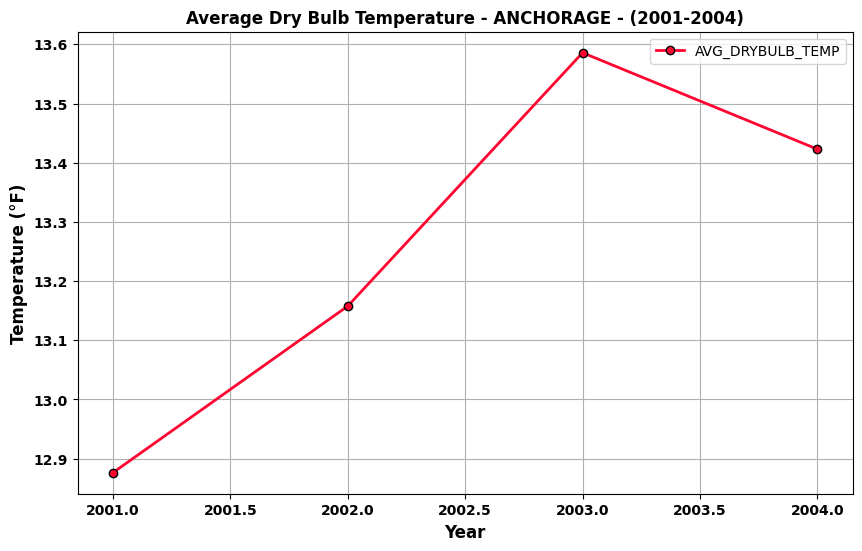

In [559]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - ANCHORAGE - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

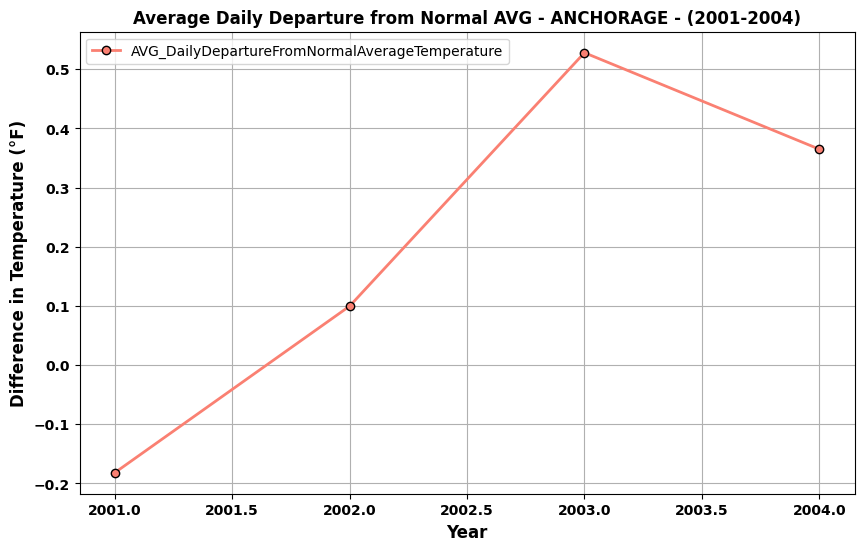

In [560]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - ANCHORAGE - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

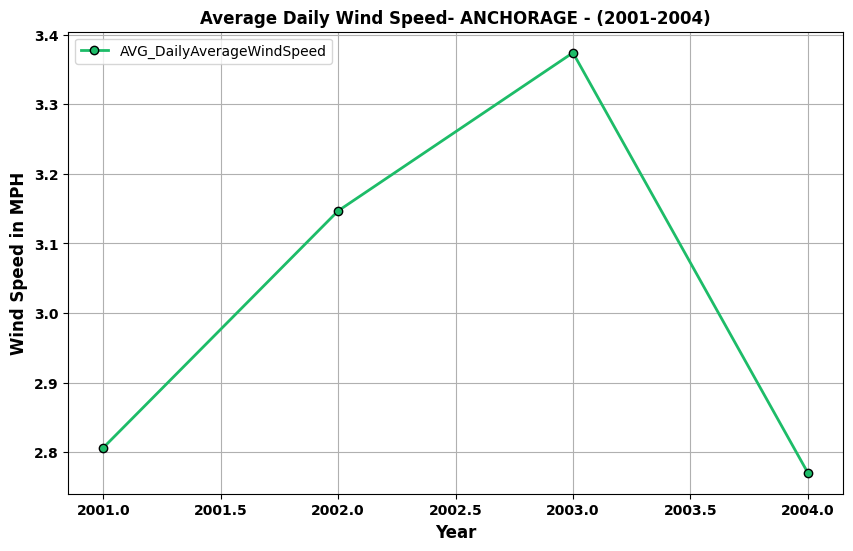

In [561]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- ANCHORAGE - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

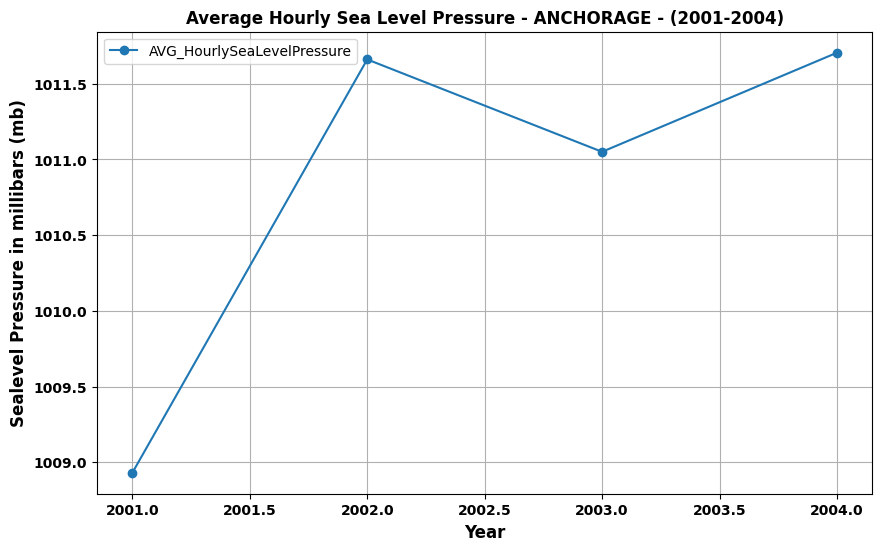

In [562]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - ANCHORAGE - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

Combine the Alaska economy years all together like the AVG Metrics

In [563]:
# Add the 'Year' column to each DataFrame
Anchorage_2001_AVG_Metrics['Year'] = 2001
Anchorage_2002_AVG_Metrics['Year'] = 2002
Anchorage_2003_AVG_Metrics['Year'] = 2003
Anchorage_2004_AVG_Metrics['Year'] = 2004

In [564]:
# Combine them into one DataFrame
Anchorage_all_years_Economy_Metrics = pd.concat([AlaskaEconomy_copy_Anchorage_2001, AlaskaEconomy_copy_Anchorage_2002, 
                          AlaskaEconomy_copy_Anchorage_2003, AlaskaEconomy_copy_Anchorage_2004], ignore_index=True)

In [565]:
print(AlaskaEconomy_copy_Anchorage_2004)

    OBJECTID CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y WEATHER STATION NAME  YEAR
48       597     Anchorage      2004                 188722             121958            17804        10985         17734         48997                26441                   102499                    0.84                 8345                0.07            60698          61260              42133              26664            104657            109316            108596            104122              88639     43446                      NaN  4151574482       

In [566]:
print(Anchorage_all_years_Economy_Metrics)

   OBJECTID CommunityName  DataYear  ResidentsAge16AndOver  ResidentsEmployed  WagesLessThan5k  Wages5k_10k  Wages10k_20k  Wages20k_50k  WagesGreaterThan50k  EmployedInPrivateSector  PercentInPrivateSector  EmployedInStateGovt  PercentInStateGovt  EmployedFemales  EmployedMales  EmployedAge45Plus  EmployedAge50Plus  EmployedIn1stQtr  EmployedIn2ndQtr  EmployedIn3rdQtr  EmployedIn4thQtr  EmployedInAllQtrs  NewHires  LocalLaborMarketInfoURL  TotalWages  UnemploymentInsuranceClaimants           x          y WEATHER STATION NAME  YEAR
0       594     Anchorage      2001                 181613             118312            19086        11037         18498         47595                22103                    99809                    0.84                 8089                0.07            58195          60116              36886              21959            101678            105374            104820            100040              84803     48658                      NaN  3721084534         

In [567]:
Anchorage_all_years_Economy_Metrics.dtypes

OBJECTID                            int64
CommunityName                      object
DataYear                            int64
ResidentsAge16AndOver               int64
ResidentsEmployed                   int64
WagesLessThan5k                     int64
Wages5k_10k                         int64
Wages10k_20k                        int64
Wages20k_50k                        int64
WagesGreaterThan50k                 int64
EmployedInPrivateSector             int64
PercentInPrivateSector            float64
EmployedInStateGovt                 int64
PercentInStateGovt                float64
EmployedFemales                     int64
EmployedMales                       int64
EmployedAge45Plus                   int64
EmployedAge50Plus                   int64
EmployedIn1stQtr                    int64
EmployedIn2ndQtr                    int64
EmployedIn3rdQtr                    int64
EmployedIn4thQtr                    int64
EmployedInAllQtrs                   int64
NewHires                          

##### Anchorage_all_years_Economy_Metrics GRAPHS

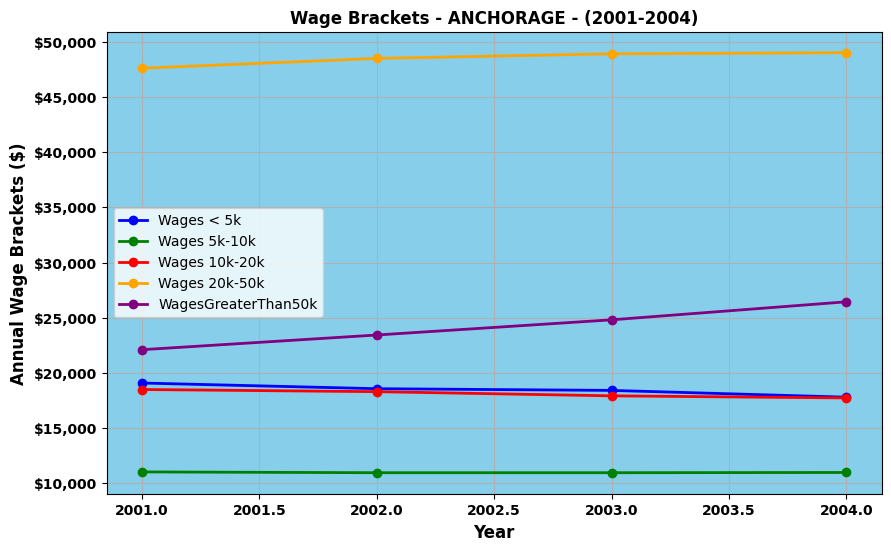

In [568]:
import matplotlib.pyplot as plt

# Assuming your DataFrame is named df
# For this example, I'll focus on a few columns: 'ResidentsEmployed' and 'WagesLessThan5k'

# Grouping by YEAR and calculating the sum for each year for these variables
Anchorage_all_years_Economy_Metrics_grouped = Anchorage_all_years_Economy_Metrics.groupby('YEAR')[['ResidentsEmployed', 'WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k']].sum()

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Set the background color of the axes to light blue
ax = plt.gca()  # Get the current axes
ax.set_facecolor('#87CEEB')  # Set the facecolor to light blue (#87CEEB)

# Line plot for each variable
#plt.plot(Anchorage_all_years_Economy_Metrics_grouped.index, Anchorage_all_years_Economy_Metrics_grouped['ResidentsEmployed'], marker='o', label='Residents Employed', color='orange', linewidth=2)
plt.plot(Anchorage_all_years_Economy_Metrics_grouped.index, Anchorage_all_years_Economy_Metrics_grouped['WagesLessThan5k'], marker='o', label='Wages < 5k', color='blue', linewidth=2)
plt.plot(Anchorage_all_years_Economy_Metrics_grouped.index, Anchorage_all_years_Economy_Metrics_grouped['Wages5k_10k'], marker='o', label='Wages 5k-10k', color='green', linewidth=2)
plt.plot(Anchorage_all_years_Economy_Metrics_grouped.index, Anchorage_all_years_Economy_Metrics_grouped['Wages10k_20k'], marker='o', label='Wages 10k-20k', color='red', linewidth=2)
plt.plot(Anchorage_all_years_Economy_Metrics_grouped.index, Anchorage_all_years_Economy_Metrics_grouped['Wages20k_50k'], marker='o', label='Wages 20k-50k', color='orange', linewidth=2)
plt.plot(Anchorage_all_years_Economy_Metrics_grouped.index, Anchorage_all_years_Economy_Metrics_grouped['WagesGreaterThan50k'], marker='o', label='WagesGreaterThan50k', color='purple', linewidth=2)

# Titles and labels
plt.title('Wage Brackets - ANCHORAGE - (2001-2004)',fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Annual Wage Brackets ($)', fontsize=12, fontweight='bold')  # Use 'Count' or change as per your variable
plt.xticks(fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')

# Legend
plt.legend()

# Format the y-axis with commas and dollar signs
def format_func(value, tick_position):
    return f'${value:,.0f}'  # Adds dollar sign and comma for thousands

plt.gca().yaxis.set_major_formatter(FuncFormatter(format_func))

# Show the plot
plt.grid(True)
plt.show()

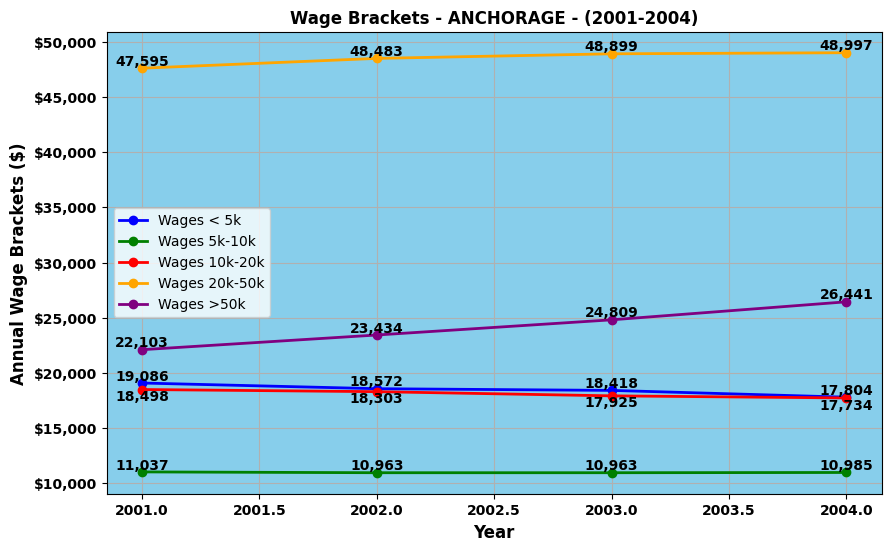

In [569]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Grouping by YEAR and calculating the sum for each year for these variables
Anchorage_all_years_Economy_Metrics_grouped = Anchorage_all_years_Economy_Metrics.groupby('YEAR')[['ResidentsEmployed', 'WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k']].sum()

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Set the background color of the axes to light blue
ax = plt.gca()  # Get the current axes
ax.set_facecolor('#87CEEB')  # Set the facecolor to light blue (#87CEEB)

# List of variables to plot
variables = ['WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k']
colors = ['blue', 'green', 'red', 'orange', 'purple']
labels = ['Wages < 5k', 'Wages 5k-10k', 'Wages 10k-20k', 'Wages 20k-50k', 'Wages >50k']

# Loop through the variables and plot each one
for var, color, label in zip(variables, colors, labels):
    plt.plot(Anchorage_all_years_Economy_Metrics_grouped.index, 
             Anchorage_all_years_Economy_Metrics_grouped[var], 
             marker='o', 
             label=label, 
             color=color, 
             linewidth=2)
    
    # Add count labels to each point on the line
    for i, value in enumerate(Anchorage_all_years_Economy_Metrics_grouped[var]):
        formatted_value = f'{value:,.0f}'  # Format value with commas for thousands
        
        # Determine label position based on line color
        if color == 'blue':  # For the blue line, place the label above
            va_position = 'bottom'
            offset = 0  # No offset for blue
        elif color == 'red':  # For the red line, place the label below
            va_position = 'top'
            offset = 0  # No offset for red
        else:
            va_position = 'bottom'  # Default position for other lines
            offset = 0
        
        # Place the text above or below based on the condition
        plt.text(Anchorage_all_years_Economy_Metrics_grouped.index[i], 
                 value + offset, 
                 formatted_value, 
                 color='black', 
                 ha='center', 
                 va=va_position,  # Top or Bottom based on color
                 fontsize=10, 
                 fontweight='bold')  # Make the text bold

# Titles and labels
plt.title('Wage Brackets - ANCHORAGE - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Annual Wage Brackets ($)', fontsize=12, fontweight='bold')  # Adjust label to match context
plt.xticks(fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')

# Legend
plt.legend()

# Format the y-axis with commas and dollar signs
def format_func(value, tick_position):
    return f'${value:,.0f}'  # Adds dollar sign and comma for thousands

plt.gca().yaxis.set_major_formatter(FuncFormatter(format_func))

# Show the plot
plt.grid(True)
plt.show()


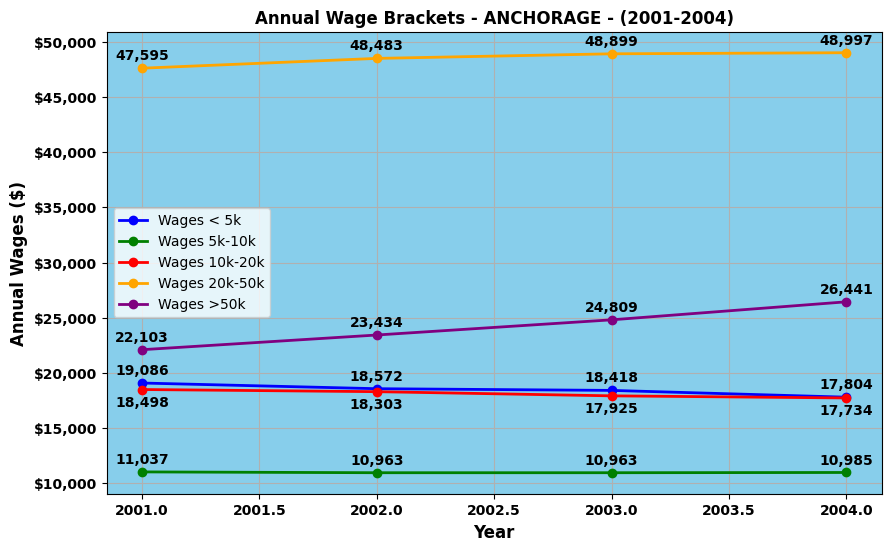

In [570]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Grouping by YEAR and calculating the sum for each year for these variables
Anchorage_all_years_Economy_Metrics_grouped = Anchorage_all_years_Economy_Metrics.groupby('YEAR')[['ResidentsEmployed', 'WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k']].sum()

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Set the background color of the axes to light blue
ax = plt.gca()  # Get the current axes
ax.set_facecolor('#87CEEB')  # Set the facecolor to light blue (#87CEEB)

# List of variables to plot
variables = ['WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k']
colors = ['blue', 'green', 'red', 'orange', 'purple']
labels = ['Wages < 5k', 'Wages 5k-10k', 'Wages 10k-20k', 'Wages 20k-50k', 'Wages >50k']

# Loop through the variables and plot each one
for var, color, label in zip(variables, colors, labels):
    plt.plot(Anchorage_all_years_Economy_Metrics_grouped.index, 
             Anchorage_all_years_Economy_Metrics_grouped[var], 
             marker='o', 
             label=label, 
             color=color, 
             linewidth=2)
    
    # Add count labels to each point on the line
    for i, value in enumerate(Anchorage_all_years_Economy_Metrics_grouped[var]):
        formatted_value = f'{value:,.0f}'  # Format value with commas for thousands
        
        # Determine label position based on line color
        if color == 'blue':  # For the blue line, place the label above
            va_position = 'bottom'
            offset = 500  # Add a small offset for blue
        elif color == 'red':  # For the red line, place the label below
            va_position = 'top'
            offset = -500  # Add a small offset for red
        else:
            va_position = 'bottom'  # Default position for other lines
            offset = 500  # Add a small offset for other lines
        
        # Place the text above or below based on the condition
        plt.text(Anchorage_all_years_Economy_Metrics_grouped.index[i], 
                 value + offset, 
                 formatted_value, 
                 color='black', 
                 ha='center', 
                 va=va_position,  # Top or Bottom based on color
                 fontsize=10, 
                 fontweight='bold')  # Make the text bold

# Titles and labels
plt.title('Annual Wage Brackets - ANCHORAGE - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Annual Wages ($)', fontsize=12, fontweight='bold')  # Adjust label to match context
plt.xticks(fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')

# Legend
plt.legend()

# Format the y-axis with commas and dollar signs
def format_func(value, tick_position):
    return f'${value:,.0f}'  # Adds dollar sign and comma for thousands

plt.gca().yaxis.set_major_formatter(FuncFormatter(format_func))

# Show the plot
plt.grid(True)
plt.show()


#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - BARROW</span>

NameError: name 'Barrow_all_years_AVG_Metrics' is not defined

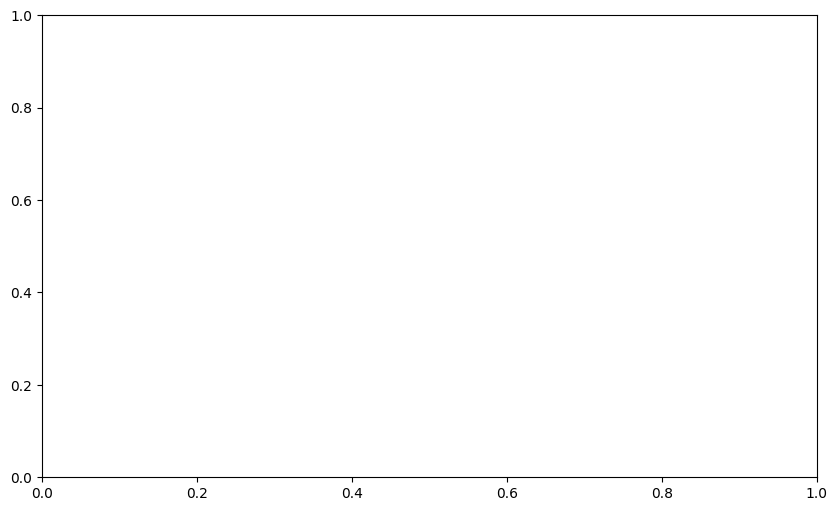

In [571]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(Barrow_all_years_AVG_Metrics['Year'], Barrow_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - BARROW - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

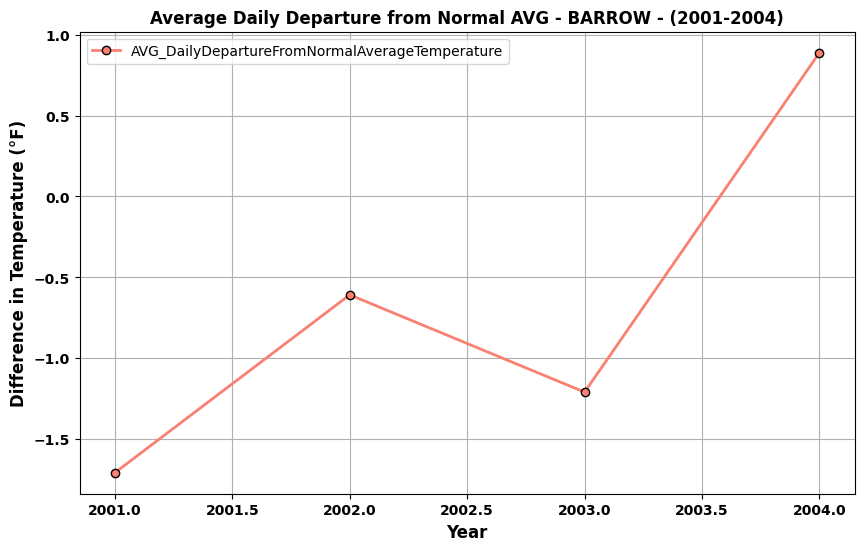

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(Barrow_all_years_AVG_Metrics['Year'], Barrow_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - BARROW - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

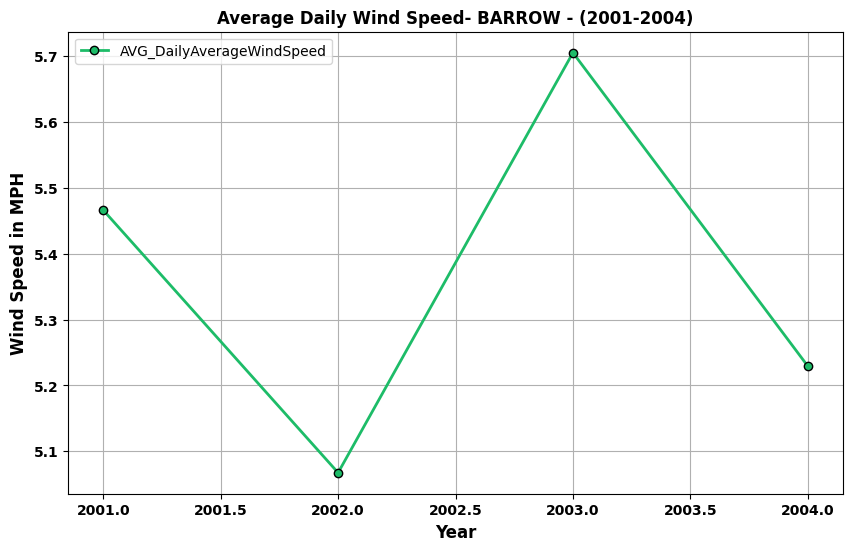

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(Barrow_all_years_AVG_Metrics['Year'], Barrow_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- BARROW - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

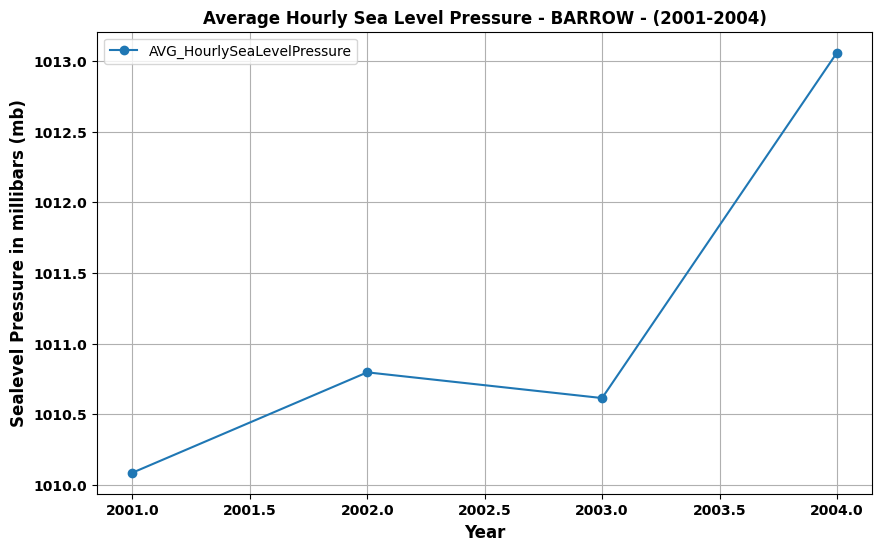

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(Barrow_all_years_AVG_Metrics['Year'], Barrow_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - BARROW - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - BETHEL</span>

NameError: name 'Bethel_all_years_AVG_Metrics' is not defined

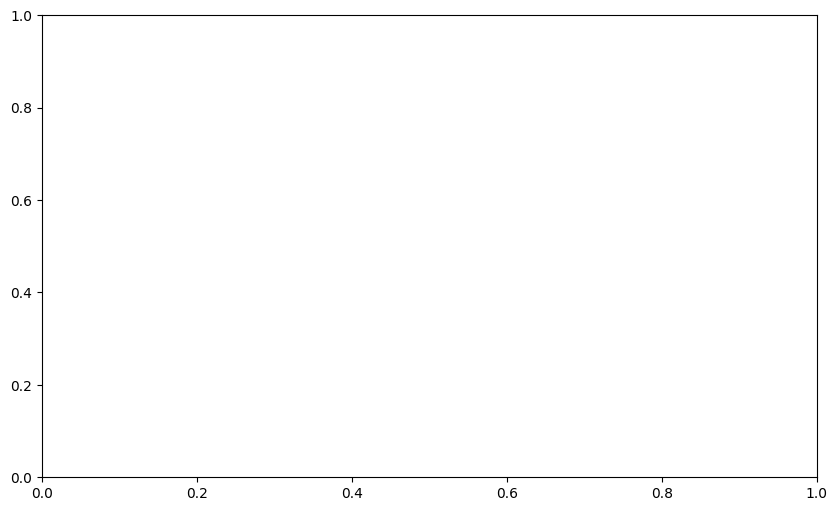

In [572]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(Bethel_all_years_AVG_Metrics['Year'], Bethel_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - BETHEL - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

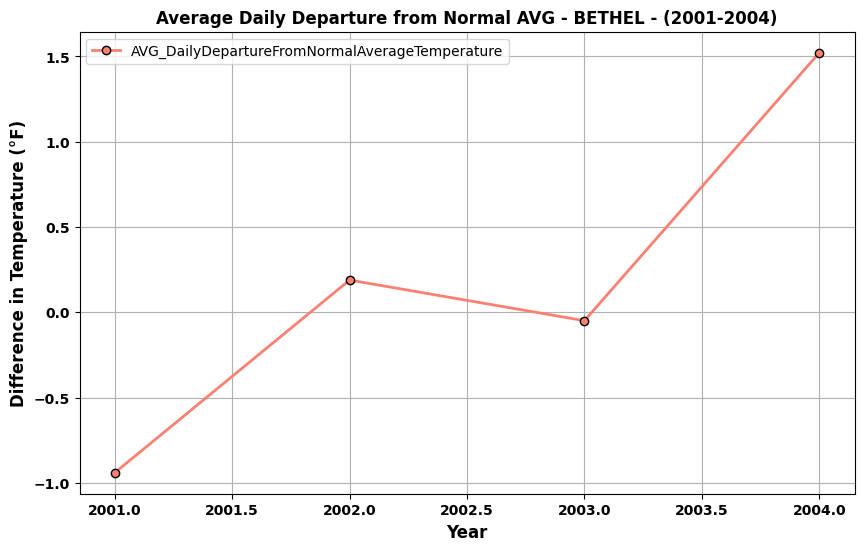

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(Bethel_all_years_AVG_Metrics['Year'], Bethel_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - BETHEL - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

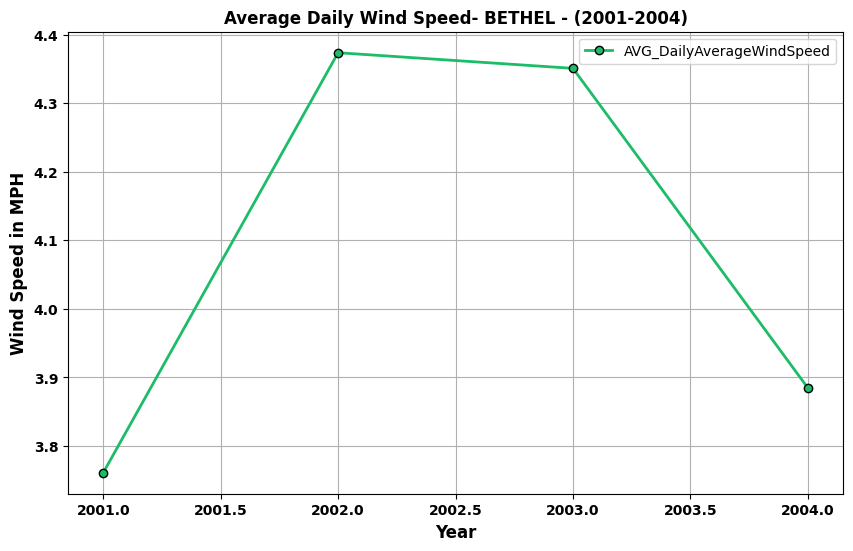

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(Bethel_all_years_AVG_Metrics['Year'], Bethel_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- BETHEL - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

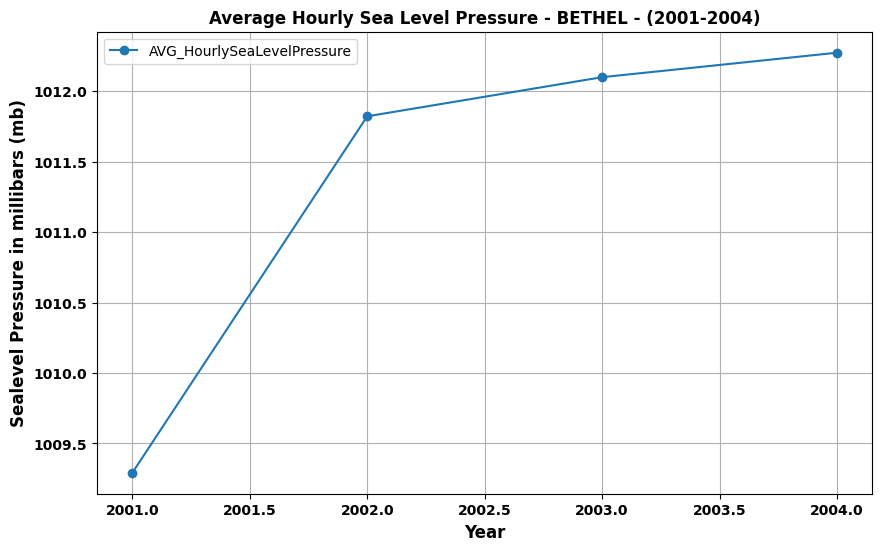

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(Bethel_all_years_AVG_Metrics['Year'], Bethel_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - BETHEL - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - FAIRBANKS</span>

NameError: name 'Fairbanks_all_years_AVG_Metrics' is not defined

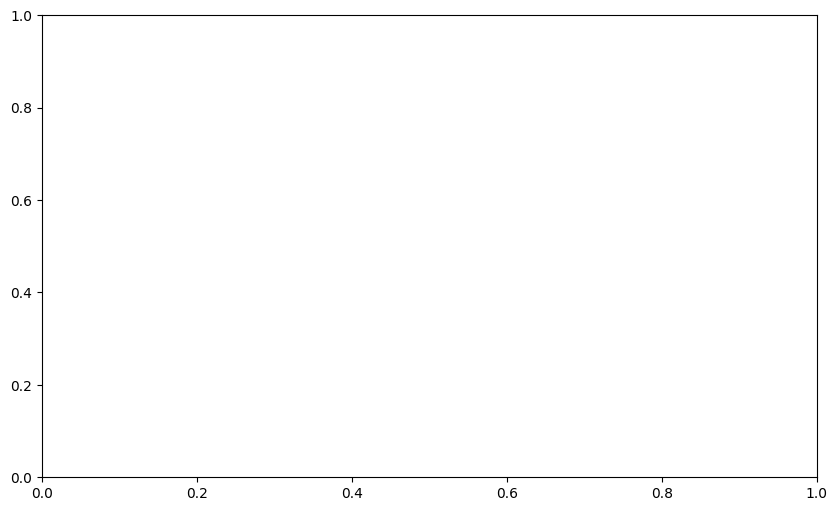

In [573]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(Fairbanks_all_years_AVG_Metrics['Year'], Fairbanks_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - FAIRBANKS - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

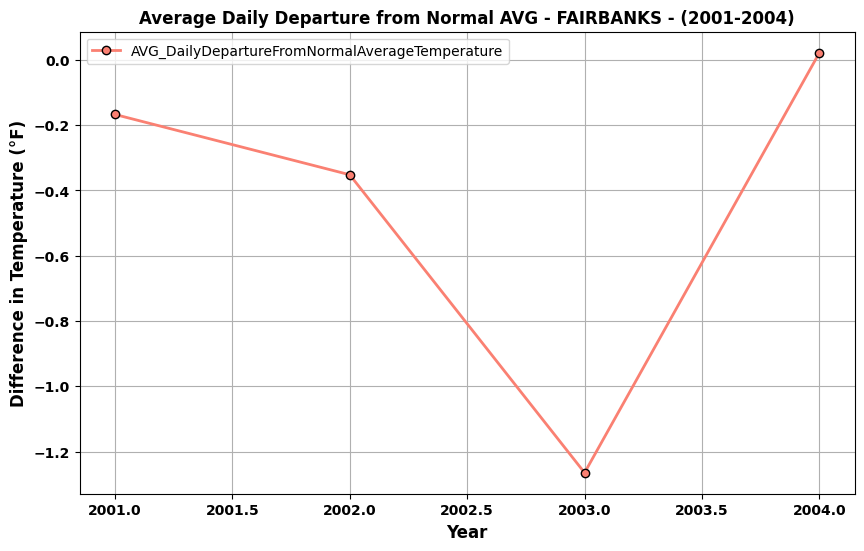

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(Fairbanks_all_years_AVG_Metrics['Year'], Fairbanks_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - FAIRBANKS - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

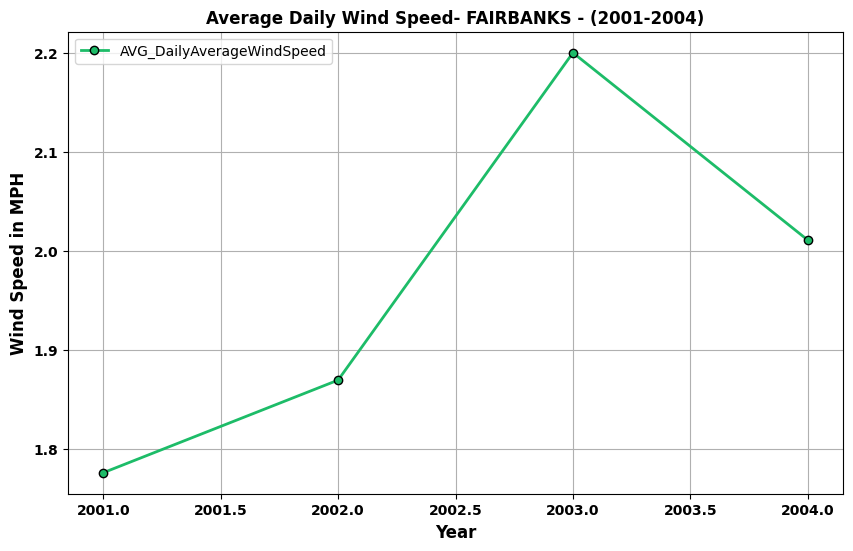

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(Fairbanks_all_years_AVG_Metrics['Year'], Fairbanks_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- FAIRBANKS - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

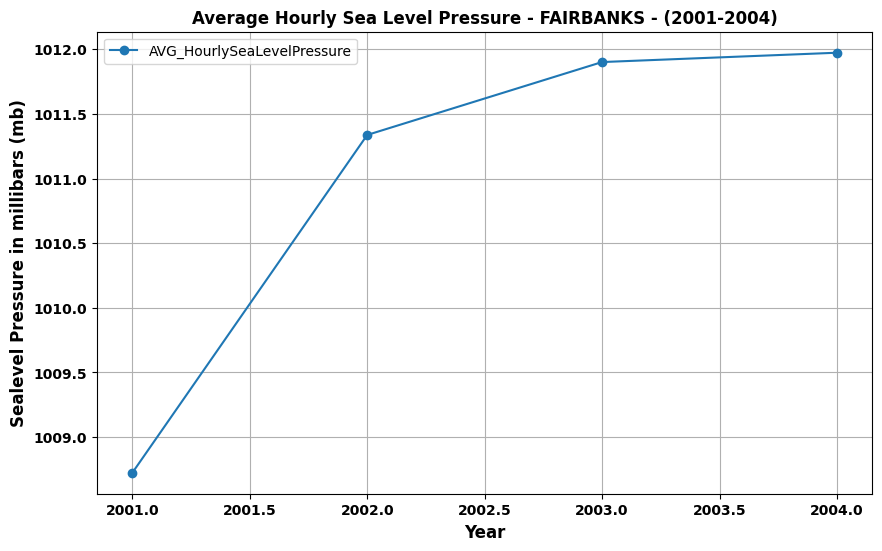

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(Fairbanks_all_years_AVG_Metrics['Year'], Fairbanks_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - FAIRBANKS - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - KING SALMON</span>

NameError: name 'KING_SALMON_all_years_AVG_Metrics' is not defined

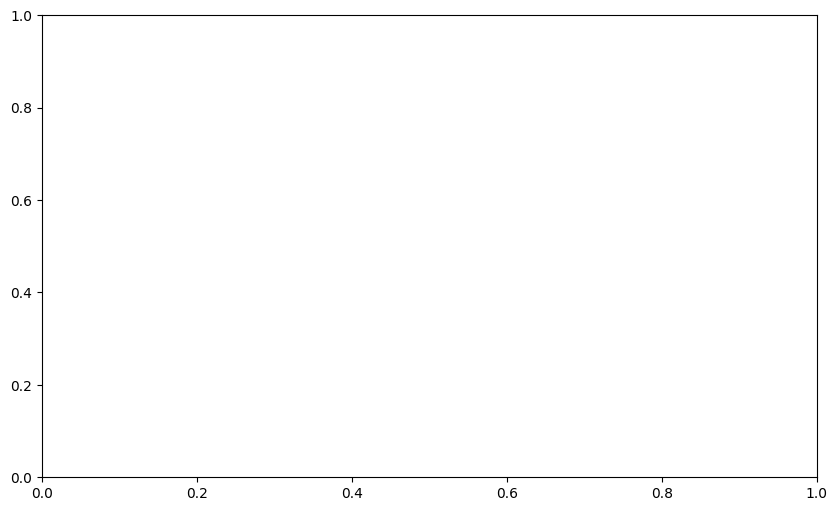

In [574]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(KING_SALMON_all_years_AVG_Metrics['Year'], KING_SALMON_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - KING SALMON - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

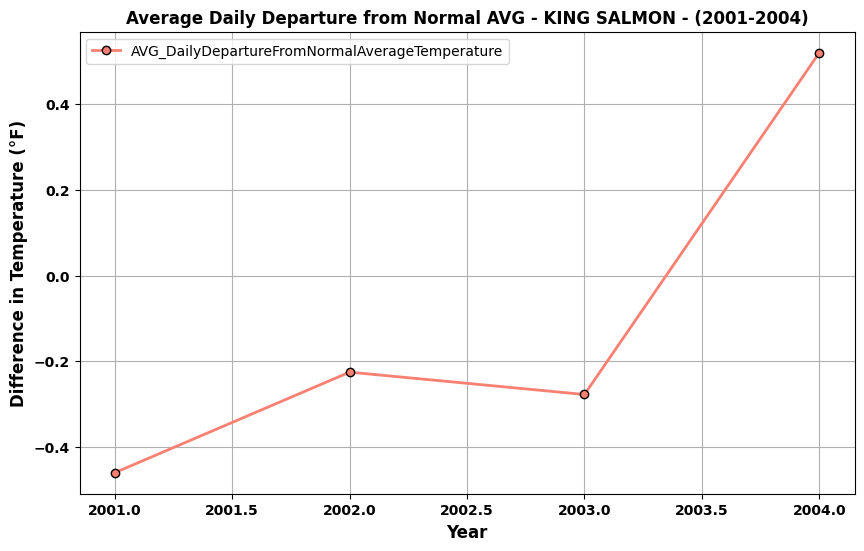

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(KING_SALMON_all_years_AVG_Metrics['Year'], KING_SALMON_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - KING SALMON - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

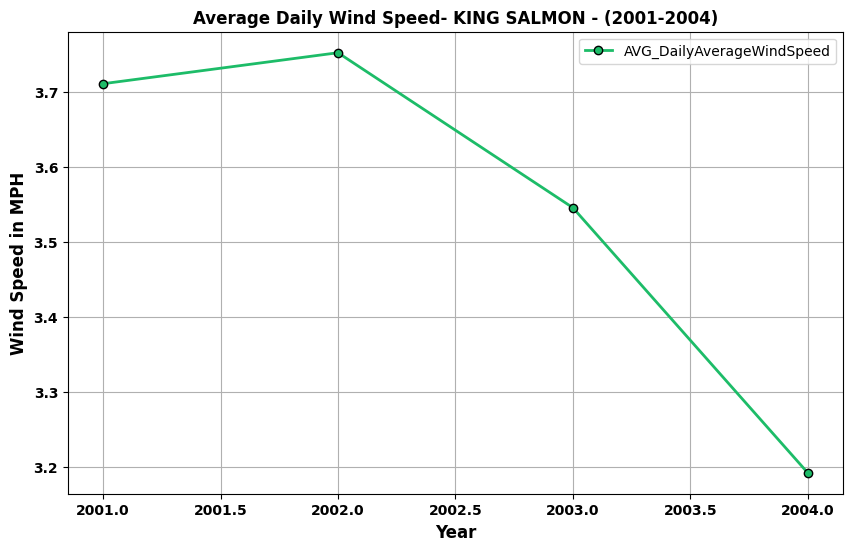

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(KING_SALMON_all_years_AVG_Metrics['Year'], KING_SALMON_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- KING SALMON - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

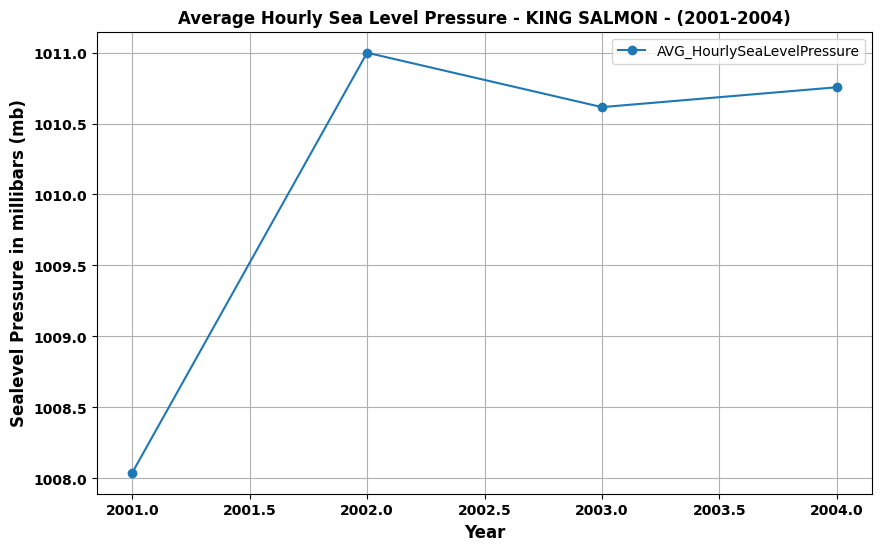

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(KING_SALMON_all_years_AVG_Metrics['Year'], KING_SALMON_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - KING SALMON - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - KODIAK</span>

NameError: name 'KODIAK_all_years_AVG_Metrics' is not defined

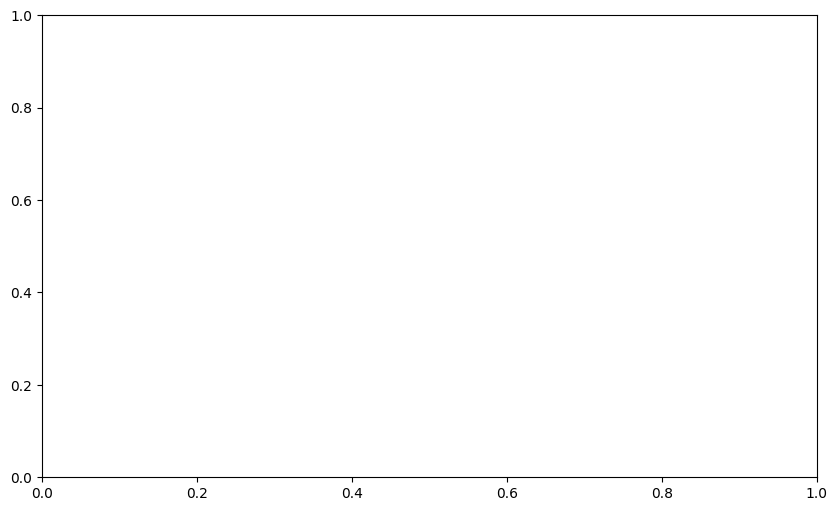

In [575]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(KODIAK_all_years_AVG_Metrics['Year'], KODIAK_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - KODIAK - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

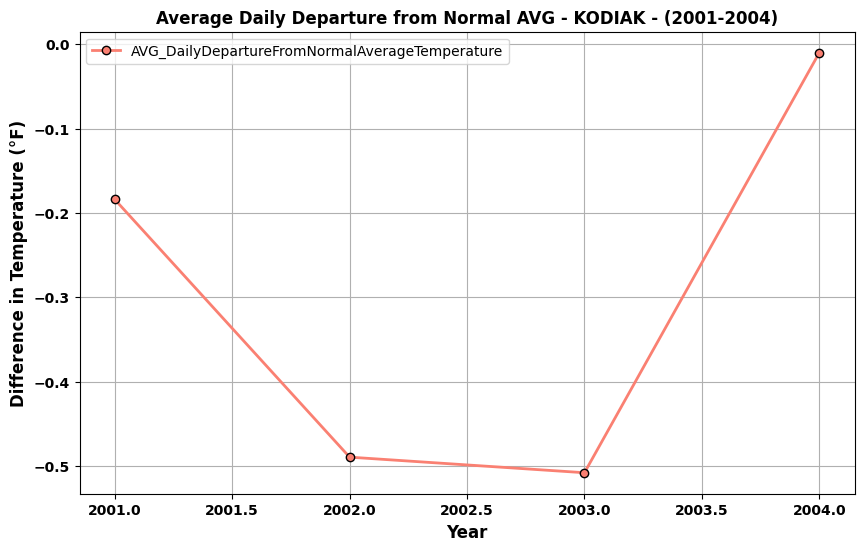

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(KODIAK_all_years_AVG_Metrics['Year'], KODIAK_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - KODIAK - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

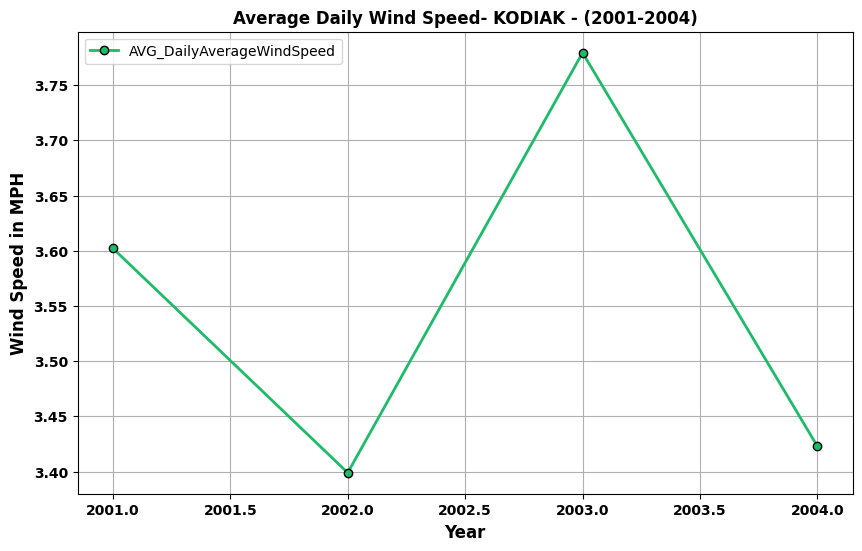

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(KODIAK_all_years_AVG_Metrics['Year'], KODIAK_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- KODIAK - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

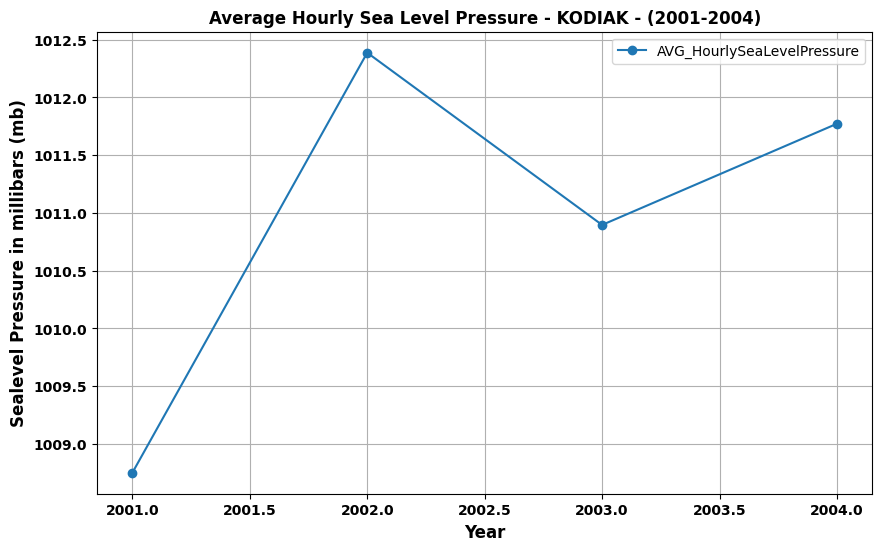

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(KODIAK_all_years_AVG_Metrics['Year'], KODIAK_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - KODIAK - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - MCGRATH</span>

NameError: name 'MCGRATH_all_years_AVG_Metrics' is not defined

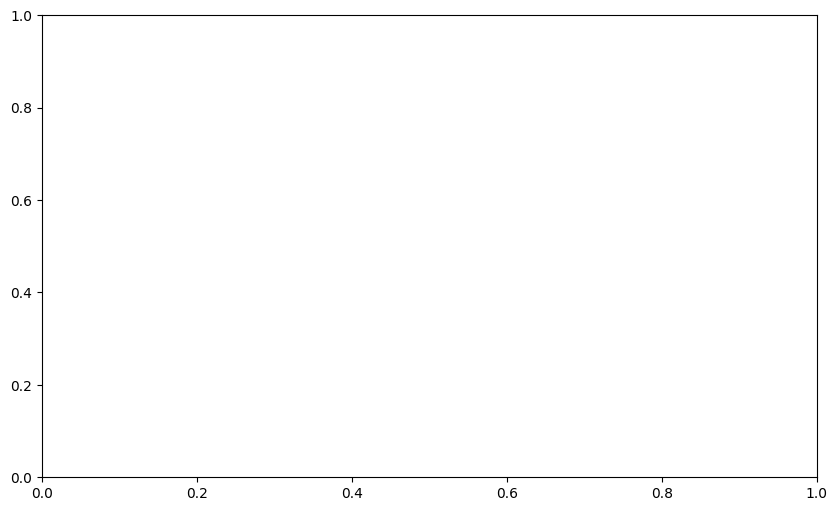

In [576]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(MCGRATH_all_years_AVG_Metrics['Year'], MCGRATH_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - MCGRATH - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

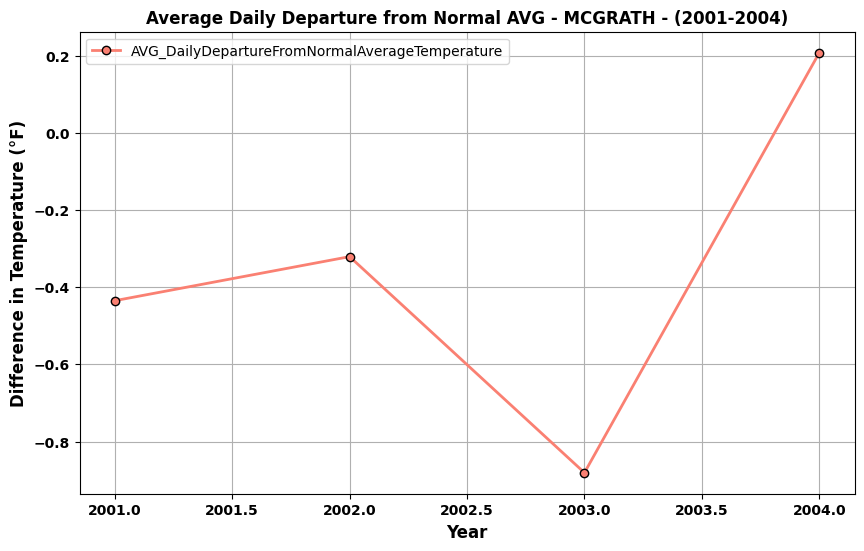

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(MCGRATH_all_years_AVG_Metrics['Year'], MCGRATH_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - MCGRATH - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

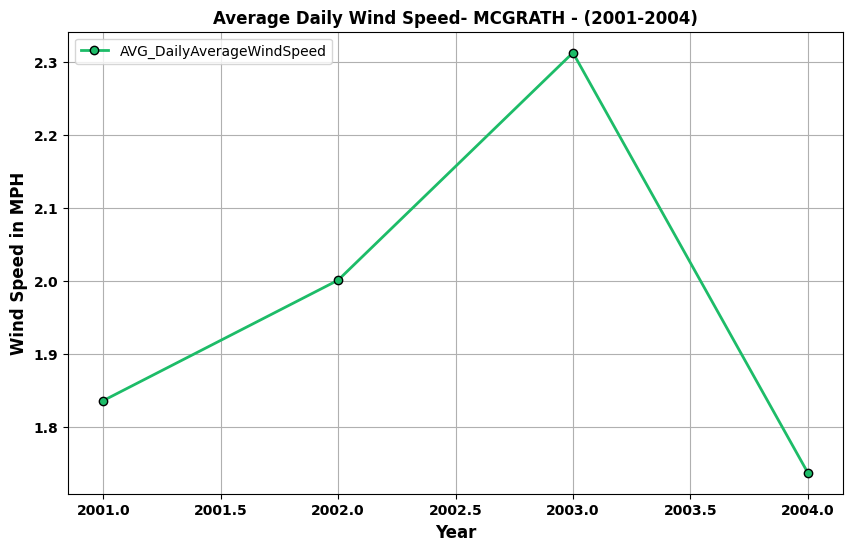

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(MCGRATH_all_years_AVG_Metrics['Year'], MCGRATH_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- MCGRATH - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

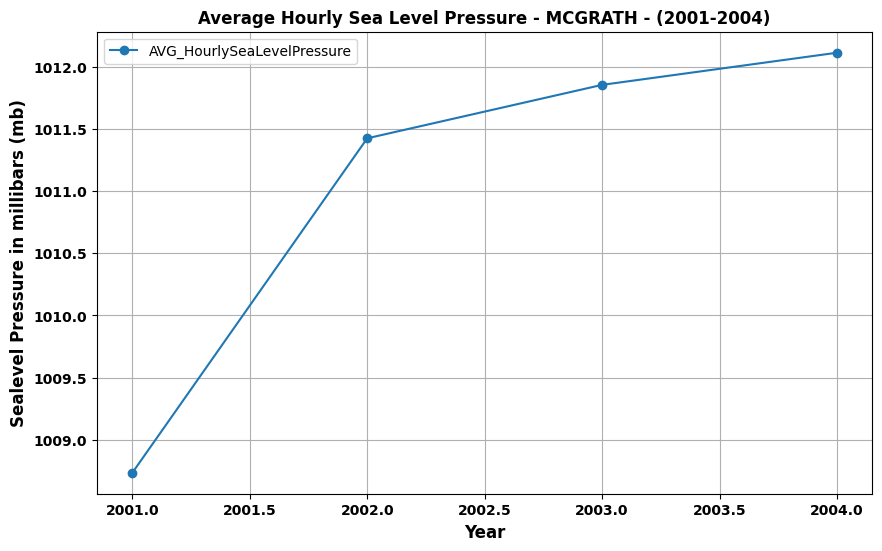

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(MCGRATH_all_years_AVG_Metrics['Year'], MCGRATH_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - MCGRATH - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - NOME</span>

NameError: name 'NOME_all_years_AVG_Metrics' is not defined

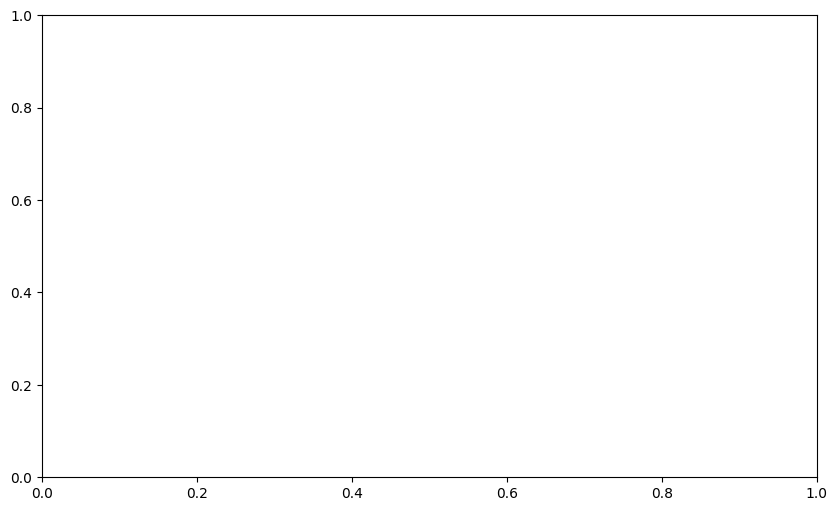

In [577]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(NOME_all_years_AVG_Metrics['Year'], NOME_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - NOME - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

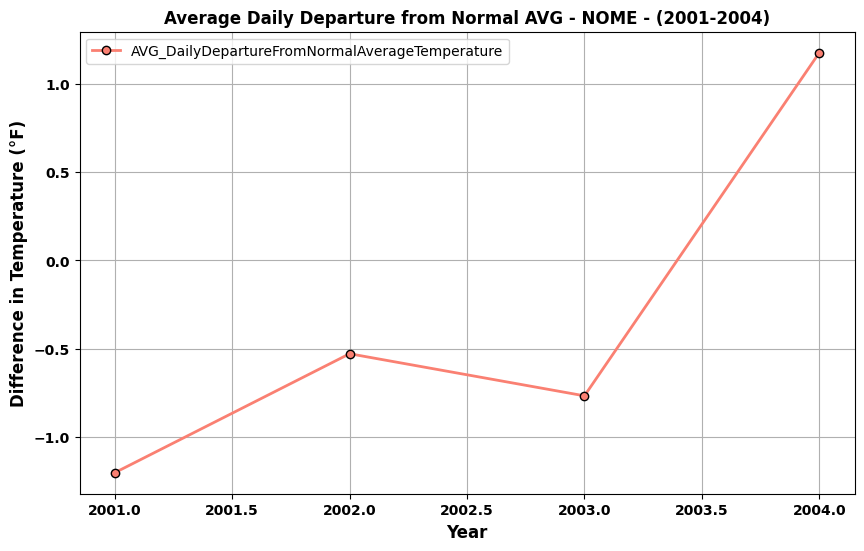

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(NOME_all_years_AVG_Metrics['Year'], NOME_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - NOME - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

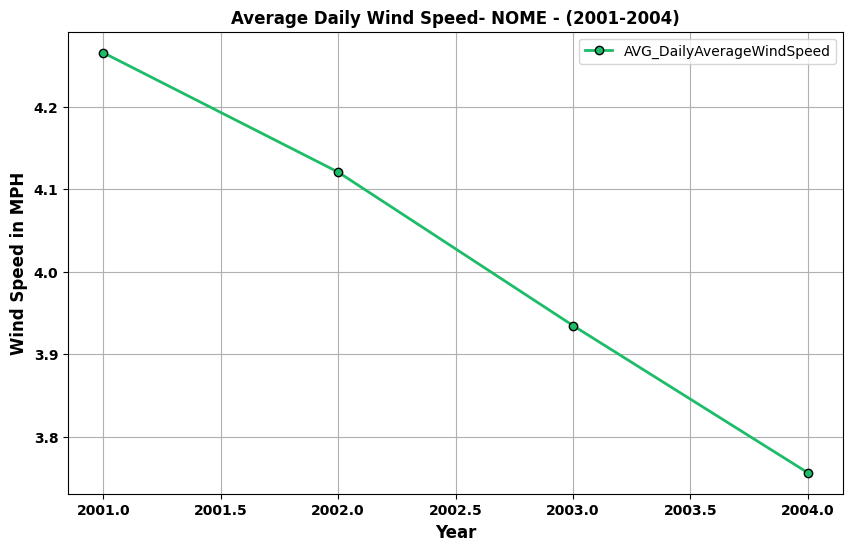

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(NOME_all_years_AVG_Metrics['Year'], NOME_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- NOME - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

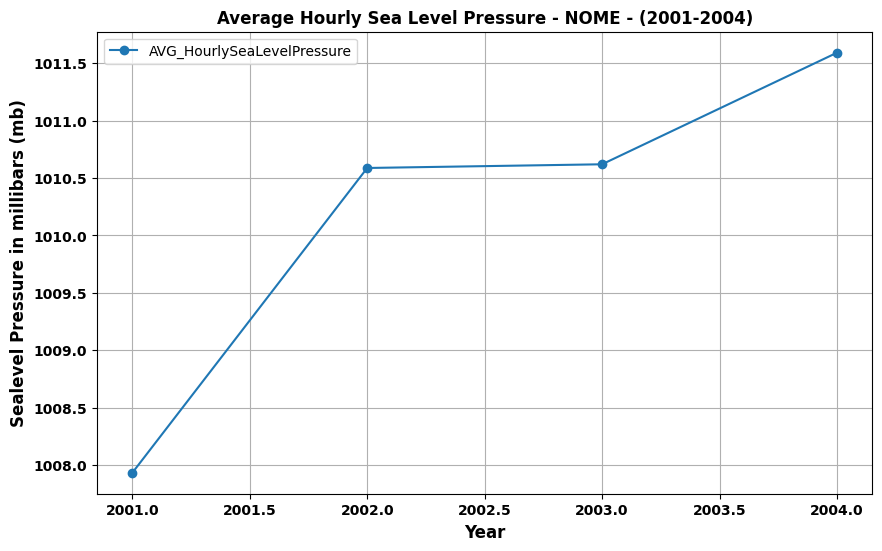

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(NOME_all_years_AVG_Metrics['Year'], NOME_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - NOME - (2001-2004)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

#### <span style="color:#ff0000">OVER THE YEARS METRICS GRAPHS - YAKUTAT</span>

NameError: name 'YAKUTAT_all_years_AVG_Metrics' is not defined

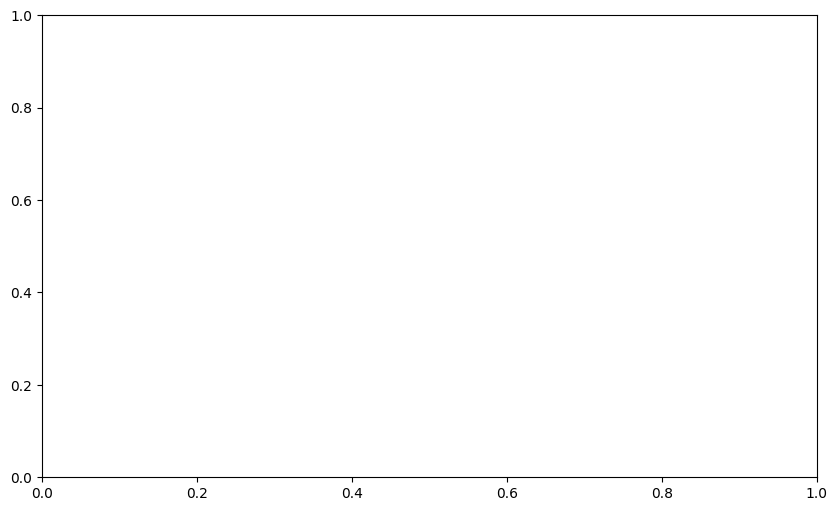

In [578]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

ax = plt.gca()

# Line plot for each variable
plt.plot(YAKUTAT_all_years_AVG_Metrics['Year'], YAKUTAT_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', color='#ff0430', markeredgecolor = 'black' ,linewidth = 2, label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Dry Bulb Temperature - YAKUTAT - (2001-2003)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

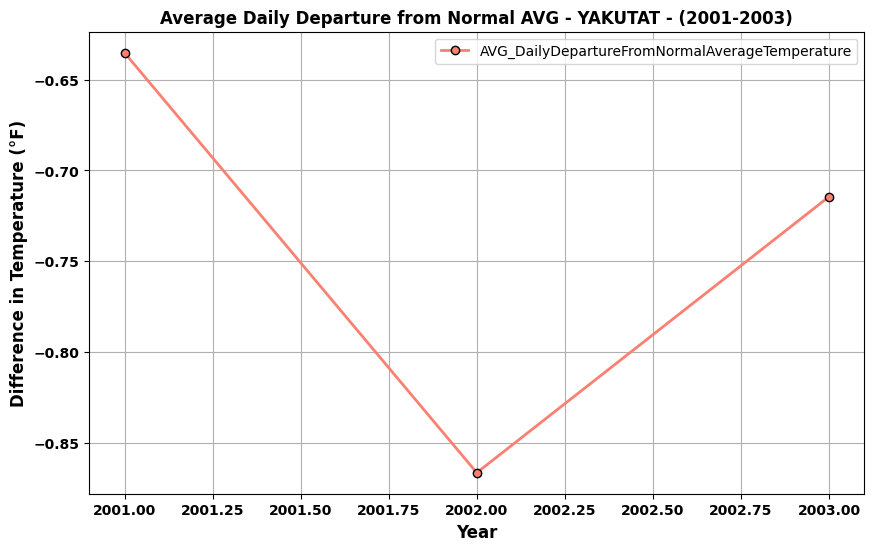

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
plt.plot(YAKUTAT_all_years_AVG_Metrics['Year'], YAKUTAT_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', color='#FA8072', markeredgecolor = 'black' ,linewidth = 2,  label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')


# Titles and labels
plt.title('Average Daily Departure from Normal AVG - YAKUTAT - (2001-2003)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Difference in Temperature (°F)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

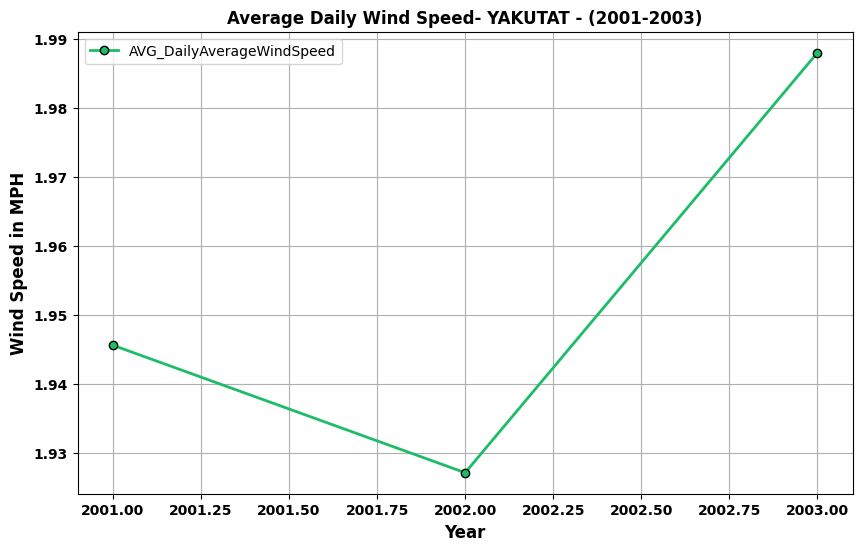

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
plt.plot(YAKUTAT_all_years_AVG_Metrics['Year'], YAKUTAT_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o',  color='#1DBC68', markeredgecolor = 'black' ,linewidth = 2,   label='AVG_DailyAverageWindSpeed')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Daily Wind Speed- YAKUTAT - (2001-2003)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Wind Speed in MPH', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

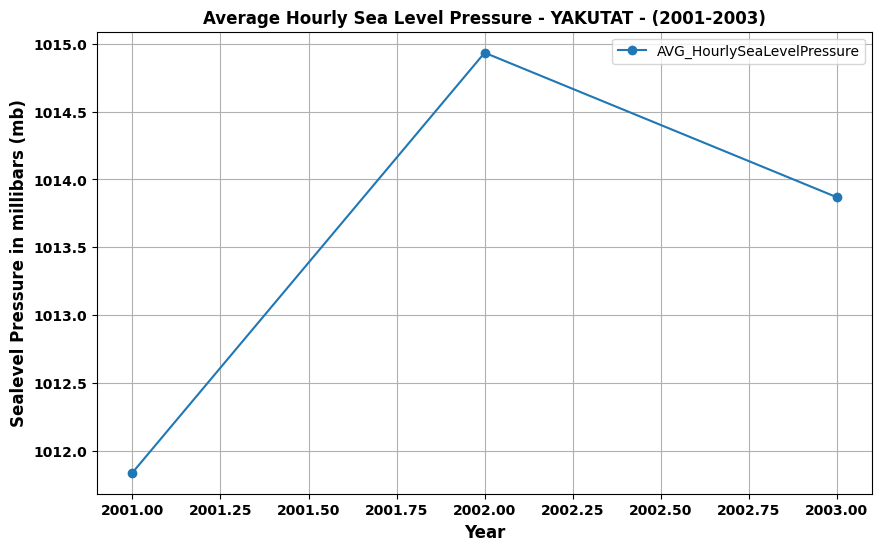

In [ ]:
import matplotlib.pyplot as plt

# Plotting each variable over the years
plt.figure(figsize=(10, 6))

# Line plot for each variable
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DRYBULB_TEMP'], marker='o', label='AVG_DRYBULB_TEMP')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyDepartureFromNormalAverageTemperature'], marker='o', label='AVG_DailyDepartureFromNormalAverageTemperature')
#plt.plot(Anchorage_all_years_AVG_Metrics['Year'], Anchorage_all_years_AVG_Metrics['AVG_DailyAverageWindSpeed'], marker='o', label='AVG_DailyAverageWindSpeed')
plt.plot(YAKUTAT_all_years_AVG_Metrics['Year'], YAKUTAT_all_years_AVG_Metrics['AVG_HourlySeaLevelPressure'], marker='o', label='AVG_HourlySeaLevelPressure')

# Titles and labels
plt.title('Average Hourly Sea Level Pressure - YAKUTAT - (2001-2003)', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Sealevel Pressure in millibars (mb)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

## <span style="color:#ff0000">03302025 poster graphs</span>

In [579]:
AlaskaEconomy_Wages = AlaskaEconomy
AlaskaEconomy_Wages1 = AlaskaEconomy

In [580]:
AlaskaEconomy_Wages.dtypes

OBJECTID                            int64
CommunityName                      object
DataYear                            int64
ResidentsAge16AndOver               int64
ResidentsEmployed                   int64
WagesLessThan5k                     int64
Wages5k_10k                         int64
Wages10k_20k                        int64
Wages20k_50k                        int64
WagesGreaterThan50k                 int64
EmployedInPrivateSector             int64
PercentInPrivateSector            float64
EmployedInStateGovt                 int64
PercentInStateGovt                float64
EmployedFemales                     int64
EmployedMales                       int64
EmployedAge45Plus                   int64
EmployedAge50Plus                   int64
EmployedIn1stQtr                    int64
EmployedIn2ndQtr                    int64
EmployedIn3rdQtr                    int64
EmployedIn4thQtr                    int64
EmployedInAllQtrs                   int64
NewHires                          

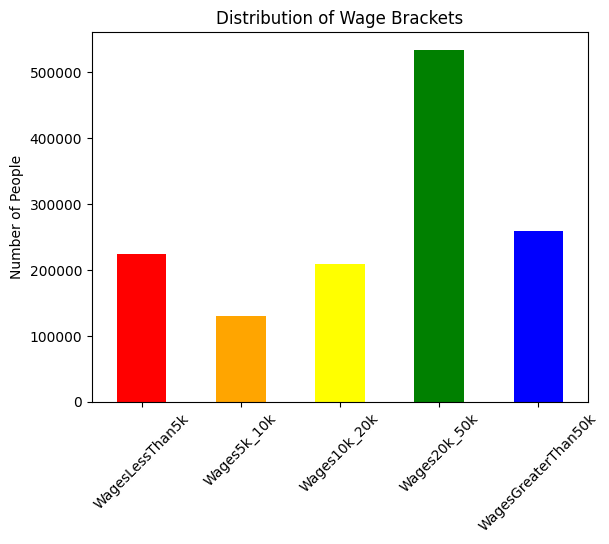

In [581]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

AlaskaEconomy_Wages1 = AlaskaEconomy_Wages[['WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k']]

AlaskaEconomy_Wages1.sum().plot(kind='bar', color=['red', 'orange', 'yellow', 'green', 'blue'])
plt.title("Distribution of Wage Brackets")
plt.ylabel("Number of People")
plt.xticks(rotation=45)
plt.show()


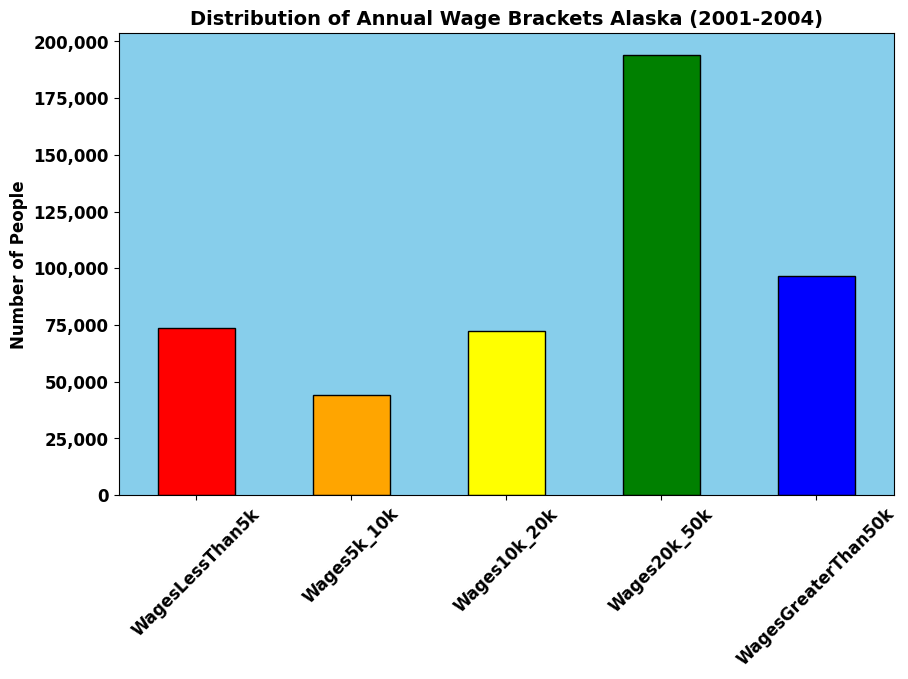

In [582]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# Sum the wage data and plot
AlaskaEconomy_Wages_Anchorage1 = AlaskaEconomy_copy_Anchorage[['WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k']]

# Plot the bar chart
ax = AlaskaEconomy_Wages_Anchorage1.sum().plot(kind='bar', 
                                               color=['red', 'orange', 'yellow', 'green', 'blue'],
                                               edgecolor='black',  # Same outline for all bars
                                               figsize=(10, 6))


# Set background color
ax.set_facecolor('#87CEEB')  # Light gray background

# Title and labels
plt.title("Distribution of Annual Wage Brackets Alaska (2001-2004)", fontsize=14, fontweight='bold')
plt.ylabel("Number of People", fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')


# Format the y-axis with commas and dollar signs
def format_func(value, tick_position):
    return f'{value:,.0f}'  # Adds dollar sign and comma for thousands

plt.gca().yaxis.set_major_formatter(FuncFormatter(format_func))

# Show the plot
plt.show()

Anchorage Graphs

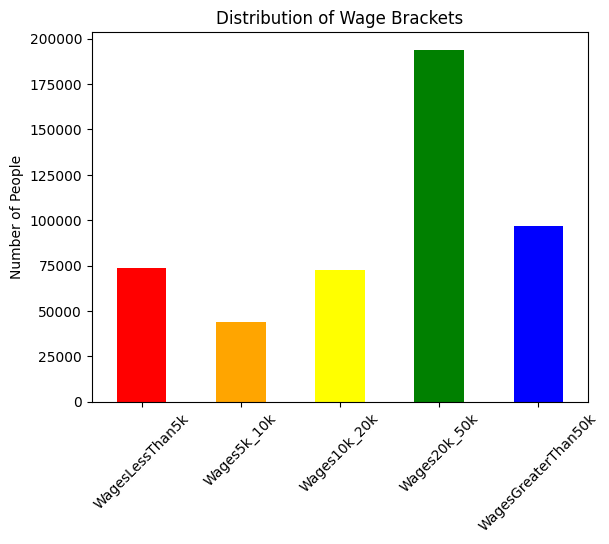

In [583]:
# AlaskaEconomy_Wages_Anchorage = AlaskaEconomy_copy_Anchorage

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

AlaskaEconomy_Wages_Anchorage1 = AlaskaEconomy_copy_Anchorage[['WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k']]

AlaskaEconomy_Wages_Anchorage1.sum().plot(kind='bar', color=['red', 'orange', 'yellow', 'green', 'blue'])
plt.title("Distribution of Wage Brackets")
plt.ylabel("Number of People")
plt.xticks(rotation=45)
plt.show()

In [584]:
print(AlaskaEconomy_Wages1.columns)

Index(['WagesLessThan5k', 'Wages5k_10k', 'Wages10k_20k', 'Wages20k_50k', 'WagesGreaterThan50k'], dtype='object')


Can plug in whatever variable for the x,y 

In [585]:
# 7. Box Plot: Distribution of Wages across Communities
plt.figure(figsize=(12, 6))
sns.boxplot(data=AlaskaEconomy_Wages1, x='CommunityName', y='ResidentsEmployed')
plt.xticks(rotation=90)
plt.title("Total Wages Distribution Across Communities")
plt.show()

ValueError: Could not interpret value `CommunityName` for `x`. An entry with this name does not appear in `data`.

<Figure size 1200x600 with 0 Axes>

In [ ]:
AlaskaEconomy_Wages1.dtypes

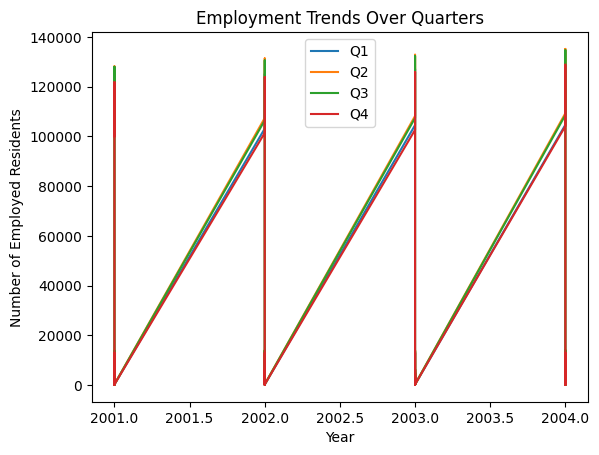

In [ ]:
# 4. Line Plot: Employment trends over time
plt.plot(AlaskaEconomy_Wages1['DataYear'], AlaskaEconomy_Wages1['EmployedIn1stQtr'], label="Q1")
plt.plot(AlaskaEconomy_Wages1['DataYear'], AlaskaEconomy_Wages1['EmployedIn2ndQtr'], label="Q2")
plt.plot(AlaskaEconomy_Wages1['DataYear'], AlaskaEconomy_Wages1['EmployedIn3rdQtr'], label="Q3")
plt.plot(AlaskaEconomy_Wages1['DataYear'], AlaskaEconomy_Wages1['EmployedIn4thQtr'], label="Q4")
plt.xlabel("Year")
plt.ylabel("Number of Employed Residents")
plt.title("Employment Trends Over Quarters")
plt.legend()
plt.show()

## <span style="color:#FA8072;">2025-04-13 - Finish the other Dashboards</span>

Add the other 9 weather stations

# 2025-04-22 

In [586]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [587]:
salmon.dtypes

year                     int64
transect                object
sta_id                  object
haul_id                  int64
month_local              int64
day_local                int64
yrday_local              int64
latitude               float64
longitude              float64
depth_w_meters          object
species_common_name     object
length_frozen_cm        object
length_wet_cm           object
weight_froz_grams       object
weight_wet_grams        object
sex                     object
maturity                object
stomwt_full             object
stomwt_empty            object
sealice                 object
comments                object
dtype: object

## Count for each species

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1322187967.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



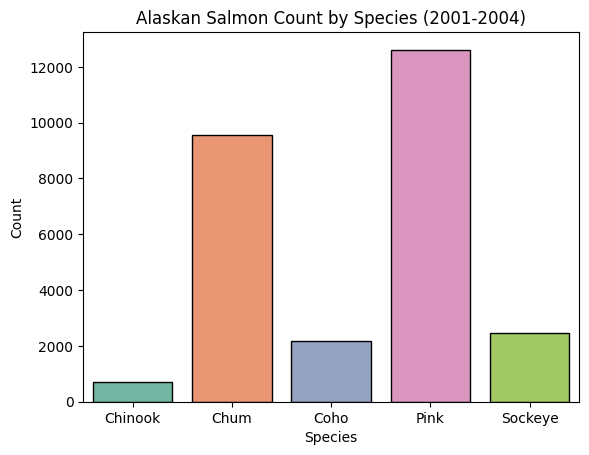

In [588]:
sns.countplot(data=salmon, x='species_common_name', palette='Set2', edgecolor='black')
plt.title('Alaskan Salmon Count by Species (2001-2004)')
plt.xlabel('Species')
plt.ylabel('Count')
plt.show()

## Box plot: Wet length by species
need to clean up the y axis label and what is going on with the pink species x axis line as well

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\890377912.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



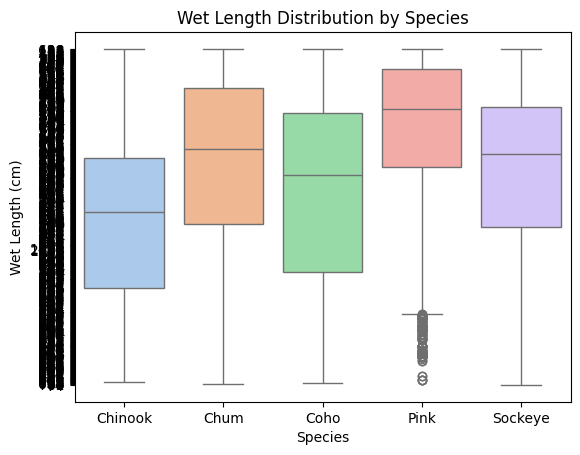

In [589]:
sns.boxplot(data=salmon, x='species_common_name', y='length_wet_cm', palette='pastel')
plt.title('Wet Length Distribution by Species')
plt.xlabel('Species')
plt.ylabel('Wet Length (cm)')
plt.show()

## Scatter Plot: Wet Weight vs Wet Length

* see if there is a way to subquery.
    * only by each year
        * do a graph for each species


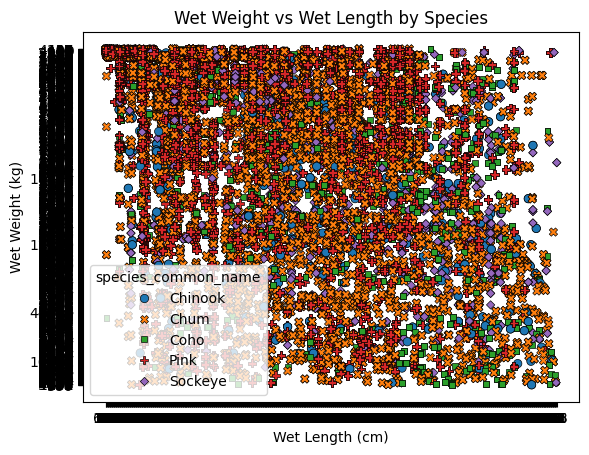

In [590]:
sns.scatterplot(data=salmon, x='length_wet_cm', y='weight_wet_grams', hue='species_common_name', style='species_common_name', edgecolor='black')
plt.title('Wet Weight vs Wet Length by Species')
plt.xlabel('Wet Length (cm)')
plt.ylabel('Wet Weight (kg)')
plt.show()

salmon_2001
salmon_2002
salmon_2003
salmon_2004

Filter the salmon DataFrame for each year (2001, 2002, 2003, 2004)
salmon_2001 = salmon[salmon['year'] == 2001]
salmon_2002 = salmon[salmon['year'] == 2002]
salmon_2003 = salmon[salmon['year'] == 2003]
salmon_2004 = salmon[salmon['year'] == 2004]

In [591]:
salmon_2001 = salmon[salmon['year'] == 2001]
salmon_2002 = salmon[salmon['year'] == 2002]
salmon_2003 = salmon[salmon['year'] == 2003]
salmon_2004 = salmon[salmon['year'] == 2004]

salmon 2001

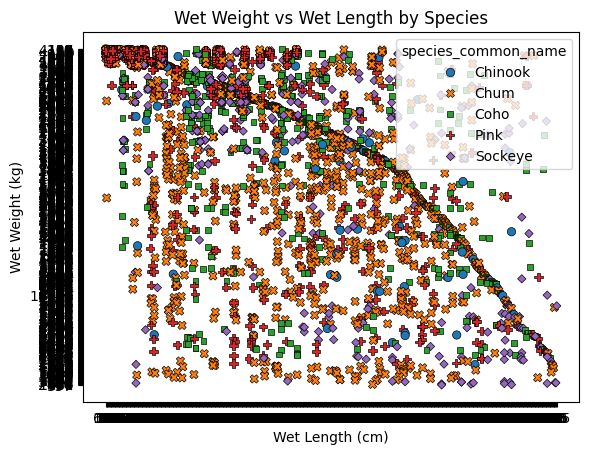

In [592]:
sns.scatterplot(data=salmon_2001, x='length_wet_cm', y='weight_wet_grams', hue='species_common_name', style='species_common_name', edgecolor='black')
plt.title('Wet Weight vs Wet Length by Species')
plt.xlabel('Wet Length (cm)')
plt.ylabel('Wet Weight (kg)')
plt.show()

salmon_2002

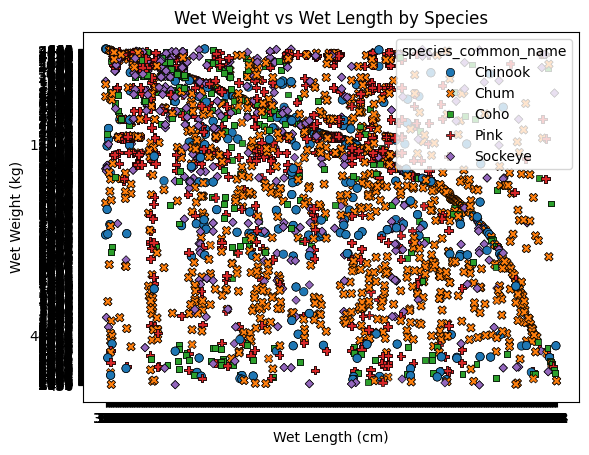

In [593]:
sns.scatterplot(data=salmon_2002, x='length_wet_cm', y='weight_wet_grams', hue='species_common_name', style='species_common_name', edgecolor='black')
plt.title('Wet Weight vs Wet Length by Species')
plt.xlabel('Wet Length (cm)')
plt.ylabel('Wet Weight (kg)')
plt.show()

salmon_2003

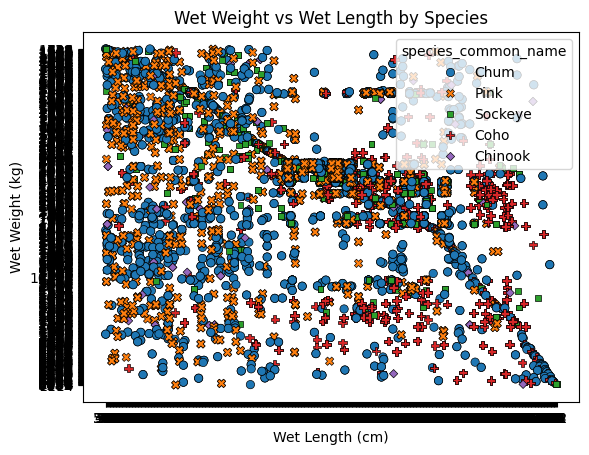

In [594]:
sns.scatterplot(data=salmon_2003, x='length_wet_cm', y='weight_wet_grams', hue='species_common_name', style='species_common_name', edgecolor='black')
plt.title('Wet Weight vs Wet Length by Species')
plt.xlabel('Wet Length (cm)')
plt.ylabel('Wet Weight (kg)')
plt.show()

salmon_2004

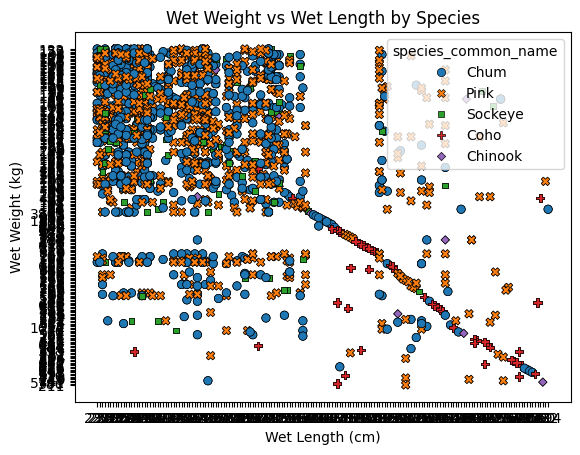

In [595]:
sns.scatterplot(data=salmon_2004, x='length_wet_cm', y='weight_wet_grams', hue='species_common_name', style='species_common_name', edgecolor='black')
plt.title('Wet Weight vs Wet Length by Species')
plt.xlabel('Wet Length (cm)')
plt.ylabel('Wet Weight (kg)')
plt.show()

## Difference Between Wet and Frozen Metrics
TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [596]:
salmon['length_diff'] = salmon['length_wet_cm'] - salmon['weight_froz_grams']
salmon['weight_diff'] = salmon['weight_wet_grams'] - salmon['weight_froz_grams']

# Histogram of length difference
sns.histplot(salmon['length_diff'], bins=20, kde=True, color='skyblue', edgecolor='black')
plt.title('Difference Between Wet and Frozen Lengths')
plt.xlabel('Length Difference (cm)')
plt.ylabel('Frequency')
plt.show()

# Histogram of weight difference
sns.histplot(salmon['weight_diff'], bins=20, kde=True, color='orange', edgecolor='black')
plt.title('Difference Between Wet and Frozen Weights')
plt.xlabel('Weight Difference (kg)')
plt.ylabel('Frequency')
plt.show()

TypeError: unsupported operand type(s) for -: 'str' and 'str'

# <span style="color:#FA8072;">2025-04-30</span>

Hypothesis anova testing

In [597]:
Anchorage_all_years_AVG_Metrics.dtypes

AVG_DRYBULB_TEMP                                  float64
AVG_DailyDepartureFromNormalAverageTemperature    float64
AVG_DailyAverageWindSpeed                         float64
AVG_HourlySeaLevelPressure                        float64
Year                                                int64
dtype: object

In [840]:
Anchorage_all_years_AVG_Metrics['station_name'] = 'Anchorage'
Barrow_all_years_AVG_Metrics['station_name'] = 'Barrow'
Bethel_all_years_AVG_Metrics['station_name'] = 'Bethel'
Fairbanks_all_years_AVG_Metrics['station_name'] = 'Fairbanks'
KING_SALMON_all_years_AVG_Metrics['station_name'] = 'King_Salmon'
KODIAK_all_years_AVG_Metrics['station_name'] = 'Kodiak'
MCGRATH_all_years_AVG_Metrics['station_name'] = 'McGrath'
NOME_all_years_AVG_Metrics['station_name'] = 'Nome'
YAKUTAT_all_years_AVG_Metrics['station_name'] = 'Yakutat'

combine them all into one master avg DF

In [841]:
# Combine them all into one MASTER dataframe
master_df = pd.concat([
    Anchorage_all_years_AVG_Metrics,
    Barrow_all_years_AVG_Metrics,
    Bethel_all_years_AVG_Metrics,
    Fairbanks_all_years_AVG_Metrics,
    KING_SALMON_all_years_AVG_Metrics,
    KODIAK_all_years_AVG_Metrics,
    MCGRATH_all_years_AVG_Metrics,
    NOME_all_years_AVG_Metrics, 
    YAKUTAT_all_years_AVG_Metrics
    # Add more here
], ignore_index=True)

# View the structure
print(master_df.head())
print(master_df.info())

   AVG_DRYBULB_TEMP  AVG_DailyDepartureFromNormalAverageTemperature  AVG_DailyAverageWindSpeed  AVG_HourlySeaLevelPressure  Year station_name
0         12.876087                                       -0.181848                   2.806522                 1008.931008  2001    Anchorage
1         13.157609                                        0.099674                   3.146739                 1011.660532  2002    Anchorage
2         13.585870                                        0.527935                   3.373913                 1011.050466  2003    Anchorage
3         13.422826                                        0.364891                   2.770652                 1011.704871  2004    Anchorage
4          1.867391                                       -1.706630                   5.466304                 1010.085095  2001       Barrow
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 6 columns):
 #   Column                                   

merge that master_df with salmon DF

In [842]:
# If your salmon data has 'year' as the column name and master_df has 'Year'
# Rename 'Year' to match 'year' in master_df
master_df = master_df.rename(columns={"Year": "year"})

In [844]:
# Merge the two dataframes on 'year'
salmon_hypo_test = pd.merge(salmon, master_df, on='year', how='inner')

check the merge

In [845]:
# Preview merged dataframe
print(salmon_hypo_test.head())
print(salmon_hypo_test.info())

   year   transect sta_id  haul_id  month_local  day_local  yrday_local  latitude  longitude depth_w_meters species_common_name length_frozen_cm length_wet_cm weight_froz_grams weight_wet_grams  sex maturity stomwt_full stomwt_empty sealice comments  AVG_DRYBULB_TEMP  AVG_DailyDepartureFromNormalAverageTemperature  AVG_DailyAverageWindSpeed  AVG_HourlySeaLevelPressure station_name
0  2001  Icy_Point    IP2  2001001            7         17          198      58.2     -137.2             64             Chinook              NaN           120               NaN              127  NaN        J           0            0       0      NaN         12.876087                                       -0.181848                   2.806522                 1008.931008    Anchorage
1  2001  Icy_Point    IP2  2001001            7         17          198      58.2     -137.2             64             Chinook              NaN           120               NaN              127  NaN        J           0            0

# Salmon Hypothesis testing

In [847]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Ensure categorical variables are treated as such
salmon_hypo_test['species_common_name'] = salmon_hypo_test['species_common_name'].astype('category')
salmon_hypo_test['year'] = salmon_hypo_test['year'].astype('category')
salmon_hypo_test['station_name'] = salmon_hypo_test['station_name'].astype('category')

# Fit the three-way ANOVA model with interactions
model = ols('weight_wet_grams ~ C(species_common_name) * C(year) * C(station_name)', data=salmon_hypo_test).fit()

# Run ANOVA test
anova_results = sm.stats.anova_lm(model, typ=2)

# Show results
print(anova_results)

ValueError: endog has evaluated to an array with multiple columns that has shape (207407, 2474). This occurs when the variable converted to endog is non-numeric (e.g., bool or str).

* if received this error, thsi is how you debug:
    * ValueError: endog has evaluated to an array with multiple columns that has shape (207407, 2474). This occurs when the variable converted to endog is non-numeric (e.g., bool or str). 

Check the column type of weight_wet_grams

In [848]:
print(salmon_hypo_test['weight_wet_grams'].dtype)

object


If it says 'object' or 'str', then we need to convert it to numeric:

In [849]:
# Clean and convert to numeric if needed
salmon_hypo_test['weight_wet_grams'] = pd.to_numeric(salmon_hypo_test['weight_wet_grams'], errors='coerce')

Drop any rows with NaN in the relevant columns

In [850]:
salmon_hypo_test = salmon_hypo_test.dropna(subset=['weight_wet_grams', 'species_common_name', 'year', 'station_name'])

Make sure all factor variables are actually categories

In [851]:
salmon_hypo_test['species_common_name'] = salmon_hypo_test['species_common_name'].astype('category')
salmon_hypo_test['year'] = salmon_hypo_test['year'].astype('category')
salmon_hypo_test['station_name'] = salmon_hypo_test['station_name'].astype('category')

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3840852023.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3840852023.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\3840852023.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

# Fit the model again
* this is how you do the anova results table

In [852]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Now run the model
model = ols('weight_wet_grams ~ C(species_common_name) * C(year) * C(station_name)', data=salmon_hypo_test).fit()
anova_results = sm.stats.anova_lm(model, typ=2)

print(anova_results)

                                                      sum_sq        df             F  PR(>F)
C(species_common_name)                                   NaN       4.0           NaN     NaN
C(year)                                                  NaN       3.0           NaN     NaN
C(station_name)                                 4.717125e-18       8.0  6.166500e-25     1.0
C(species_common_name):C(year)                  3.310161e+09      12.0  2.884823e+02     0.0
C(species_common_name):C(station_name)          7.052202e-16      32.0  2.304762e-23     1.0
C(year):C(station_name)                         1.280566e-16      24.0  5.580101e-24     1.0
C(species_common_name):C(year):C(station_name)  1.055249e-14      96.0  1.149569e-22     1.0
Residual                                        1.981552e+11  207232.0           NaN     NaN


c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:1923: RuntimeWarning: invalid value encountered in divide
c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 8, but rank is 4
c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints

save the ANOVA result table to CSV

In [853]:
# Save ANOVA table as CSV
anova_results.to_csv("anova_results_salmon.csv")

Tukey’s HSD Post-Hoc Test (e.g., for Species)

In [854]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Run Tukey HSD test
tukey_species = pairwise_tukeyhsd(
    endog=salmon_hypo_test['weight_wet_grams'],  # Dependent variable
    groups=salmon_hypo_test['species_common_name'],          # Factor to compare
    alpha=0.05                                   # Significance level
)

# Print results
print(tukey_species)

# Optionally save summary table to CSV
# Convert to DataFrame for export
tukey_df = pd.DataFrame(data=tukey_species.summary().data[1:], columns=tukey_species.summary().data[0])
tukey_df.to_csv("tukey_species_results.csv", index=False)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
 group1  group2  meandiff  p-adj   lower      upper   reject
------------------------------------------------------------
Chinook    Chum  -512.3104   0.0  -549.5816 -475.0393   True
Chinook    Coho  -573.9922   0.0  -615.2762 -532.7083   True
Chinook    Pink  -982.5746   0.0 -1019.8351 -945.3141   True
Chinook Sockeye -1042.6491   0.0 -1083.3433 -1001.955   True
   Chum    Coho   -61.6818   0.0   -84.4425  -38.9212   True
   Chum    Pink  -470.2642   0.0  -484.4776 -456.0507   True
   Chum Sockeye  -530.3387   0.0  -552.0111 -508.6663   True
   Coho    Pink  -408.5823   0.0  -431.3255 -385.8392   True
   Coho Sockeye  -468.6569   0.0  -496.6733 -440.6404   True
   Pink Sockeye   -60.0745   0.0   -81.7286  -38.4205   True
------------------------------------------------------------


if reject equals true what does that tell us again?

reject = True in Tukey’s HSD
When the reject column is True, it means:

✅ There is a statistically significant difference between the two groups being compared.

💡 Example
Suppose this row appears in the output:


group1	group2	meandiff	p-adj	lower	upper	reject
pink	sockeye	-320.5	0.004	-500.1	-140.9	True
This means:

The mean wet weight of pink salmon is significantly different from that of sockeye salmon.

The p-value (p-adj = 0.004) is less than 0.05, so the test rejects the null hypothesis that these group means are equal.

The confidence interval (lower, upper) does not contain zero, which confirms this.

In [598]:
salmon.dtypes

year                     int64
transect                object
sta_id                  object
haul_id                  int64
month_local              int64
day_local                int64
yrday_local              int64
latitude               float64
longitude              float64
depth_w_meters          object
species_common_name     object
length_frozen_cm        object
length_wet_cm           object
weight_froz_grams       object
weight_wet_grams        object
sex                     object
maturity                object
stomwt_full             object
stomwt_empty            object
sealice                 object
comments                object
dtype: object

# Species-wise yearly Correlation Test
see if thje rising temperatures are assoicated with changes in salmon weight across multiple weather stations


Hypothesis
Null (H₀): Changes in temperature do not correlate with wet weight for a given salmon species across years.

Alternative (H₁): Changes in temperature do correlate with wet weight across years (e.g., as temps rise, weights drop).

You want to test this for each species — perhaps even at each station if you want finer analysis.

In [855]:
salmon_hypo_test['year'] = salmon_hypo_test['year'].astype(int)
salmon_hypo_test['species_common_name'] = salmon_hypo_test['species_common_name'].astype(str)

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2055694153.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\2055694153.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [856]:
from scipy.stats import pearsonr

results = []

# Loop over species
for sp in salmon_hypo_test['species_common_name'].unique():
    sp_data = salmon_hypo_test[salmon_hypo_test['species_common_name'] == sp]

    # Group by year: average temperature and average weight
    yearly_avg = sp_data.groupby('year').agg({
        'AVG_DRYBULB_TEMP': 'mean',
        'weight_wet_grams': 'mean'
    }).dropna()

    # If at least 2 data points exist
    if len(yearly_avg) >= 2:
        corr, pval = pearsonr(yearly_avg['AVG_DRYBULB_TEMP'], yearly_avg['weight_wet_grams'])
        results.append({
            'species_common_name': sp,
            'n_years': len(yearly_avg),
            'correlation': corr,
            'p_value': pval
        })

# Create a results dataframe
correlation_df = pd.DataFrame(results)

# Display results
print(correlation_df)

  species_common_name  n_years  correlation   p_value
0             Chinook        4    -0.863552  0.136448
1                Chum        4    -0.468981  0.531019
2                Coho        4    -0.388098  0.611902
3                Pink        4    -0.725721  0.274279
4             Sockeye        4    -0.981635  0.018365


* Interpretation
    * If p-value < 0.05 and correlation is strong (>|0.7|) → there’s a statistically significant relationship.

    * Negative correlation suggests higher temps = smaller weights (possible stress).

    * Positive correlation could suggest improved growth conditions (depending on species ecology).

n_years

The n_years value represents:

The number of years for which average temperature and average wet weight data were available and used in the correlation test for a given species.

To calculate Pearson correlation, you need paired data points — in this case, one pair per year:

📈 Avg temperature for that year

🐟 Avg wet weight for that same year

So n_years = 4 means:

There were 4 years (e.g., 2001–2004) where the dataset had both:

Average temperature (AVG_DRYBULB_TEMP)

Average salmon weight (weight_wet_grams)

These 4 pairs were used to calculate the correlation for that species.

If a year was missing one of those values (say, no weight data for 2002 for pink salmon), it would be excluded, and n_years would drop accordingly.

* n_years |	What it means
* 4	      | All 4 years had complete data
* < 4     |	Some years were missing weight or temperature

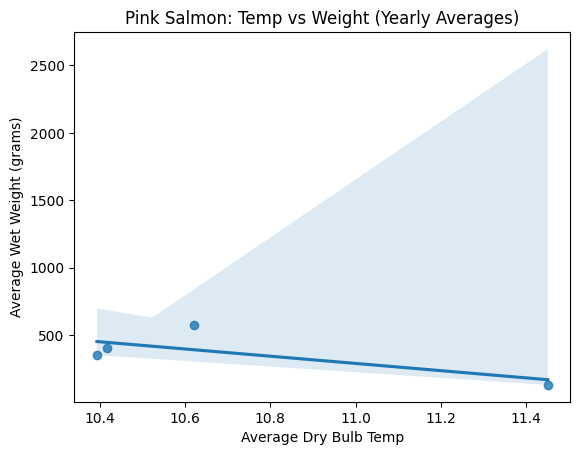

In [858]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pick one species, e.g., 'pink'
sp = 'Pink'
sp_data = salmon_hypo_test[salmon_hypo_test['species_common_name'] == sp]
yearly_avg = sp_data.groupby('year').agg({
    'AVG_DRYBULB_TEMP': 'mean',
    'weight_wet_grams': 'mean'
}).dropna().reset_index()

sns.regplot(x='AVG_DRYBULB_TEMP', y='weight_wet_grams', data=yearly_avg)
plt.title(f'{sp.title()} Salmon: Temp vs Weight (Yearly Averages)')
plt.xlabel('Average Dry Bulb Temp')
plt.ylabel('Average Wet Weight (grams)')
plt.show()

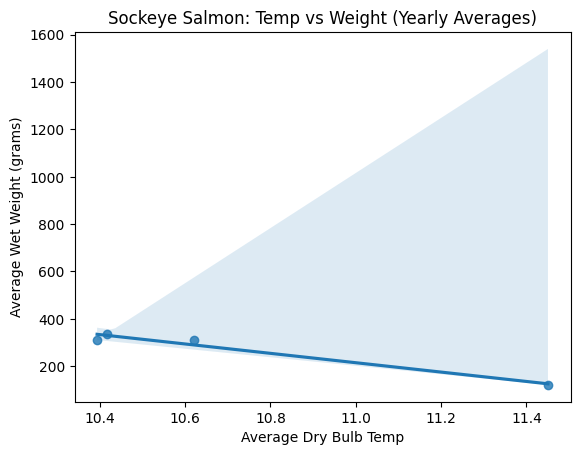

In [859]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pick one species, e.g., 'pink'
sp = 'Sockeye'
sp_data = salmon_hypo_test[salmon_hypo_test['species_common_name'] == sp]
yearly_avg = sp_data.groupby('year').agg({
    'AVG_DRYBULB_TEMP': 'mean',
    'weight_wet_grams': 'mean'
}).dropna().reset_index()

sns.regplot(x='AVG_DRYBULB_TEMP', y='weight_wet_grams', data=yearly_avg)
plt.title(f'{sp.title()} Salmon: Temp vs Weight (Yearly Averages)')
plt.xlabel('Average Dry Bulb Temp')
plt.ylabel('Average Wet Weight (grams)')
plt.show()

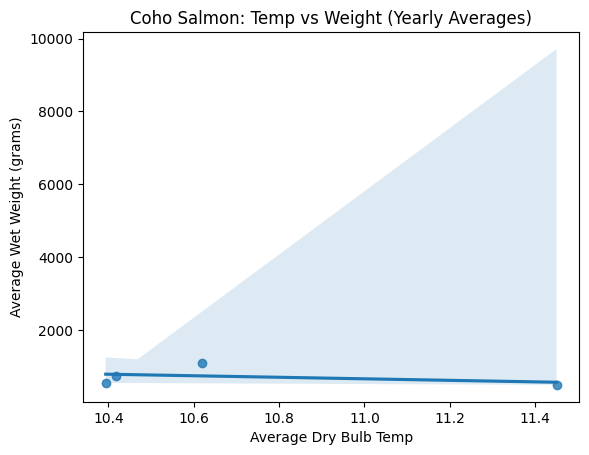

In [860]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pick one species, e.g., 'pink'
sp = 'Coho'
sp_data = salmon_hypo_test[salmon_hypo_test['species_common_name'] == sp]
yearly_avg = sp_data.groupby('year').agg({
    'AVG_DRYBULB_TEMP': 'mean',
    'weight_wet_grams': 'mean'
}).dropna().reset_index()

sns.regplot(x='AVG_DRYBULB_TEMP', y='weight_wet_grams', data=yearly_avg)
plt.title(f'{sp.title()} Salmon: Temp vs Weight (Yearly Averages)')
plt.xlabel('Average Dry Bulb Temp')
plt.ylabel('Average Wet Weight (grams)')
plt.show()

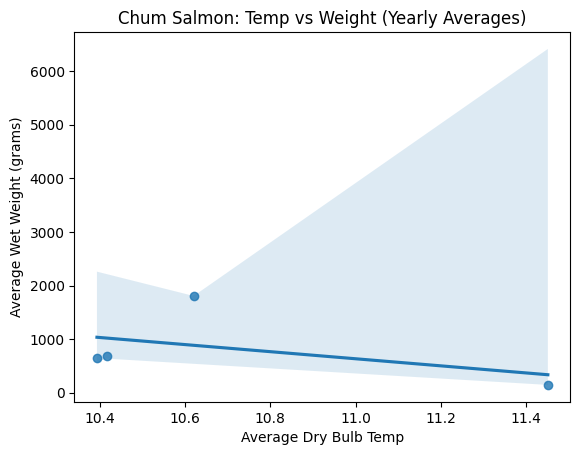

In [861]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pick one species, e.g., 'pink'
sp = 'Chum'
sp_data = salmon_hypo_test[salmon_hypo_test['species_common_name'] == sp]
yearly_avg = sp_data.groupby('year').agg({
    'AVG_DRYBULB_TEMP': 'mean',
    'weight_wet_grams': 'mean'
}).dropna().reset_index()

sns.regplot(x='AVG_DRYBULB_TEMP', y='weight_wet_grams', data=yearly_avg)
plt.title(f'{sp.title()} Salmon: Temp vs Weight (Yearly Averages)')
plt.xlabel('Average Dry Bulb Temp')
plt.ylabel('Average Wet Weight (grams)')
plt.show()

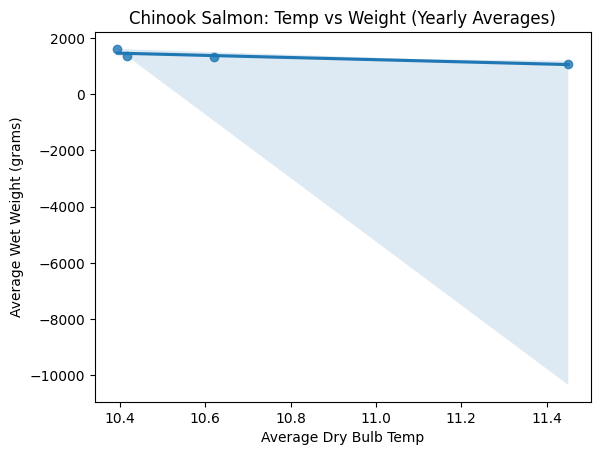

In [862]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pick one species, e.g., 'pink'
sp = 'Chinook'
sp_data = salmon_hypo_test[salmon_hypo_test['species_common_name'] == sp]
yearly_avg = sp_data.groupby('year').agg({
    'AVG_DRYBULB_TEMP': 'mean',
    'weight_wet_grams': 'mean'
}).dropna().reset_index()

sns.regplot(x='AVG_DRYBULB_TEMP', y='weight_wet_grams', data=yearly_avg)
plt.title(f'{sp.title()} Salmon: Temp vs Weight (Yearly Averages)')
plt.xlabel('Average Dry Bulb Temp')
plt.ylabel('Average Wet Weight (grams)')
plt.show()

Full Code for Per-Station, Per-Species Correlation

In [863]:
from scipy.stats import pearsonr
import pandas as pd

results = []

# Group by species and station
grouped = salmon_hypo_test.groupby(['species_common_name', 'station_name'])

for (species, station), group_data in grouped:
    # Group by year: calculate averages
    yearly_avg = group_data.groupby('year').agg({
        'AVG_DRYBULB_TEMP': 'mean',
        'weight_wet_grams': 'mean'
    }).dropna()

    if len(yearly_avg) >= 2:
        corr, pval = pearsonr(yearly_avg['AVG_DRYBULB_TEMP'], yearly_avg['weight_wet_grams'])
        results.append({
            'species_common_name': species,
            'station_name': station,
            'n_years': len(yearly_avg),
            'correlation': corr,
            'p_value': pval
        })

# Convert to DataFrame
station_corr_df = pd.DataFrame(results)

# View the output
print(station_corr_df)

   species_common_name station_name  n_years  correlation   p_value
0              Chinook    Anchorage        4     0.215595  0.784405
1              Chinook       Barrow        4    -0.769041  0.230959
2              Chinook       Bethel        4    -0.638309  0.361691
3              Chinook    Fairbanks        4    -0.921123  0.078877
4              Chinook  King_Salmon        4    -0.691322  0.308678
5              Chinook       Kodiak        4    -0.802533  0.197467
6              Chinook      McGrath        4    -0.995746  0.004254
7              Chinook         Nome        4    -0.759382  0.240618
8              Chinook      Yakutat        3     0.270054  0.825917
9                 Chum    Anchorage        4    -0.323919  0.676081
10                Chum       Barrow        4    -0.315667  0.684333
11                Chum       Bethel        4    -0.324753  0.675247
12                Chum    Fairbanks        4    -0.100691  0.899309
13                Chum  King_Salmon        4    

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\1922911537.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


export station_corr_df to CSV or TXT
VERY USEFUL

In [865]:
station_corr_df.to_csv("station_species_correlation.csv", index=False)


In [ ]:
station_corr_df.to_csv("station_species_correlation.txt", sep="\t", index=False)


Interpretation
You can now see which station/species pairs show strong temperature-weight trends.

Focus on rows where p_value < 0.05 and correlation is strongly positive or negative (e.g., > 0.7 or < -0.7).

Can also do the above by visualizing one group

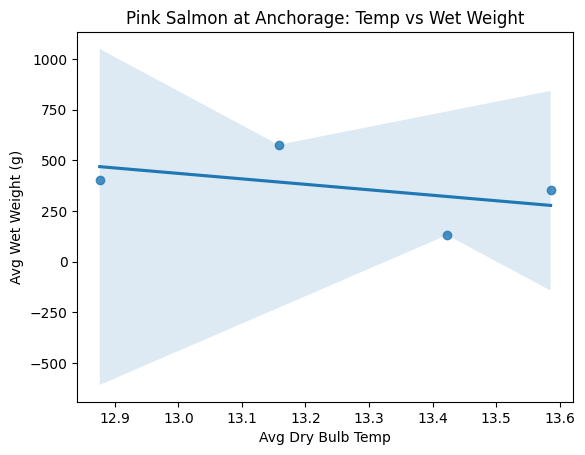

In [864]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter for pink salmon at Anchorage
plot_data = salmon_hypo_test[
    (salmon_hypo_test['species_common_name'] == 'Pink') &
    (salmon_hypo_test['station_name'] == 'Anchorage')
]

# Group to get yearly averages
yearly = plot_data.groupby('year').agg({
    'AVG_DRYBULB_TEMP': 'mean',
    'weight_wet_grams': 'mean'
}).dropna().reset_index()

# Plot
sns.regplot(x='AVG_DRYBULB_TEMP', y='weight_wet_grams', data=yearly)
plt.title("Pink Salmon at Anchorage: Temp vs Wet Weight")
plt.xlabel("Avg Dry Bulb Temp")
plt.ylabel("Avg Wet Weight (g)")
plt.show()

Mann-Whitney U test

Use if: You want to compare salmon weights between two stations or two years, and the data is not normally distributed.

Goal: Check if medians differ without assuming normality.

In [ ]:
from scipy.stats import mannwhitneyu
group1 = salmon_hypo_test[salmon_hypo_test['station_name'] == 'Anchorage']['weight_wet_grams']
group2 = salmon_hypo_test[salmon_hypo_test['station_name'] == 'Barrow']['weight_wet_grams']
mannwhitneyu(group1, group2)

Kruskal-Wallis H Test (non-parametric alternative to one-way ANOVA)


Use if: You want to compare 3+ groups (e.g., multiple stations or years), and data isn’t normal.

Goal: Test if at least one group differs.

In [ ]:
from scipy.stats import kruskal
kruskal(
    *[group['weight_wet_grams'].values for name, group in salmon_hypo_test.groupby('station_name')]
)

Chi-Square Test for Independence

Use if: You want to see if categorical variables like species and station_name are related.

Goal: Are certain species more commonly caught at certain stations?

In [ ]:
from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(salmon_hypo_test['species'], salmon_hypo_test['station_name'])
chi2_contingency(contingency_table)

Time-Series Trend Test (Kendall's Tau / Mann-Kendall)
Use if: You want to check for increasing/decreasing trend in weights or temps over time.

Goal: Statistically detect monotonic trends year to year.

In [ ]:
# Example with pymannkendall (install with pip install pymannkendall)
import pymannkendall as mk
mk.original_test(salmon_hypo_test.groupby("year")['weight_wet_grams'].mean().dropna())


Mixed Effects Models


Use if: You suspect random variation across years or stations (e.g., nested effects).

Goal: Account for fixed effects (e.g., temperature) while controlling for random effects (e.g., station).

In [ ]:
import statsmodels.formula.api as smf
model = smf.mixedlm("weight_wet_grams ~ AVG_DRYBULB_TEMP + species", 
                    data=salmon_hypo_test, 
                    groups=salmon_hypo_test["station_name"])
model_fit = model.fit()
print(model_fit.summary())

Regression with Interaction Terms
Want to test:

How temperature, species, station_name, and their interactions** affect salmon weight**

This is a multiple regression with categorical predictors and interactions.

weight_wet_grams ~ temperature + species + station + species:temperature + station:temperature + species:station

In [866]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Ensure all predictors are properly typed
salmon_hypo_test = salmon_hypo_test.dropna(subset=['weight_wet_grams', 'AVG_DRYBULB_TEMP'])

salmon_hypo_test['species_common_name'] = salmon_hypo_test['species_common_name'].astype('category')
salmon_hypo_test['station_name'] = salmon_hypo_test['station_name'].astype('category')

# Run regression with interactions
interaction_model = ols(
    'weight_wet_grams ~ C(species_common_name) * C(station_name) * AVG_DRYBULB_TEMP',
    data=salmon_hypo_test
).fit()

# Display regression summary
print(interaction_model.summary())

                            OLS Regression Results                            
Dep. Variable:       weight_wet_grams   R-squared:                       0.083
Model:                            OLS   Adj. R-squared:                  0.083
Method:                 Least Squares   F-statistic:                     212.2
Date:                Wed, 30 Apr 2025   Prob (F-statistic):               0.00
Time:                        17:27:12   Log-Likelihood:            -1.7330e+06
No. Observations:              207407   AIC:                         3.466e+06
Df Residuals:                  207317   BIC:                         3.467e+06
Df Model:                          89                                         
Covariance Type:            nonrobust                                         
                                                                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

What to Look For
p-values of interaction terms (e.g., C(species)[T.pink]:AVG_DRYBULB_TEMP)
→ shows whether temp has a different effect for that species or station.

Coefficient signs

Positive = higher temps increase weight

Negative = higher temps decrease weight

R-squared for overall model fit

In [867]:
with open("regression_summary.txt", "w") as f:
    f.write(interaction_model.summary().as_text())

Temperature vs Weight by Species (Faceted)


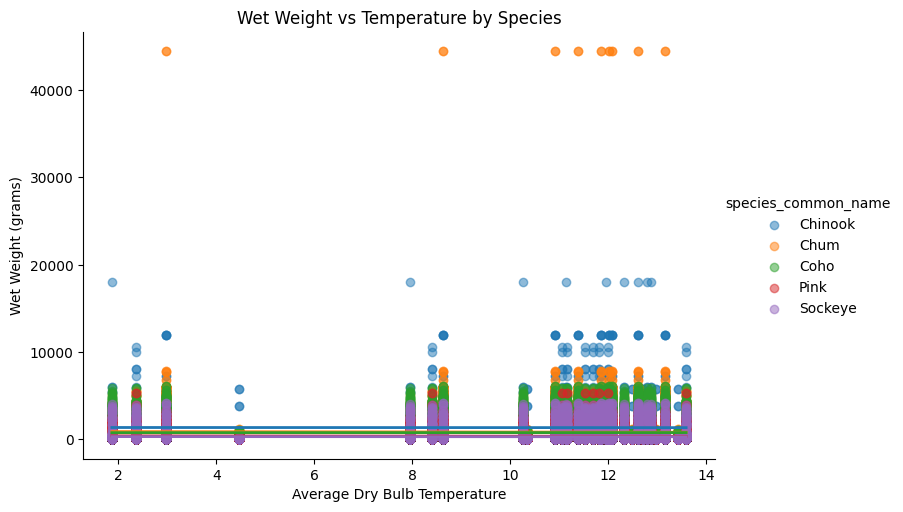

In [868]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.lmplot(
    data=salmon_hypo_test,
    x='AVG_DRYBULB_TEMP',
    y='weight_wet_grams',
    hue='species_common_name',
    aspect=1.5,
    height=5,
    scatter_kws={'alpha': 0.5},
    line_kws={'linewidth': 2}
)

plt.title("Wet Weight vs Temperature by Species")
plt.xlabel("Average Dry Bulb Temperature")
plt.ylabel("Wet Weight (grams)")
plt.show()

Temperature vs Weight by Station (Faceted)
This shows temperature-weight relationships per station.

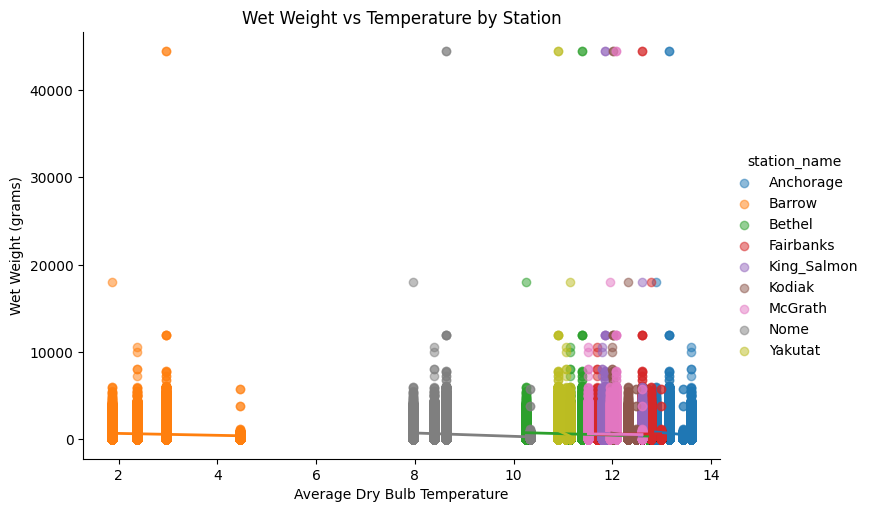

In [869]:
sns.lmplot(
    data=salmon_hypo_test,
    x='AVG_DRYBULB_TEMP',
    y='weight_wet_grams',
    hue='station_name',
    aspect=1.5,
    height=5,
    scatter_kws={'alpha': 0.5},
    line_kws={'linewidth': 2}
)

plt.title("Wet Weight vs Temperature by Station")
plt.xlabel("Average Dry Bulb Temperature")
plt.ylabel("Wet Weight (grams)")
plt.show()

Interaction Plot: Species × Station × Temperature
To really capture the interaction, you can facet by station_name and color by species:

Text(0.5, 0.98, 'Interaction: Temp vs Weight per Station × Species')

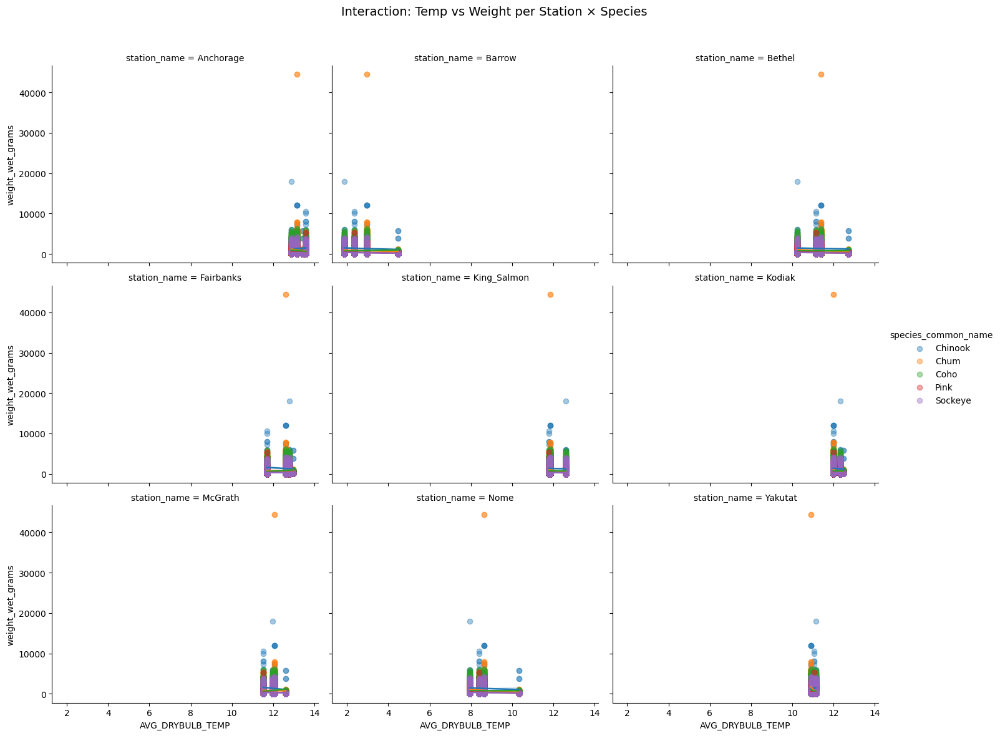

In [870]:
g = sns.lmplot(
    data=salmon_hypo_test,
    x='AVG_DRYBULB_TEMP',
    y='weight_wet_grams',
    hue='species_common_name',
    col='station_name',
    col_wrap=3,
    height=4,
    aspect=1.2,
    scatter_kws={'alpha': 0.4},
    line_kws={'linewidth': 1.8}
)

g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Interaction: Temp vs Weight per Station × Species", fontsize=14)

Animate and do year by year analysis

What This Shows You
Each frame = 1 year (2001 → 2004)

Each point = 1 species at a station

Motion shows how salmon weight and temperature change over time

Facets separate the view by station so you can compare them in parallel

In [871]:
import plotly.express as px

# Optional: create a summary dataframe to reduce noise (avg per year/species/station)
animated_df = (
    salmon_hypo_test
    .groupby(['year', 'species_common_name', 'station_name'], as_index=False)
    .agg({
        'AVG_DRYBULB_TEMP': 'mean',
        'weight_wet_grams': 'mean'
    })
    .dropna()
)

# Plotly animated scatter
fig = px.scatter(
    animated_df,
    x='AVG_DRYBULB_TEMP',
    y='weight_wet_grams',
    animation_frame='year',
    animation_group='species_common_name',
    color='species_common_name',
    facet_col='station_name',
    hover_name='species_common_name',
    size_max=25,
    labels={
        "AVG_DRYBULB_TEMP": "Avg Temperature (°C)",
        "weight_wet_grams": "Wet Weight (g)"
    },
    title="Animated Yearly Trends: Temperature vs Wet Weight per Station and Species",
    height=600
)

fig.update_traces(marker=dict(size=12, opacity=0.7))
fig.update_layout(transition={'duration': 500})
fig.show()

C:\Users\mecto\AppData\Local\Temp\ipykernel_19416\4028561544.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


ValueError: Length of values (175) does not match length of index (180)

# <span style="color:#00ff00"> Reference Lists</span>

## <span style="color:#00ff00"> Resources/Python</span>

Python Libraries You Can Use:

* pandas, numpy: data manipulation.
* biopython: parsing genomic data (FASTA, GenBank, etc.).
* scikit-learn: clustering, PCA, and machine learning.
* matplotlib, seaborn, plotly: visualizations like heatmaps, scatter plots, and interactive graphs.
* statsmodels, scipy: statistical testing.
* pyvcf: handling VCF files (Variant Call Format).
* scikit-bio: more advanced bioinformatics analyses.

2025-02-26
* plotnine

R
* Ggplot2
    *facet wrap

How to visualize [salmon populations] across regions like in Presentation 1 blurb:
*  You can visualize this using XYZ
    * XYZ: definition


Random [Farm-Fishing] readings/findings:

* Fishing clusters
    * Visualize this with heatmaps
        * this is proabbaly the greatest visual representation method for this data
* Most popular species of salmon fished for commercial use 
* Most popular brands who sell in grocery stores/distribute to restaurants or businesses

## <span style="color:#00ff00;">Sources/Readings/Datasets</span>

Fishing
* https://www.nationalfisherman.com/alaska/alaska-salmon-2024-markets-still-flooded-as-next-harvest-forecasts-come-in#:~:text=Overall%2C%20values%20for%20all%20species,that%20was%20generated%20in%202022. 
* https://www.undercurrentnews.com/2025/01/30/global-salmon-supply-down-in-2024-due-to-underperforming-alaska-fisheries-gsmc-attendees-hear/
* https://www.ibisworld.com/united-states/economic-profiles/alaska/
* https://www.noaa.gov/fisheries
* https://www.adfg.alaska.gov/index.cfm?adfg=home.main

Climate
* https://sealevel.nasa.gov/
* https://climate.nasa.gov/vital-signs/sea-level/?intent=121
* https://www.noaa.gov/

Economy
* https://www.theglobaleconomy.com/download-data.php
* https://gis.data.alaska.gov/datasets/DCCED::employment-and-wages-2001-to-2016-all-locations/about
    * https://gis.data.alaska.gov/datasets/DCCED::employment-and-wages-2001-to-2016-all-locations/explore?location=0.001964%2C0.000000%2C1.99&showTable=true

    * Statista
        * https://www.statista.com/statistics/187828/gdp-of-the-us-federal-state-of-alaska-since-1997/
        * https://www.statista.com/statistics/205753/median-household-income-in-alaska/
        * https://www.statista.com/statistics/205426/poverty-rate-in-alaska/
        * https://www.statista.com/statistics/205206/per-capita-personal-income-in-alaska/
        * https://www.statista.com/statistics/1036036/alaska-real-gdp-growth/
        * https://www.statista.com/statistics/189390/unemployment-rate-in-alaska-since-1992/


### <span style="color:#FFA07A;">Datasets</span>


* NOAA
    * NOAA Climatological Data
        * https://www.ncdc.noaa.gov/cdo-web/datatools/lcd
    * NOAA Fisheries
* Alaska Department of Fish and Games
* NASA & NOAA Climate Data
* FAI Fisheries $ Aquaculture Division
* https://www.bco-dmo.org/dataset/3106
    * https://erddap.bco-dmo.org/erddap/tabledap/bcodmo_dataset_3106.htmlTable

## <span style="color:#00ff00;">Definitions/Dictionary [Not in Use]</span>

* word: definitions. 
    
    * How [blank] occur:
    
        A 

* word: definitions. 
    
    * How [meausrements] are done:
    
        A 

Exvessel - People call this the “ex-vessel” price, direct payment to the boat for fish that just a few hours earlier were swimming in the ocean

Exvessel preliminary - The preliminary price paid to fisherman as reported by the processor.

ex-vessel final price- refers to the actual price that fishermen receive for their catch after all quality bonuses, adjustments, and other incentives have been factored in

## <span style="color:#00ff00"> Ideas/Future Devolpments</span>

* Biology

    * Genetics
        * Gene Expression and Disease Correlation
            Hypothesis: Specific gene expression patterns are strongly correlated with certain diseases (like cancer, diabetes, etc.).
            Approach: Utilize RNA-seq datasets from sources like the Cancer Genome Atlas (TCGA) to find correlations between gene expression levels and disease status. Heatmaps or volcano plots could be used to visualize differential gene expression.
        * Genetic Basis of Physical Traits
            Hypothesis: Variations in certain genes are associated with observable traits like height, eye color, or even susceptibility to certain conditions.
            Approach: You could explore GWAS (Genome-Wide Association Study) datasets to see if specific SNPs are linked to traits. Manhattan plots are great for visualizing this kind of data.
        * Evolutionary Genomics
            Hypothesis: Comparing the genomes of different species reveals evolutionary relationships and conserved genes.
            Approach: Use comparative genomics data to find conserved sequences between species. Phylogenetic trees and sequence alignment visualizations can help illustrate evolutionary relationships.
        * Microbiome Diversity Analysis
            Hypothesis: The diversity of microbial genes in the gut microbiome varies significantly with diet, geography, or health status.
            Approach: Analyze microbiome datasets (like from the Human Microbiome Project) and visualize microbial diversity using bar plots, heatmaps, or ordination techniques like NMDS (Non-metric Multidimensional Scaling).
    

* Healthcare
    * Hospital datasets
* Animals
	* Animal Genes
	* Marine fish
	* Marine biology dataset

* Weather
	* https://www.ncdc.noaa.gov/cdo-web/datasets
    * Climate change
	    * the effects on climate change through the years, temperatures
 

* Finance
    * default

## <span style="color:#00ff00">TO DO - Need to filter Datasets - 04/04/2025</span>

* Do the same thing for all the other 9 weather stations how I have it set up for Anchorage


* Once this is done then you can go and clean up this notebook and create filtered Tabs so its like:

* Anchorage
    * Data
    * Graphs

* [2nd Weather Station]
    * Data
    * Graphs


*Anchorage
Barrow
Bethel
Faribanks
Juneau
King Salmon
Kodiak
McGrath
Nome
Yakutat*

# 2025-04-17

* I am going to complete all 10 station dashboards today. Once this is done the notebook is pretty cleaned up. May start thinking about having the interactble website so a User can go and click on the Stations and see metrics.

* Either later today or this week I will finish the project by testing the hypothesis at the beginning and seeing the results. Either do so in python or figure out how to test in R with some sort of metrics I have gathered here. (Most likely will use the 'Metrics' tab found in here and create some sort of R tables and run some statistical analysis.)


Completed merging for Barrow, Bethel, FAIRBANKS, 

* Need to do the same graphs for the completed weather stations
    * ran into another error for stations after Fairbanks for the AVG metrics so need to debug

* Started work on creating the interactable website so it is easier to view
    * Eventually when I get all stations squared away will start playing around with aesthetic

# Sources for my paper

* https://alaskabeacon.com/briefs/alaskas-seafood-industry-lost-1-8-billion-last-year-noaa-report-says/

* https://labor.state.ak.us/
    * https://labor.state.ak.us/trends/jun04.pdf

# is there a way you can forecast how much salmon is caught in years following if I have the metrics for years 2001-2004, say I want to forecast what the following years would look like based on the current values?

Yes, it is possible to forecast future salmon catches based on historical data, such as from 2001 to 2004, using various forecasting techniques. One of the most common approaches for time series forecasting is to use ARIMA (AutoRegressive Integrated Moving Average) or Prophet (a forecasting tool developed by Facebook) to make predictions based on past values.

Here's a general approach to forecast future years based on the available data:

Steps to Forecast Future Salmon Catches:
Prepare the Data: Organize the data in a way that can be used by a forecasting model. This typically involves ensuring that your dataset is in a time series format (i.e., a sequence of data points ordered by time).

Choose a Forecasting Method:

ARIMA (AutoRegressive Integrated Moving Average): This is a popular method that can handle time series data with trends and seasonality.

Prophet: An easy-to-use tool for forecasting, especially if you have seasonality and holidays in your data.

Train the Model: Use the data from 2001-2004 to train the model and then forecast future years (e.g., 2005 and beyond).

Evaluate the Model: Check the accuracy of your model by comparing predicted values to known data points (if available).

Below is an example of how you can use ARIMA (using statsmodels in Python) and Prophet for forecasting salmon catches based on past years.

Example with ARIMA:
Let's say you have data on the total salmon caught each year (from 2001-2004), and you want to forecast the following years:

python
Copy


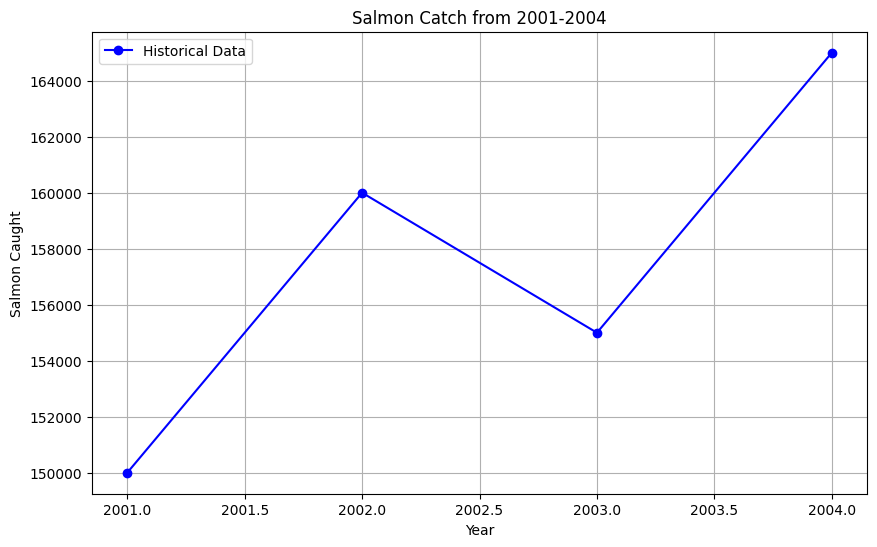

c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
c:\Users\mecto\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to e

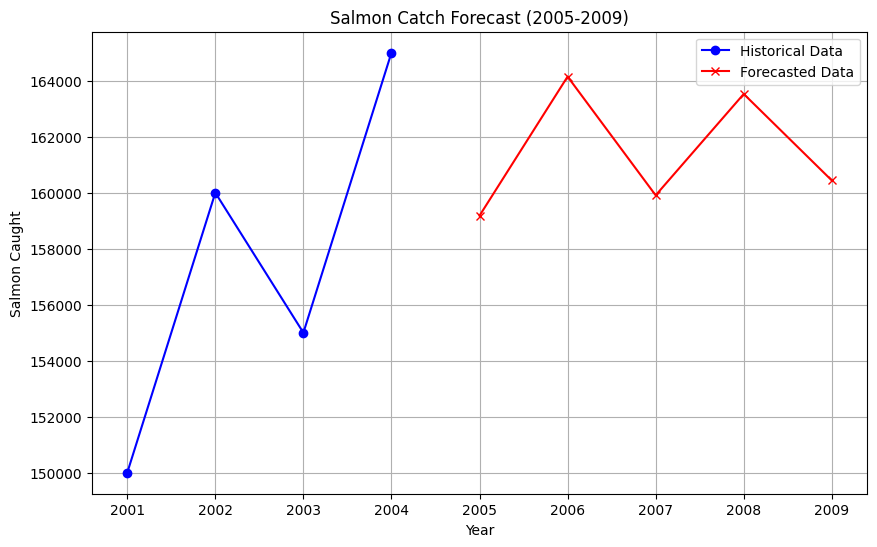

Forecasted Salmon Caught for 2005-2009:
2005: 159180.38
2006: 164147.74
2007: 159907.83
2008: 163526.82
2009: 160437.82


In [180]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Example Data (replace with your actual salmon catch data)
data = {
    'Year': [2001, 2002, 2003, 2004],
    'Salmon_Caught': [150000, 160000, 155000, 165000]  # Example data (replace with your values)
}

# Create DataFrame
df = pd.DataFrame(data)

# Set 'Year' as the index
df.set_index('Year', inplace=True)

# Plot the historical data
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Salmon_Caught'], marker='o', color='b', label='Historical Data')
plt.xlabel('Year')
plt.ylabel('Salmon Caught')
plt.title('Salmon Catch from 2001-2004')
plt.legend()
plt.grid(True)
plt.show()

# Fit an ARIMA model (adjust parameters based on data characteristics)
model = ARIMA(df['Salmon_Caught'], order=(1, 1, 1))  # (p, d, q) for ARIMA
model_fit = model.fit()

# Forecast the next 5 years (2005-2009)
forecast = model_fit.forecast(steps=5)

# Plot the forecasted data
forecast_years = np.arange(2005, 2010)
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Salmon_Caught'], marker='o', color='b', label='Historical Data')
plt.plot(forecast_years, forecast, marker='x', color='r', label='Forecasted Data')
plt.xlabel('Year')
plt.ylabel('Salmon Caught')
plt.title('Salmon Catch Forecast (2005-2009)')
plt.legend()
plt.grid(True)
plt.show()

# Print forecasted values
print("Forecasted Salmon Caught for 2005-2009:")
for year, value in zip(forecast_years, forecast):
    print(f"{year}: {value:.2f}")

Explanation of the ARIMA Code:
order=(1, 1, 1): The ARIMA model has three parameters:

p (autoregressive order),

d (degree of differencing to make the series stationary),

q (moving average order). You can adjust these based on your dataset's behavior.

model.fit(): Fits the ARIMA model to the historical data (2001-2004).

forecast(): Forecasts the salmon catch for the next 5 years (2005-2009).

Plotting: Shows the historical data (2001-2004) and the forecasted data for the next 5 years.

Example with Prophet:
If you want to use Prophet for forecasting, it's very easy to set up. Here's an example of how you can use Prophet to forecast the salmon catches:

In [181]:
from fbprophet import Prophet

# Example Data (replace with your actual salmon catch data)
data = {
    'ds': ['2001-01-01', '2002-01-01', '2003-01-01', '2004-01-01'],  # 'ds' is the date column
    'y': [150000, 160000, 155000, 165000]  # 'y' is the value column (salmon caught)
}

# Create DataFrame
df = pd.DataFrame(data)

# Convert the 'ds' column to datetime
df['ds'] = pd.to_datetime(df['ds'])

# Fit a Prophet model
model = Prophet()
model.fit(df)

# Create a DataFrame for future years to forecast
future = model.make_future_dataframe(df, periods=5, freq='Y')  # Forecast for the next 5 years (2005-2009)

# Forecast the future values
forecast = model.predict(future)

# Plot the forecast
model.plot(forecast)
plt.title('Salmon Catch Forecast with Prophet')
plt.xlabel('Year')
plt.ylabel('Salmon Caught')
plt.show()

# Print forecasted values
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(5))

ModuleNotFoundError: No module named 'fbprophet'

Explanation of the Prophet Code:
Prophet(): This creates a Prophet model.

make_future_dataframe(): This creates a dataframe for future dates (in this case, the next 5 years).

predict(): This generates the forecast for future years.

Plotting: Shows the historical data along with the forecasted values.

yhat, yhat_lower, yhat_upper: These represent the predicted values, along with lower and upper confidence intervals.

Choosing the Model:
ARIMA is a more traditional approach for time series forecasting and is great if the data shows a trend or seasonality. You can tune the parameters (p, d, q) to fit your data.

Prophet is often easier to use and is particularly powerful for time series with seasonality and holidays. It’s more flexible and can handle various data issues (e.g., missing values, outliers).

Next Steps:
Prepare your data: Ensure you have the data in the appropriate format for the forecasting models.

Test different models: Try both ARIMA and Prophet to see which works better for your data.

Tune the models: Adjust the model parameters to improve the accuracy of the forecast.

Let me know if you need help with the implementation or further adjustments!